# Figure 7

In [1]:
%load_ext watermark
%watermark -a "Etienne Ackermann," -n -t -v -p nelpy,numpy,scipy,pandas,matplotlib

Etienne Ackermann, Wed May 16 2018 16:51:57 

CPython 3.5.4
IPython 6.2.1

nelpy 0.1.2
numpy 1.11.3
scipy 0.19.0
pandas 0.19.2
matplotlib 2.1.2


# Overview

We start with all ripples observed in E2. We perform the session quality, and we identify local replays using linearization, Bayesian decoding, and regression analysis. We see that not many events are classified as local replay. We perform a session quality analysis on the residual events, and see that it is still reasonably high.

Next, we learn an HMM on all the ripples (could also have trained a model only on the residuals), and we identify congruent events using our HMM approach. We find that several non-Bayesian significant events are deemed congruent with the model, and upon closer inspection, we see that the majority of those events seem to correspond to consistent trajectories in E1, that is, remote replay.

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import scipy.stats as stats
import warnings

import nelpy as nel
import nelpy.io
import nelpy.plotting as npl

from nelpy import hmmutils
from nelpy.decoding import k_fold_cross_validation
from nelpy.hmmutils import PoissonHMM

import nelpy.hmmutils
import nelpy.analysis

num_states = 30
ds_HMM = 0.125

%matplotlib inline

warnings.filterwarnings("ignore")

/home/etienne/anaconda3/lib/python3.5/site-packages/matplotlib/cbook/deprecation.py:106: MatplotlibDeprecationWarning: The mpl_toolkits.axes_grid module was deprecated in version 2.1. Use mpl_toolkits.axes_grid1 and mpl_toolkits.axisartist provies the same functionality instead.


### Load semi-processed Frank Lab data

In [2]:
jar = nel.load_pkl('data/BonDay3.nel')
data = jar.data

In [3]:
def prescreen(bst, n_shuffles=1000, num_states=30, k_folds=5, verbose=False):
    
    X = [ii for ii in range(bst.n_epochs)]

    scores_hmm = np.zeros(bst.n_epochs)
    scores_hmm_shuffled = np.zeros((bst.n_epochs, n_shuffles))

    for kk, (training, validation) in enumerate(k_fold_cross_validation(X, k=k_folds)):
        if verbose:
            print('  fold {}/{}'.format(kk+1, k_folds))

        PBEs_train = bst[training]
        PBEs_test = bst[validation]

        # train HMM on all training PBEs
        hmm = PoissonHMM(n_components=num_states, verbose=False)
        hmm.fit(PBEs_train)

        # reorder states according to transmat ordering
        transmat_order = hmm.get_state_order('transmat')
        hmm.reorder_states(transmat_order)

        # compute scores_hmm (log likelihoods) of validation set:
        scores_hmm[validation] = hmm.score(PBEs_test)

        for nn in range(n_shuffles):
            # shuffle data coherently within events:
            bst_shuffled = nel.analysis.replay.time_swap_bst(bst)

            PBEs_train = bst_shuffled[training]
            PBEs_test = bst_shuffled[validation]

            # train HMM on shuffled data
            hmm_shuffled = PoissonHMM(n_components=num_states, verbose=False)
            hmm_shuffled.fit(PBEs_train)

            # score validation set with shuffled-data HMM
            scores_hmm_shuffled[validation, nn] = hmm_shuffled.score(PBEs_test)
            
    return scores_hmm, scores_hmm_shuffled

In [4]:
def prescreen2(bst, n_shuffles=1000, num_states=30, k_folds=5, verbose=False, randomize=False):
    
    X = [ii for ii in range(bst.n_epochs)]

    scores_hmm = np.zeros(bst.n_epochs)
    scores_hmm_shuffled = np.zeros((bst.n_epochs, n_shuffles))

    for kk, (training, validation) in enumerate(k_fold_cross_validation(X, k=k_folds, randomize=randomize)):
        if verbose:
            print('  fold {}/{}'.format(kk+1, k_folds))

        PBEs_train = bst[training]
        PBEs_test = bst[validation]

        # train HMM on all training PBEs
        hmm = PoissonHMM(n_components=num_states, verbose=False)
        hmm.fit(PBEs_train)

        # compute scores_hmm (log likelihoods) of validation set:
        scores_hmm[validation] = hmm.score(PBEs_test)

        for nn in range(n_shuffles):
            # shuffle data pooled over all events in test set:
            bst_test_shuffled = nel.analysis.replay.pooled_time_swap_bst(PBEs_test)

            # score validation set with shuffled-data HMM
            scores_hmm_shuffled[validation, nn] = hmm.score(bst_test_shuffled)
            
    return scores_hmm, scores_hmm_shuffled

In [5]:
def compute_session_quality(bst, num_states=30, n_shuffles=200, k_folds=5, verbose=False):
    scores, shuffled = prescreen(bst=bst, 
                                 n_shuffles=n_shuffles, 
                                 num_states=num_states, 
                                 k_folds=k_folds,
                                 verbose=verbose)

    zscore = stats.zmap(scores.mean(), shuffled.mean(axis=0))
    
    
    return zscore, scores, shuffled

In [6]:
def compute_session_quality2(bst, num_states=30, n_shuffles=200, k_folds=5, verbose=False):
    scores, shuffled = prescreen2(bst=bst, 
                                 n_shuffles=n_shuffles, 
                                 num_states=num_states, 
                                 k_folds=k_folds,
                                 verbose=verbose)

    zscore = stats.zmap(scores.mean(), shuffled.mean(axis=0))
    
    
    return zscore, scores, shuffled

# See how many local and remote candidates we have in each session

Note that these are candidates as defined by Mattias Karlsson. We do not actually use these definitions in our manuscript or analysis, but it's a nice way to get a quick-and-rough idea of what's contained in the different sessions.

In [13]:
for animal, day in sessions:
    print(animal, day)
    
    try:
        bst = data[animal][day]['remote_replay_E1_in_E2']['bst_remote_candidates']
        n_remote = bst.n_epochs
        bst = data[animal][day]['remote_replay_E1_in_E2']['bst_local_candidates']
        n_local = bst.n_epochs
        print('\tlocal: {}'.format(n_local))
        print('\tremote: {}'.format(n_remote))
    except KeyError:
        print('The (animal, day) pair does not have remote replay analysis results; skipping...')
        continue

Bon Day2
	local: 38
	remote: 63
Bon Day3
	local: 22
	remote: 36
Bon Day4
	local: 19
	remote: 27
Bon Day5
	local: 24
	remote: 50
Bon Day6
	local: 18
	remote: 23
Bon Day7
	local: 0
	remote: 6
Bon Day8
	local: 111
	remote: 134
Bon Day9
	local: 24
	remote: 59
Con Day0
The (animal, day) pair does not have remote replay analysis results; skipping...
Con Day1
The (animal, day) pair does not have remote replay analysis results; skipping...
Con Day2
The (animal, day) pair does not have remote replay analysis results; skipping...
Con Day3
	local: 0
	remote: 4
Con Day4
	local: 0
	remote: 1
Con Day5
	local: 0
	remote: 0
Fra Day1
	local: 0
	remote: 0
Fra Day2
The (animal, day) pair does not have remote replay analysis results; skipping...
Fra Day3
The (animal, day) pair does not have remote replay analysis results; skipping...
Fra Day4
The (animal, day) pair does not have remote replay analysis results; skipping...
Fra Day5
	local: 139
	remote: 157
Fra Day6
The (animal, day) pair does not have remo

**Observations:** possible sessions to look at (for an almost balanced spread between local and remote events) include Bon Day 8, and Fra Day 5.

In [7]:
# k_folds = 5
# verbose = False
# num_states = 30
# n_shuffles = 2500

# bst = bst_all_ripples[candidate_ids]

# # determine model quality of residuals
# scores, shuffled = prescreen2(bst=bst, 
#                              n_shuffles=n_shuffles, 
#                              num_states=num_states, 
#                              k_folds=k_folds,
#                              verbose=verbose)

# zscore = stats.zmap(scores.mean(), shuffled.mean(axis=0))

# print(zscore)

# Choose session, preprocess events, and learn HMM

In [8]:
animal, day = 'Bon', 'Day3' # Etienne is the most familiar with this session, but it's a little smaller than the other two
# animal, day = 'Bon', 'Day8'
# animal, day = 'Fra', 'Day5'

In [9]:
def split_local_nonlocal(data, animal, day, ds_SWR=0.02):
    """Identify local and nonlocal ripples in E2, 
    where local ripples are defined as having at least 5 local place cells active,
    as well as a maximum mean running speed of 2 cm/s, irrespective of ripple duration.
    
    These local candidates were pre-computed, and are not recomputed here...
    
    Nonlocal candidates are then the complement of the local events, so it's possible 
    that some of the local candidates might be remote replay as well, and not be in
    the nonlocal pool.
    
    Returns:
    bst : all local and nonlocal ripple events
    local_ids : 
    nonlocal_ids :
    """

    # run_epochs = data[animal][day]['run_epochs']
    ripple_epochs = data[animal][day]['ripple_epochs']
    ds_SWR = 0.02

    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        st = data[animal][day]['spikes'][[5],:] # E2

    if st.isempty: # this is true for Fra Day3 epoch 0
        pass
    else:
        # get spiketrain during ripples bouts for epoch
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            st_ripples = st[ripple_epochs]

    bst_all_swr = st_ripples.bin(ds=ds_SWR)

    remote_swr_ids = data[animal][day]['remote_replay_E1_in_E2']['remote_candidate_SWR_IDs'] # 36 candidates
    local_swr_ids = data[animal][day]['remote_replay_E1_in_E2']['local_candidate_SWR_IDs'] # 22 cand; 20 common btwn local and rem
    nonlocal_ids = list(set(range(data[animal][day]['remote_replay_E1_in_E2']['all_ripples'].n_epochs)) - set(local_swr_ids))
    nonlocal_swr = data[animal][day]['remote_replay_E1_in_E2']['all_ripples'][nonlocal_ids]
    local_swr = data[animal][day]['remote_replay_E1_in_E2']['all_ripples'][local_swr_ids]

    # bst_nonlocal = nel.BinnedSpikeTrainArray(nel.AnalogSignalArray(bst_all_swr)[nonlocal_swr])
    # bst_local = nel.BinnedSpikeTrainArray(nel.AnalogSignalArray(bst_all_swr)[local_swr])

    return bst_all_swr, local_swr_ids, nonlocal_ids

def identify_candidate_ripples(bst, min_n_active=4, min_n_bins=4):
    ############################################################
    # min_n_active = 4 # number of active cells in ripple
    # min_n_bins = 4   # number of 20 ms bins in ripple
    ############################################################
    
    ##########
    n_active = []
    for snippet in bst:
        n_active.append(snippet.n_active)
    ##########    
    n_bins = []
    
    for snippet in bst:
        n_bins.append(snippet.n_bins)

    min_crit_evt_ids = list(set(np.argwhere(np.array(n_bins)>min_n_bins).squeeze()).intersection(set(np.argwhere(np.array(n_active)>min_n_active).squeeze())))
    min_crit_evt_ids.sort()

#     bst = bst[min_crit_evt_ids]
    
    residual_ids = list(set(range(bst.n_epochs)) - set(min_crit_evt_ids))
    
    return min_crit_evt_ids, residual_ids


In [10]:
bst_all_ripples, local_ids, nonlocal_ids = split_local_nonlocal(data=data,
                                                                animal=animal,
                                                                day=day,
                                                                ds_SWR=0.02)

print(bst_all_ripples)

# Enforce minimum number active (4 cells) and minimum duration (4 x 20 ms bins) criteria
candidate_ids, remaining_ids = identify_candidate_ripples(bst=bst_all_ripples,
                                           min_n_active=4,
                                           min_n_bins=4)
bst = bst_all_ripples[candidate_ids]

print(bst)

candidate_to_global_map = {}
global_to_candidate_map = {}

for ii, idx in enumerate(candidate_ids):
    candidate_to_global_map[ii] = idx
    global_to_candidate_map[idx] = ii

<BinnedSpikeTrainArray at 0x7f8a9c56be80: 74 units (162 segments) in 833 bins of width 20.0 milliseconds> for a total of 16.66 seconds
<BinnedSpikeTrainArray at 0x7f8a9c50c208: 74 units (41 segments) in 365 bins of width 20.0 milliseconds> for a total of 7.3 seconds


In [11]:
# global_to_candidate_map[126]
# candidate_to_global_map[31]

In [12]:
# train HMM:
bst_hmm = bst_all_ripples[candidate_ids] # all ripples that met min activity and min duration criteria
hmm = nel.hmmutils.PoissonHMM(n_components=num_states, verbose=False, n_iter=50)
hmm.fit(bst_hmm)

# hmm.get_state_order()
# hmm.reorder_states(hmm.get_state_order())

nelpy.PoissonHMM(init_params='stm', n_components=30, n_iter=50, params='stm',
      random_state=None, verbose=False); fit=True, fit_ext=False

In [13]:
recompute = False

if recompute:
    zscore, _, _ = compute_session_quality(bst=bst_all_ripples)
    print('all ripples in E2 (no minimum duration, and no minumum number of active cells): {}'.format(zscore))
    
    zscore, _, _ = compute_session_quality(bst=bst_all_ripples[candidate_ids])
    print('all ripples in E2 that passed the activity and duration criteria: {}'.format(zscore))
    
    bayes_threshold = 95
    bayes_sig = np.array(candidate_ids)[np.argwhere(data[animal][day]['elife']['local_replay_percentiles'] > bayes_threshold).squeeze()]
    residual_ids = list(set(candidate_ids) - set(bayes_sig))
    residual_ids.sort()

    zscore, _, _ = compute_session_quality(bst=bst_all_ripples[residual_ids])
    sprint('all ripples in E2 that passed the activity and duration criteria, excluding ({}) Bayesian significant ripples: {}'.format(bayes_threshold, zscore))

In [14]:
# jar = nel.load_pkl('novel-bayes-scores-BonDay3-partial.nel')
# results = jar.parallel_results_E1a

# data[animal][day]['elife']['remote_candidate_ids'] = candidate_ids
# data[animal][day]['elife']['remote_replay_scores'] = np.array([result[1] for result in results]).squeeze()
# data[animal][day]['elife']['remote_replay_scores_shuffled'] = np.array([result[2] for result in results]).squeeze().T
# data[animal][day]['elife']['remote_replay_percentiles'] = np.array([result[3] for result in results]).squeeze()

In [17]:
load_scores = True
if not load_scores:
    jar = nel.load_pkl('bayesian-local.nel')
    results = jar.parallel_results

    try:
        data[animal][day]['elife']['local_candidate_ids'] = candidate_ids
        data[animal][day]['elife']['local_replay_scores'] = np.array([result[1] for result in results]).squeeze()
        data[animal][day]['elife']['local_replay_scores_shuffled'] = np.array([result[2] for result in results]).squeeze().T
        data[animal][day]['elife']['local_replay_percentiles'] = np.array([result[3] for result in results]).squeeze()
    except KeyError:
        data[animal][day]['elife'] = {}
        data[animal][day]['elife']['local_candidate_ids'] = candidate_ids
        data[animal][day]['elife']['local_replay_scores'] = np.array([result[1] for result in results]).squeeze()
        data[animal][day]['elife']['local_replay_scores_shuffled'] = np.array([result[2] for result in results]).squeeze().T
        data[animal][day]['elife']['local_replay_percentiles'] = np.array([result[3] for result in results]).squeeze()

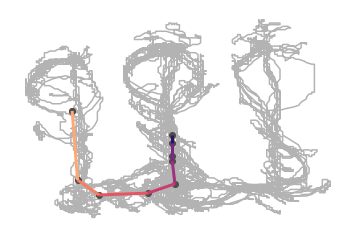

In [18]:
def plot_w_event(data, animal, day, bst, context='E1b_ideal', ax=None):
    """Plot the decoded event trajectory overlaid onto the rodent trajectory."""
    
    E1a, E1b, E2 = 1, 3, 5
        
    tc_E1a = data[animal][day]['tuning_curves2D'][E1a]
    tc_E1b = data[animal][day]['tuning_curves2D'][E1b]
    tc_E2 = data[animal][day]['tuning_curves2D'][E2]
    
    tc_E1a_ideal = data[animal][day]['tuning_curves2D_ideal'][E1a]
    tc_E1b_ideal = data[animal][day]['tuning_curves2D_ideal'][E1b]
    tc_E2_ideal = data[animal][day]['tuning_curves2D_ideal'][E2]
    
    pos_E1a = data[animal][day]['pos'][E1a]
    pos_E1b = data[animal][day]['pos'][E1b]
    pos_E2 = data[animal][day]['pos'][E2]
    
    if bst.n_epochs > 1:
        raise ValueError('bst can only contain a single event...')

    if ax is None:
        ax = plt.gca()
        
    if context == 'E1a_raw':
        posterior, lengths, mode_pth, mean_pth = nel.decoding.decode2D(bst=bst, ratemap=tc_E1a)
        npl.plot2d(pos_E1a, color='0.7', ax=ax)
    elif context == 'E1b_raw':
        posterior, lengths, mode_pth, mean_pth = nel.decoding.decode2D(bst=bst, ratemap=tc_E1b)
        npl.plot2d(pos_E1b, color='0.7', ax=ax)
    elif context == 'E2_raw':
        posterior, lengths, mode_pth, mean_pth = nel.decoding.decode2D(bst=bst, ratemap=tc_E2)
        npl.plot2d(pos_E2, color='0.7', ax=ax)    
    elif context == 'E1a_ideal':
        posterior, lengths, mode_pth, mean_pth = nel.decoding.decode2D(bst=bst, ratemap=tc_E1a_ideal)
        npl.plot2d(pos_E1a, color='0.7', ax=ax)    
    elif context == 'E1b_ideal':
        posterior, lengths, mode_pth, mean_pth = nel.decoding.decode2D(bst=bst, ratemap=tc_E1b_ideal)
        npl.plot2d(pos_E1b, color='0.7', ax=ax)    
    elif context == 'E2_ideal':
        posterior, lengths, mode_pth, mean_pth = nel.decoding.decode2D(bst=bst, ratemap=tc_E2_ideal)
        npl.plot2d(pos_E2, color='0.7', ax=ax)

    ax.plot(mode_pth[0,:], mode_pth[1,:], 'o', color='0.3', markersize=6)
    npl.colorline(mode_pth[0,:], mode_pth[1,:], ax=ax, cmap=plt.cm.magma, lw=3, cm_range=(0,1))
        
    npl.utils.clear_left_right(ax)
    npl.utils.clear_top_bottom(ax)
    
    return
    

plot_w_event(data=data,
             animal=animal,
             day=day,
             bst=bst[0],
             context='E1b_ideal'
            )

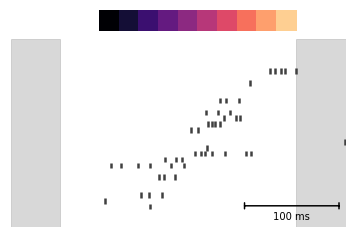

In [19]:
def plot_lin_raster(data, animal, day, bst, axr=None, axb=None, ordering='E1a'):
    E1a, E1b, E2 = 1, 3, 5
    
    evt_extent = bst.support
    plot_extent = evt_extent.expand(0.05)
    
    if ordering == 'E1a':
        tc = data[animal][day]['tuning_curves1D_center'][E1a]
        stpcs = data[animal][day]['remote_replay_E1_in_E2']['st_placecells_remote'][plot_extent]
    elif ordering == 'E1b':
        tc = data[animal][day]['tuning_curves1D_center'][E1b]
        stpcs = data[animal][day]['remote_replay_E1_in_E2']['st_placecells_remote'][plot_extent]
    elif ordering == 'E2':
        tc = data[animal][day]['tuning_curves1D_center'][E2]
        stpcs = data[animal][day]['remote_replay_E1_in_E2']['st_placecells_local'][plot_extent]
    else:
        raise ValueError('unknown ordering')
        
#     stall = data[animal][day]['spikes'][plot_extent]
    
    from mpl_toolkits.axes_grid1 import make_axes_locatable
    from matplotlib.colors import ListedColormap
    
    peak_order = tc._unit_subset(stpcs.unit_ids).get_peak_firing_order_ids()
#     placecell_ids = stpcs.unit_ids
#     othercell_ids = list(set(stall.unit_ids) - set(placecell_ids))
#     othercell_ids.sort()
#     fullorder = othercell_ids
#     fullorder.extend(peak_order)

    if axr is None:
        axr = plt.gca()
        
    npl.rasterplot(stpcs.reorder_units_by_ids(peak_order), vertstack=True, lw=2.5, ax=axr)
    npl.epochplot(plot_extent-evt_extent, hatch='', color='0.7', ax=axr)
    axr.set_xlim(*stpcs.support.time)
    npl.add_scalebar(ax=axr, sizex=0.1, labelx='100 ms', hidey=False, hidex=False)
    npl.utils.clear_left_right()
    npl.utils.clear_top_bottom()
    
    posterior, lengths, mode_pth, mean_pth = nel.decoding.decode1D(bst=bst, ratemap=tc.smooth(sigma=4))
    
    if axb is None:
        divider = make_axes_locatable(axr)
        axb = divider.append_axes("top", size=0.3, pad=0.1)

    bins = np.atleast_2d(posterior.sum(axis=0))
    non_empty_idx = np.argwhere(~np.isnan(bins))[:,1]
    n_non_empty = len(non_empty_idx)
    bins[:,non_empty_idx] = np.arange(n_non_empty)

    NUM_COLORS = n_non_empty
    cm = plt.get_cmap('magma')
    # cm = plt.get_cmap('jet')
    clist = [cm(1.*i/NUM_COLORS) for i in range(NUM_COLORS)]
    npl.set_palette(clist)
    nan_jet = ListedColormap(clist, name='nan_jet')

    axb.pcolor(bst.bins, [0,1,], bins, cmap=nan_jet)
    axb.set_xlim(axr.get_xlim())
    
    npl.utils.clear_left_right(axr)
    npl.utils.clear_top_bottom(axr)
    npl.utils.clear_left_right(axb)
    npl.utils.clear_top_bottom(axb)
    
    return
   
def plot_lin_decoded(data, animal, day, bst, ax=None, ordering='E1a'):
    E1a, E1b, E2 = 1, 3, 5
    from matplotlib.colors import ListedColormap
    
    if ax is None:
        ax = plt.gca()
        
        
    if ordering == 'E1a':
        tc = data[animal][day]['tuning_curves1D_center'][E1a]
    elif ordering == 'E1b':
        tc = data[animal][day]['tuning_curves1D_center'][E1b]
    elif ordering == 'E2':
        tc = data[animal][day]['tuning_curves1D_center'][E2]
    else:
        raise ValueError('unknown ordering')
        
    posterior, lengths, mode_pth, mean_pth = nel.decoding.decode1D(bst=bst, ratemap=tc.smooth(sigma=4))
    
    bins = np.atleast_2d(posterior.sum(axis=0))
    non_empty_idx = np.argwhere(~np.isnan(bins))[:,1]
    n_non_empty = len(non_empty_idx)
    bins[:,non_empty_idx] = np.arange(n_non_empty)

    NUM_COLORS = n_non_empty
    cm = plt.get_cmap('magma')
    # cm = plt.get_cmap('jet')
    clist = [cm(1.*i/NUM_COLORS) for i in range(NUM_COLORS)]
    npl.set_palette(clist)
    
    for post in posterior.T:
        if not any(np.isnan(post)):
            ax.plot(tc.bin_centers, post, lw=2);
            
    npl.utils.clear_right(ax)
    npl.utils.clear_top_bottom(ax)
    
    return

plot_lin_raster(data=data,
             animal=animal,
             day=day,
             bst=bst[0]
            )

# plot_lin_decoded(data=data,
#              animal=animal,
#              day=day,
#              bst=bst[0]
#             )

In [20]:
def plot_remote_score_distribution(data, animal, day, evt_idx, ax=None, threshold=95):
    if ax is None:
        ax = plt.gca()
    
    scores = data[animal][day]['elife']['scores_tmat']
    tmat = data[animal][day]['elife']['shuffled_scores_tmat']
    percentile = data[animal][day]['elife']['percentiles_tmat'][evt_idx]

    if percentile > threshold:
        color = 'blue'
    else:
        color = 'red'
        
    sns.distplot(tmat[evt_idx], hist=False, ax=ax, kde_kws={"shade": True}, color=color)
    ax.vlines(scores[evt_idx], 0,1)
    npl.utils.clear_left_right(ax)
    npl.utils.clear_top_bottom(ax)
    
def plot_local_bayesian_score_distribution(data, animal, day, evt_idx, ax=None, threshold=95):
    if ax is None:
        ax = plt.gca()
        
    candidate_ids = data[animal][day]['elife']['local_candidate_ids']
        
    global_to_candidate_map = {}
    for ii, cand_id in enumerate(candidate_ids):
        global_to_candidate_map[cand_id] = ii
        
    if evt_idx not in global_to_candidate_map:
        raise ValueError('no data for event id {}'.format(evt_idx))
        
    scores = data[animal][day]['elife']['local_replay_scores']
    shuffled = data[animal][day]['elife']['local_replay_scores_shuffled']
    percentile = data[animal][day]['elife']['local_replay_percentiles'][global_to_candidate_map[evt_idx]]
    
    if percentile > threshold:
        color = 'blue'
    else:
        color = 'red'

    sns.distplot(shuffled[global_to_candidate_map[evt_idx]], hist=False, ax=ax, kde_kws={"shade": True}, color=color)
    ax.vlines(scores[global_to_candidate_map[evt_idx]], 0, 100)
    npl.utils.clear_left_right(ax)
    npl.utils.clear_top_bottom(ax)
    
def plot_state_sequence(data, animal, day, bst, evt_idx, hmm, ax=None, cmap=plt.cm.gray_r):
    if ax is None:
        ax = plt.gca()
    
    posterior = hmm.predict_proba(bst[evt_idx])
            
    npl.imagesc(posterior, cmap=cmap, ax=ax)
    npl.utils.clear_left_right(ax)
    npl.utils.clear_top_bottom(ax)

# Score events using HMM

Specifically, we want to build a model of ALL candidate (>4 cells active, >4 time bins) events. We then do scoring of those events, using cross-validation. But we also want to score the non-candidate events, which we score without cross-validation, using the HMM trained on all candidate events.

In [21]:
bst_all_ripples

<BinnedSpikeTrainArray at 0x7f8a9c56be80: 74 units (162 segments) in 833 bins of width 20.0 milliseconds> for a total of 16.66 seconds

In [22]:
len(candidate_ids) + len(remaining_ids)

162

In [23]:
n_shuffles = 5000
k_folds = 5
verbose = 1

scores_tmat = np.zeros((bst_all_ripples.n_epochs,))
scores_tswap = np.zeros((bst_all_ripples.n_epochs))
percentiles_tmat = np.zeros((bst_all_ripples.n_epochs))
percentiles_tswap = np.zeros((bst_all_ripples.n_epochs))
shuffled_scores_tmat = np.zeros((bst_all_ripples.n_epochs,n_shuffles))
shuffled_scores_tswap = np.zeros((bst_all_ripples.n_epochs,n_shuffles))

In [24]:
# score candidate events with cross validation
if not load_scores:
    # score using transmat shuffle
    scores, shuffled_scores, percentiles = nel.analysis.replay.score_hmm_events(bst=bst_all_ripples[candidate_ids], 
                                                                                num_states=num_states,
                                                                                n_shuffles=n_shuffles,
                                                                                k_folds=k_folds,
                                                                                shuffle='row-wise',
                                                                                verbose=verbose)
    scores_tmat[candidate_ids] = scores
    shuffled_scores_tmat[candidate_ids] = shuffled_scores
    percentiles_tmat[candidate_ids] = percentiles

    # score using time swap shuffle
    scores, shuffled_scores, percentiles = nel.analysis.replay.score_hmm_events(bst=bst_all_ripples[candidate_ids], 
                                                                                num_states=num_states,
                                                                                n_shuffles=n_shuffles,
                                                                                k_folds=k_folds,
                                                                                shuffle='timeswap',
                                                                                verbose=verbose)
    scores_tswap[candidate_ids] = scores
    shuffled_scores_tswap[candidate_ids] = shuffled_scores
    percentiles_tswap[candidate_ids] = percentiles

In [25]:
# score remaining events without cross validation
if not load_scores:
    # score using transmat shuffle
    scores, shuffled_scores, percentiles = nel.analysis.replay.score_hmm_events_no_xval(bst=bst_all_ripples,
                                                                                        training=candidate_ids,
                                                                                        validation=remaining_ids,
                                                                                        num_states=num_states,
                                                                                        n_shuffles=n_shuffles,
                                                                                        shuffle='row-wise',
                                                                                        verbose=verbose)
    scores_tmat[remaining_ids] = scores
    shuffled_scores_tmat[remaining_ids] = shuffled_scores
    percentiles_tmat[remaining_ids] = percentiles

    # score using time swap shuffle
    scores, shuffled_scores, percentiles = nel.analysis.replay.score_hmm_events_no_xval(bst=bst_all_ripples,
                                                                                        training=candidate_ids,
                                                                                        validation=remaining_ids,
                                                                                        num_states=num_states,
                                                                                        n_shuffles=n_shuffles,
                                                                                        shuffle='timeswap',
                                                                                        verbose=verbose)
    scores_tswap[remaining_ids] = scores
    shuffled_scores_tswap[remaining_ids] = shuffled_scores
    percentiles_tswap[remaining_ids] = percentiles

In [26]:
if not load_scores:
    data[animal][day]['elife']['scores_tmat'] = scores_tmat
    data[animal][day]['elife']['scores_tswap'] = scores_tswap
    data[animal][day]['elife']['shuffled_scores_tswap'] = shuffled_scores_tswap
    data[animal][day]['elife']['shuffled_scores_tmat'] = shuffled_scores_tmat
    data[animal][day]['elife']['percentiles_tswap'] = percentiles_tswap
    data[animal][day]['elife']['percentiles_tmat'] = percentiles_tmat
    
#     jar = nel.ResultsContainer(data=data)
#     jar.save_pkl('elife-scores-BonDay3.nel', overwrite=True)

In [26]:
parallelize_by_event = False

n_jobs = 8
n_shuffles = 5000

tc = data[animal][day]['tuning_curves1D_center'][5] # E2 linearized center-outer ordering
w = 3
n_samples = 35000

if parallelize_by_event:
    from joblib import Parallel, delayed 

    # A function that can be called to do work:
    def work_events(arg):    

        # Split the list to individual variables:
        ii, bst, tc = arg
        scores, shuffled_scores, percentiles = nel.analysis.replay.score_Davidson_final_bst_fast(bst=bst,
                                                                                            tuningcurve=tc,
                                                                                            w=w,
                                                                                            n_shuffles=n_shuffles,
                                                                                            n_samples=n_samples)

        return (ii, scores, shuffled_scores, percentiles)

    # List of instances to pass to work():
    # unroll all events:
    parallel_events = []
    for nn in range(bst.n_epochs):
        parallel_events.append((nn, bst[nn], data[animal][day]['tuning_curves1D_center'][5]))

    # Anything returned by work() can be stored:
    parallel_results = Parallel(n_jobs=n_jobs, verbose=51)(map(delayed(work_events), parallel_events))

    # TODO: wrangle results, and remember to take transpose of shuffles!


# Determine how many Bayesian significant events, and how many HMM congruent events we have

Starting from the 41 candidate events, of course... Also, the whole "no single crrect threshold" issue is still an ... issue.

In [27]:
def score_events_r2(bst, tc, n_shuffles=100, sigma=3):
    """Score, and optionally smooth tuning curves when decoding"""
    n_events = bst.n_epochs
    pvals = np.empty(n_events)
    pvals[:] = np.nan
    
    for evt_idx in range(n_events):
        evt = bst[evt_idx]
        _, _, mode_pth, _ = nel.decoding.decode1D(bst=evt, ratemap=tc.smooth(sigma=sigma))

        mask = ~np.isnan(mode_pth)
        xvals = evt.bin_centers[mask]
        yvals = mode_pth[mask]

        slope, intercept, r_value, p_value, std_err = stats.linregress(xvals, yvals)
        actual_r2 = r_value**2

        r2_values = []
        for nn in range(n_shuffles):
            slope, intercept, r_value, p_value, std_err = stats.linregress(xvals, np.random.permutation(yvals))
            r2_values.append(r_value**2)

        pvals[evt_idx] = (100 - stats.percentileofscore(r2_values, actual_r2))/100
        
    return pvals

E1a, E1b, E2 = 1, 3, 5

n_shuffles = 10000
sigma_tc = 3 # cm smoothing

############ local candidates ############
print('scoring local replay candidates...')
bst = bst_all_ripples[candidate_ids]

# compute pvals of remote candidates using center-ordering from E1a
tc = data[animal][day]['tuning_curves1D_center'][E2]
pvals_E2_co = score_events_r2(bst=bst, tc=tc, n_shuffles=n_shuffles, sigma=sigma_tc)
# compute pvals of remote candidates using outer-ordering from E1a
tc = data[animal][day]['tuning_curves1D_outer'][E2]
pvals_E2_oo = score_events_r2(bst=bst, tc=tc, n_shuffles=n_shuffles, sigma=sigma_tc)

pvals = np.vstack((pvals_E2_co, pvals_E2_oo)).min(axis=0)
r2percentiles = (1 - pvals) * 100

scoring local replay candidates...


In [28]:
# threshold = 
r2_threshold = 95
bayes_threshold = 95
tswap_threshold = 95
tmat_threshold = 95

r2_sig = np.array(candidate_ids)[np.argwhere(r2percentiles > r2_threshold).squeeze()]
print('{:} out of {:} events ({:2.1f}%) are R2 significant.'.format(len(r2_sig), len(candidate_ids), len(r2_sig) / len(candidate_ids)*100))

bayes_sig = np.array(candidate_ids)[np.argwhere(data[animal][day]['elife']['local_replay_percentiles'] > bayes_threshold).squeeze()]
print('{:} out of {:} events ({:2.1f}%) are Bayesian significant.'.format(len(bayes_sig), len(candidate_ids), len(bayes_sig) / len(candidate_ids)*100))

tswap_sig = np.array(candidate_ids)[np.argwhere(data[animal][day]['elife']['percentiles_tswap'][candidate_ids] > tswap_threshold).squeeze()]
print('{:} out of {:} events ({:2.1f}%) are tswap significant.'.format(len(tswap_sig), len(candidate_ids), len(tswap_sig) / len(candidate_ids)*100))

tmat_sig = np.array(candidate_ids)[np.argwhere(data[animal][day]['elife']['percentiles_tmat'][candidate_ids] > tmat_threshold).squeeze()]
print('{:} out of {:} events ({:2.1f}%) are tmat significant.'.format(len(tmat_sig), len(candidate_ids), len(tmat_sig) / len(candidate_ids)*100))


11 out of 41 events (26.8%) are R2 significant.
12 out of 41 events (29.3%) are Bayesian significant.
16 out of 41 events (39.0%) are tswap significant.
16 out of 41 events (39.0%) are tmat significant.


In [30]:
print(r2_sig)

[  0   2  12  46  49  69  90 106 119 126 143 161]


In [31]:
print(bayes_sig)

[  9  15  49  63  65  69  72  83  99 125 153 161]


In [32]:
print(tswap_sig)

[  0  12  17  25  35  43  64  65  69  72  92  99 119 144 150 159]


In [33]:
print(tmat_sig)

[  0  12  17  25  31  32  35  62  64  69  72  87 119 144 153 159]


In [34]:
# etienne's subjective Bon Day3 candidate scores, not for official use!
subj_scores_remote = {}
subj_scores_local = {}
subj_scores_remote[0], subj_scores_local[0] = 5, 0
subj_scores_remote[2], subj_scores_local[2] = 4, 1
subj_scores_remote[9], subj_scores_local[9] = 2, 0
subj_scores_remote[12], subj_scores_local[12] = 4, 2
subj_scores_remote[15], subj_scores_local[15] = 2, 3
subj_scores_remote[17], subj_scores_local[17] = 5, 2
subj_scores_remote[25], subj_scores_local[25] = 5, 1
subj_scores_remote[31], subj_scores_local[31] = 5, 2
subj_scores_remote[32], subj_scores_local[32] = 0, 0
subj_scores_remote[35], subj_scores_local[35] = 3, 2
subj_scores_remote[43], subj_scores_local[43] = 3, 1
subj_scores_remote[46], subj_scores_local[46] = 3, 4
subj_scores_remote[49], subj_scores_local[49] = 3, 3
subj_scores_remote[57], subj_scores_local[57] = 2, 2
subj_scores_remote[62], subj_scores_local[62] = 5, 0
subj_scores_remote[63], subj_scores_local[63] = 0, 0
subj_scores_remote[64], subj_scores_local[64] = 2, 0
subj_scores_remote[65], subj_scores_local[65] = 2, 2
subj_scores_remote[69], subj_scores_local[69] = 5, 0
subj_scores_remote[72], subj_scores_local[72] = 0, 0
subj_scores_remote[76], subj_scores_local[76] = 3, 0
subj_scores_remote[83], subj_scores_local[83] = 0, 0
subj_scores_remote[87], subj_scores_local[87] = 2, 0
subj_scores_remote[90], subj_scores_local[90] = 2, 0
subj_scores_remote[92], subj_scores_local[92] = 2, 1
subj_scores_remote[94], subj_scores_local[94] = 5, 2
subj_scores_remote[98], subj_scores_local[98] = 0, 0
subj_scores_remote[99], subj_scores_local[99] = 5, 1
subj_scores_remote[106], subj_scores_local[106] = 1, 3
subj_scores_remote[119], subj_scores_local[119] = 4, 2
subj_scores_remote[125], subj_scores_local[125] = 2, 1
subj_scores_remote[126], subj_scores_local[126] = 1, 5
subj_scores_remote[132], subj_scores_local[132] = 3, 1
subj_scores_remote[143], subj_scores_local[143] = 1, 4
subj_scores_remote[144], subj_scores_local[144] = 2, 0
subj_scores_remote[147], subj_scores_local[147] = 4, 0
subj_scores_remote[150], subj_scores_local[150] = 4, 4
subj_scores_remote[153], subj_scores_local[153] = 3, 1
subj_scores_remote[154], subj_scores_local[154] = 2, 2
subj_scores_remote[159], subj_scores_local[159] = 5, 2
subj_scores_remote[161], subj_scores_local[161] = 4, 3


In [35]:
scores_remote = []
scores_local = []
for ii, idx in enumerate(tmat_sig):
    scores_remote.append(subj_scores_remote[idx])
    scores_local.append(subj_scores_local[idx])
scores_remote = np.array(scores_remote)
scores_local = np.array(scores_local)
print(scores_remote.mean())
print(scores_local.mean())
print(np.count_nonzero(scores_remote==5))

3.4375
0.875
7


# Generate figures

In [36]:
import matplotlib.pyplot as plt

import figurefirst as fifi
from IPython.display import display,SVG

%matplotlib inline


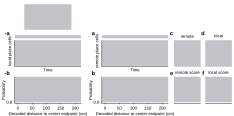

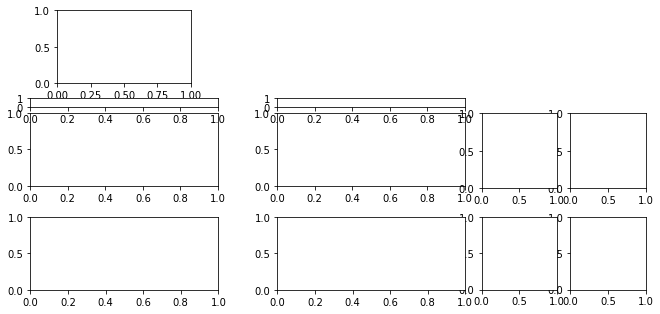

In [37]:
layout = fifi.FigureLayout('remotefig.svg')
display(SVG(layout.layout_filename))
fig = layout.make_mplfigures();

In [38]:
# idx = 126
# data[animal][day]['elife']['percentiles_tmat'][idx]
# data[animal][day]['elife']['scores_tmat'][idx]
# sns.distplot(data[animal][day]['elife']['shuffled_scores_tmat'][idx])
# plt.vlines(data[animal][day]['elife']['scores_tmat'][idx], 0, 1)
# print(data[animal][day]['elife']['percentiles_tmat'][idx])

In [39]:
# idx = global_to_candidate_map[126]
# data[animal][day]['elife']['local_replay_percentiles'][idx]
# data[animal][day]['elife']['local_replay_scores'][idx]
# sns.distplot(data[animal][day]['elife']['local_replay_scores_shuffled'][idx])
# plt.vlines(data[animal][day]['elife']['local_replay_scores'][idx], 0, 15)
# print(data[animal][day]['elife']['local_replay_percentiles'][idx])

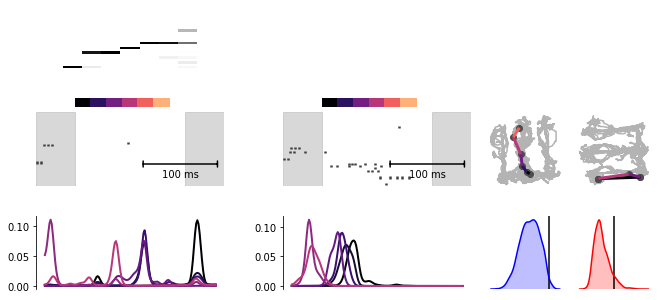

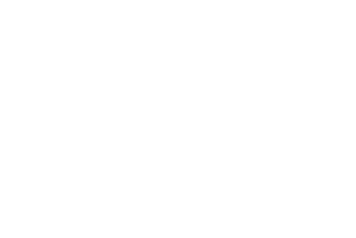

In [40]:
bst = bst_all_ripples

for mplax in layout.axes.values():
    ax = mplax['axis']
    ax.clear()
    
# fifi.mpl_functions.kill_all_labels(layout)

evt_idx, context, ordering = 31, 'E1b_raw', 'E1b'
# evt_idx, context = 5, 'E1a_ideal'
# evt_idx, context = 40, 'E1b_ideal'

plot_w_event(data=data,
             animal=animal,
             day=day,
             bst=bst[evt_idx],
             context=context,
             ax=layout.axes['ax2']['axis']
            )

plot_w_event(data=data,
             animal=animal,
             day=day,
             bst=bst[evt_idx],
             context='E2_raw',
             ax=layout.axes['ax3']['axis']
            )

plot_lin_raster(data=data,
             animal=animal,
             day=day,
             bst=bst[evt_idx],
             axr=layout.axes['ax0']['axis'],
             axb=layout.axes['ax0b']['axis'],
             ordering=ordering
            )

plot_lin_decoded(data=data,
             animal=animal,
             day=day,
             bst=bst[evt_idx],
             ax=layout.axes['ax1']['axis'],
             ordering=ordering
            )

plot_lin_raster(data=data,
             animal=animal,
             day=day,
             bst=bst[evt_idx],
             axr=layout.axes['ax6']['axis'],
             axb=layout.axes['ax6b']['axis'],
             ordering='E2'
            )

plot_lin_decoded(data=data,
             animal=animal,
             day=day,
             bst=bst[evt_idx],
             ax=layout.axes['ax7']['axis'],
             ordering='E2'
            )

# raise NotImplementedError('new score distributions not available yet')
plot_remote_score_distribution(data=data,
             animal=animal,
             day=day,
             evt_idx=evt_idx,
             ax=layout.axes['ax4']['axis']
            )

plot_local_bayesian_score_distribution(data=data,
             animal=animal,
             day=day,
             evt_idx=evt_idx,
             ax=layout.axes['ax5']['axis']
            )

plot_state_sequence(data=data,
                    animal=animal,
                    day=day,
                    bst=bst_all_ripples,
                    evt_idx=evt_idx,
                    hmm=hmm,
                    ax=layout.axes['ax8']['axis']
                   )

fig

In [705]:
fig.savefig('31.png', dpi=300)

In [41]:
# fig.savefig('31.png', dpi=300)
layout.set_layer_visibility('axes', False)
layout.set_layer_visibility('labels', True)
layout.save('ff_remote_out.svg')
plt.close('all')
# display(SVG('ff_remote_out.svg'))

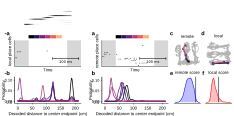

In [42]:
display(SVG('ff_remote_out.svg'))

In [43]:
def draw_entire_canvas(bst, ffsource='remotefig.svg', evt_idx=0, context = 'E1b_ideal', ordering='E1b'):
    
    layout = fifi.FigureLayout(ffsource)
    # display(SVG(layout.layout_filename))
    fig = layout.make_mplfigures();
 
    for mplax in layout.axes.values():
        ax = mplax['axis']
        ax.clear()

    # fifi.mpl_functions.kill_all_labels(layout)

    # evt_idx, context, ordering = 15, 'E1b_ideal', 'E1b'
    # evt_idx, context = 5, 'E1a_ideal'
    # evt_idx, context = 40, 'E1b_ideal'

    plot_w_event(data=data,
                 animal=animal,
                 day=day,
                 bst=bst[evt_idx],
                 context=context,
                 ax=layout.axes['ax2']['axis']
                )

    plot_w_event(data=data,
                 animal=animal,
                 day=day,
                 bst=bst[evt_idx],
                 context='E2_raw',
                 ax=layout.axes['ax3']['axis']
                )

    plot_lin_raster(data=data,
                 animal=animal,
                 day=day,
                 bst=bst[evt_idx],
                 axr=layout.axes['ax0']['axis'],
                 axb=layout.axes['ax0b']['axis'],
                 ordering=ordering
                )

    plot_lin_decoded(data=data,
                 animal=animal,
                 day=day,
                 bst=bst[evt_idx],
                 ax=layout.axes['ax1']['axis'],
                 ordering=ordering
                )

    plot_lin_raster(data=data,
                 animal=animal,
                 day=day,
                 bst=bst[evt_idx],
                 axr=layout.axes['ax6']['axis'],
                 axb=layout.axes['ax6b']['axis'],
                 ordering='E2'
                )

    plot_lin_decoded(data=data,
                 animal=animal,
                 day=day,
                 bst=bst[evt_idx],
                 ax=layout.axes['ax7']['axis'],
                 ordering='E2'
                )

    plot_remote_score_distribution(data=data,
                 animal=animal,
                 day=day,
                 evt_idx=evt_idx,
                 ax=layout.axes['ax4']['axis']
                )

    plot_local_bayesian_score_distribution(data=data,
                 animal=animal,
                 day=day,
                 evt_idx=evt_idx,
                 ax=layout.axes['ax5']['axis']
                )
    
    fig.suptitle(evt_idx, y=1.02)
    
    return layout, fig

# Now generate actual figures

In [44]:
print(bayes_sig)

[  9  15  49  63  65  69  72  83  99 125 153 161]


In [45]:
print(tmat_sig)

[  0  12  17  25  31  32  35  62  64  69  72  87 119 144 153 159]


In [46]:
print(set(bayes_sig).intersection(tmat_sig))

{72, 153, 69}


In [47]:
kwargs = {}
kwargs['bst'] = bst_all_ripples
kwargs['ffsource'] = 'remotefig.svg'

bayes9 = {'evt_idx':9, 'context':'E1b_raw', 'ordering':'E1b'}
bayes15 = {'evt_idx':15, 'context':'E1b_raw', 'ordering':'E1b'}
bayes49 = {'evt_idx':49, 'context':'E1b_raw', 'ordering':'E1b'}
bayes63 = {'evt_idx':63, 'context':'E1b_raw', 'ordering':'E1b'}
bayes65 = {'evt_idx':65, 'context':'E1b_raw', 'ordering':'E1b'}
bayes69 = {'evt_idx':69, 'context':'E1b_raw', 'ordering':'E1b'}
bayes72 = {'evt_idx':72, 'context':'E1b_raw', 'ordering':'E1b'}
bayes83 = {'evt_idx':83, 'context':'E1b_raw', 'ordering':'E1b'}
bayes99 = {'evt_idx':99, 'context':'E1b_raw', 'ordering':'E1b'}
bayes125 = {'evt_idx':125, 'context':'E1b_raw', 'ordering':'E1b'}
bayes153 = {'evt_idx':153, 'context':'E1b_raw', 'ordering':'E1b'}
bayes161 = {'evt_idx':161, 'context':'E1b_raw', 'ordering':'E1b'}

all_bayes_sig = [bayes9, bayes15, bayes49, bayes63, bayes65, bayes69, bayes72, bayes83, bayes99, bayes125, bayes153, bayes161]

tmat0 = {'evt_idx':0, 'context':'E1b_ideal', 'ordering':'E1b'}
tmat12 = {'evt_idx':12, 'context':'E1b_raw', 'ordering':'E1b'}
tmat17 = {'evt_idx':17, 'context':'E1b_raw', 'ordering':'E1b'}
tmat25 = {'evt_idx':25, 'context':'E1b_raw', 'ordering':'E1b'}
tmat31 = {'evt_idx':31, 'context':'E1b_raw', 'ordering':'E1b'}
tmat32 = {'evt_idx':32, 'context':'E1b_raw', 'ordering':'E1b'}
tmat35 = {'evt_idx':35, 'context':'E1b_raw', 'ordering':'E1b'}
tmat62 = {'evt_idx':62, 'context':'E1b_raw', 'ordering':'E1b'}
tmat64 = {'evt_idx':64, 'context':'E1b_raw', 'ordering':'E1b'}
tmat69 = {'evt_idx':69, 'context':'E1b_raw', 'ordering':'E1b'}
tmat72 = {'evt_idx':72, 'context':'E1b_raw', 'ordering':'E1b'}
tmat87 = {'evt_idx':87, 'context':'E1b_raw', 'ordering':'E1b'}
tmat119 = {'evt_idx':119, 'context':'E1b_raw', 'ordering':'E1b'}
tmat144 = {'evt_idx':144, 'context':'E1b_raw', 'ordering':'E1b'}
tmat153 = {'evt_idx':153, 'context':'E1b_raw', 'ordering':'E1b'}
tmat159 = {'evt_idx':159, 'context':'E1b_raw', 'ordering':'E1b'}

all_tmat_sig = [tmat0,tmat12,tmat17,tmat25,tmat31,tmat32,tmat35,tmat62,tmat64,tmat69,tmat72,tmat87,tmat119 ,tmat144 ,tmat153 ,tmat159]

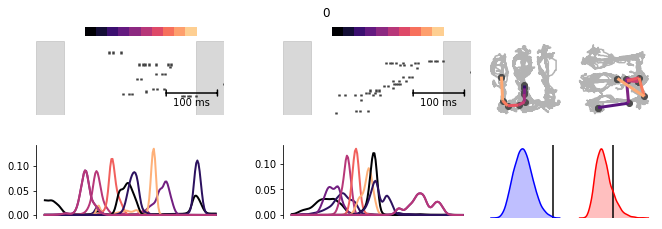

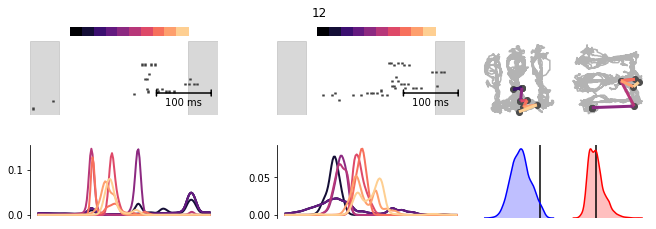

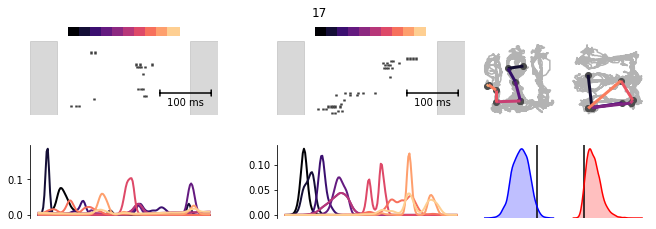

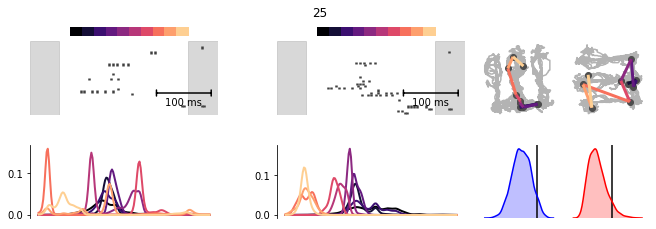

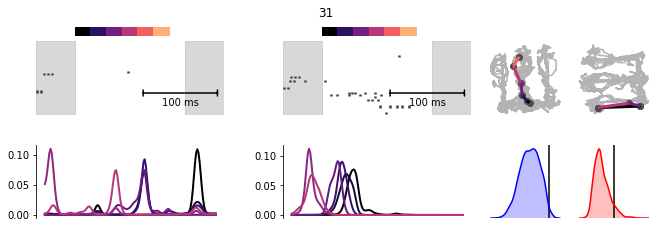

...

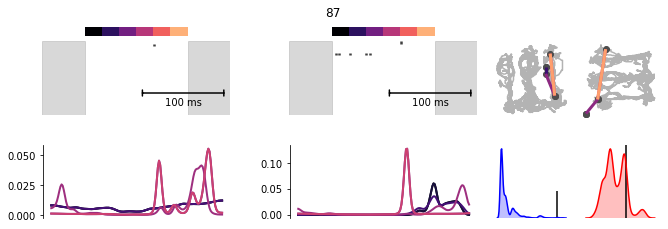

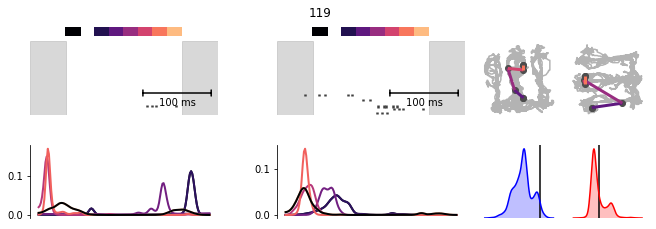

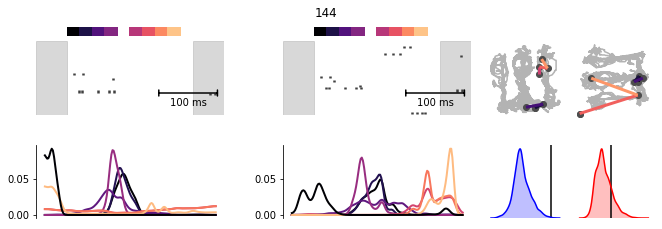

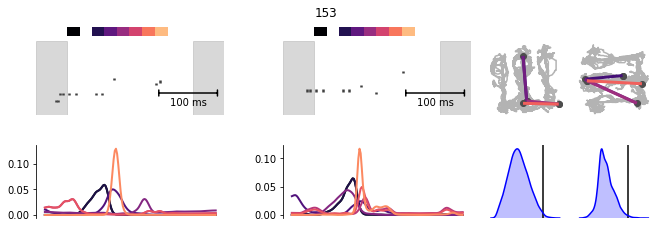

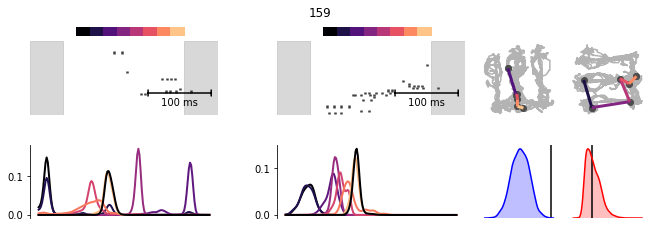

In [345]:
for tmat in all_tmat_sig:
    layout, fig = draw_entire_canvas(**kwargs, **tmat)
    plt.show()

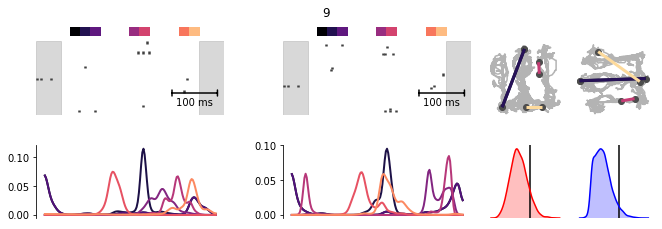

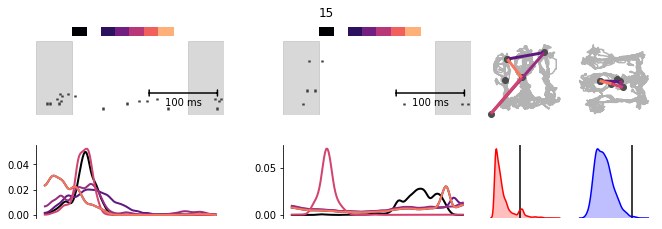

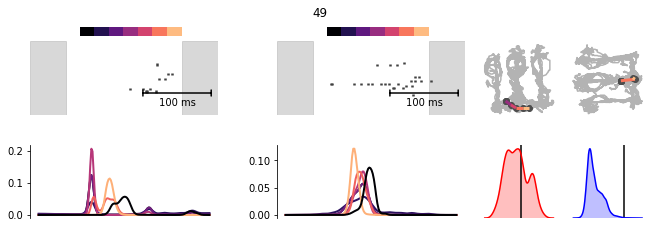

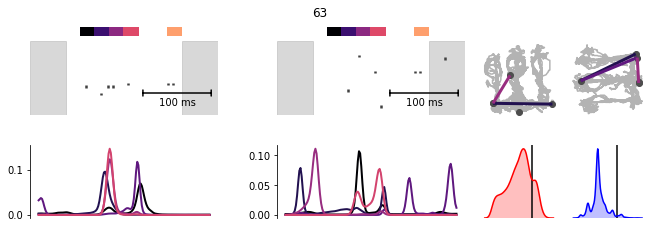

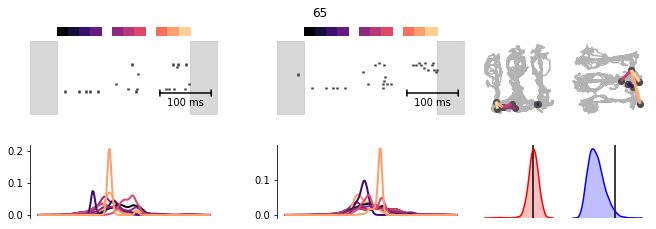

...

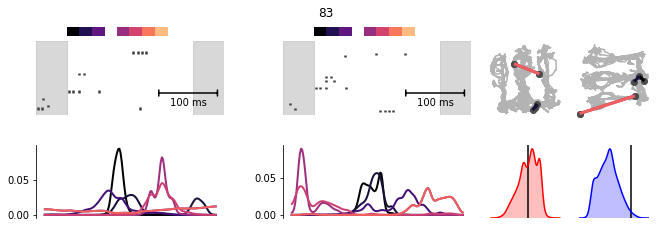

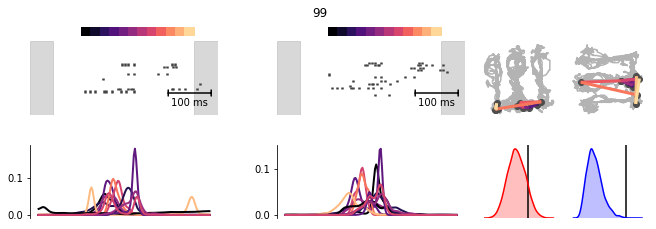

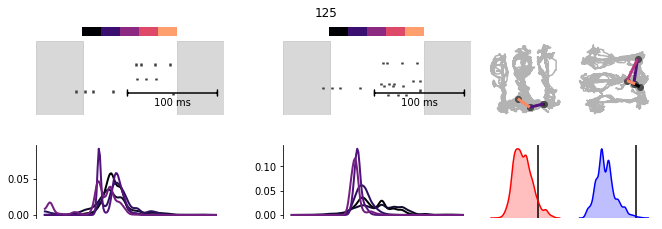

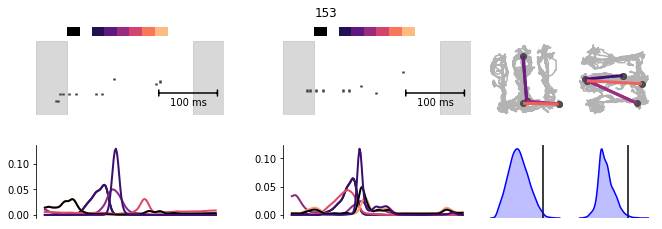

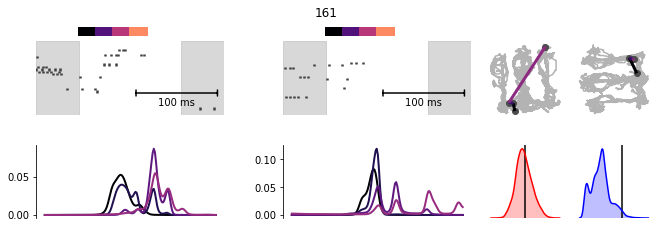

In [346]:
for bayes in all_bayes_sig:
    layout, fig = draw_entire_canvas(**kwargs, **bayes)
    plt.show()

# Decode to state space

In [ ]:
evt 17; states ordered by evt 31

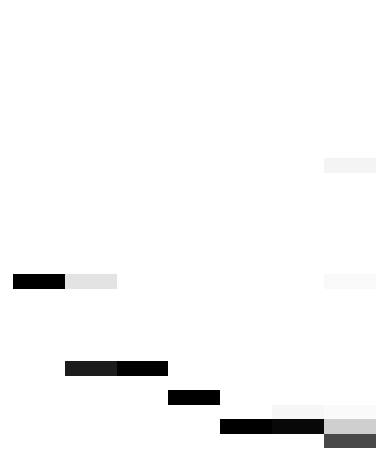

In [623]:
hmm2 = reorder_hmm_by_evt(hmm, bst_all_ripples[17])

npl.imagesc(hmm2.predict_proba(bst_all_ripples[31]), cmap=plt.cm.gray_r)
npl.utils.clear_top_bottom()
npl.utils.clear_left_right()
fig = plt.gcf()
# fig.savefig('newnew31.png', dpi=300)

# How many, and which cells are active during SWRs?

- How many E1-only place cells?
- How many E2-only place cells?
- How many E1E2 place cells?
- How many non-place cells?

In [31]:
E1_placecells = data[animal][day]['remote_replay_E1_in_E2']['st_placecells_remote'].unit_ids
E2_placecells = data[animal][day]['remote_replay_E1_in_E2']['st_placecells_local'].unit_ids
E1_only_placecells = list(set(E1_placecells) - set(E2_placecells))
E2_only_placecells = list(set(E2_placecells) - set(E1_placecells))
E1E2_placecells = list(set(E1_placecells).intersection(E2_placecells))

In [32]:
import copy

E1_placecells = data[animal][day]['remote_replay_E1_in_E2']['st_placecells_remote'].unit_ids
E2_placecells = data[animal][day]['remote_replay_E1_in_E2']['st_placecells_local'].unit_ids
E1_only_placecells = list(set(E1_placecells) - set(E2_placecells))
E2_only_placecells = list(set(E2_placecells) - set(E1_placecells))
E1E2_placecells = list(set(E1_placecells).intersection(E2_placecells))
nonplacecells = list(set(data[animal][day]['spikes'].unit_ids) - set(E1_placecells) - set(E2_placecells))

active_matrix = np.zeros((4,len(candidate_ids)))

for ii, idx in enumerate(candidate_ids):
    bst = bst_all_ripples[int(idx)]

    E1_active = bst._unit_subset(E1_only_placecells).n_active
    E2_active = bst._unit_subset(E2_only_placecells).n_active
    E1E2_active = bst._unit_subset(E1E2_placecells).n_active
    npc_active = bst._unit_subset(nonplacecells).n_active
    
#     print('number of E1-only placecells active: {}'.format(E1_active))
#     print('number of E2-only placecells active: {}'.format(E2_active))
#     print('number of E1-and-E2 placecells active: {}'.format(E1E2_active))
#     print('number of non-placecells active: {}'.format(npc_active))

    active_matrix[:,ii] = np.array([E1_active, E2_active, E1E2_active, npc_active])

In [33]:
candidate_to_global_map = {}
global_to_candidate_map = {}

for ii, idx in enumerate(candidate_ids):
    candidate_to_global_map[ii] = idx
    global_to_candidate_map[idx] = ii
    
candidate_tmat_sig = [global_to_candidate_map[xx] for xx in tmat_sig]
candidate_tswap_sig = [global_to_candidate_map[xx] for xx in tswap_sig]
candidate_bayes_sig = [global_to_candidate_map[xx] for xx in bayes_sig]
candidate_r2_sig = [global_to_candidate_map[xx] for xx in r2_sig]

sig_matrix = np.zeros((2, len(candidate_ids)))

for idx in candidate_tmat_sig:
    sig_matrix[0, idx] = 1
    
for idx in candidate_bayes_sig:
    sig_matrix[1, idx] = 1

[Text(0,0,'HMM'), Text(0,0,'Bayesian')]

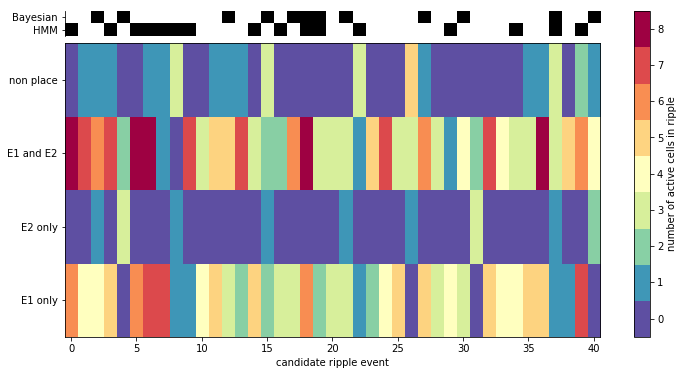

In [872]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import ListedColormap

f = plt.figure(figsize=(12,6))

n_colors = int(active_matrix.max())
npl.imagesc(active_matrix, cmap=plt.cm.get_cmap('Spectral_r', n_colors))
ax = plt.gca()
ax.set_yticks([0,1,2,3])
ax.set_yticklabels(['E1 only', 'E2 only', 'E1 and E2', 'non place'])
fig = plt.gcf()
scalarMap = plt.cm.ScalarMappable(cmap=plt.cm.get_cmap('Spectral_r', n_colors))
scalarMap.set_array(active_matrix)
cax = fig.colorbar(scalarMap)
cax.set_ticks(np.arange(n_colors)+0.5)
cax.set_ticklabels([str(ii) for ii in range(n_colors)])
cax.set_label('number of active cells in ripple')
ax.set_xlabel('candidate ripple event')

divider = make_axes_locatable(ax)
axs = divider.append_axes("top", size=0.35, pad=0.1)

npl.imagesc(sig_matrix, ax=axs, cmap=plt.cm.gray_r)
npl.utils.clear_top_bottom(axs)
# npl.utils.clear_left_right(axs)
npl.utils.clear_right(axs)
# npl.utils.clear_left(axs)
axs.set_yticks([0,1])
axs.set_yticklabels(['HMM', 'Bayesian'])
# add axis above ax, and show remote, local significant bw

# Candidate 8 does not have enough E1 or E2 place cells active (1 E1, 1 E2 place cells active), but it has 4 non-place cells active, and was found significant by the HMM. Same with 22. These correspond to global SWRs 32 and 87.



# Look at 2D lsPFs of E1 (using PBEs)

Combine E1a and E1b to learn PBE-based lsPFs.

In [38]:
def sub2ind(array_shape, rows, cols):
    return rows*array_shape[1] + cols

def append_ASAs(a, b):
    """Very dumb append; does not check for overlaps or anything... use at your own risk!"""
    c = nel.AnalogSignalArray(empty=True)
    c._ydata = np.hstack((a.ydata, b.ydata))
    c._fs = a.fs
    c._time = np.hstack((a.time, b.time))
    c._support = a.support + b.support
    
    return c

def get_vtc2d(hmm, bst, pos, nx=20, ny=20, normalize=True, normalize_by_occupancy=True):
    
    num_states = hmm.n_components
    xpos, ypos = pos.asarray(at=bst.centers).yvals
    
    ext_xmin, ext_xmax = np.floor(pos[:,0].min()/10)*10-1, np.ceil(pos[:,0].max()/10)*10+1
    ext_ymin, ext_ymax = np.floor(pos[:,1].min()/10)*10-1, np.ceil(pos[:,1].max()/10)*10+1
    
    xx_left = np.linspace(ext_xmin, ext_xmax, nx+1)
    xx_mid = np.linspace(ext_xmin, ext_xmax, nx+1)[:-1]; xx_mid += (xx_mid[1]-xx_mid[0])/2
    yy_left = np.linspace(ext_ymin, ext_ymax, ny+1)
    yy_mid = np.linspace(ext_ymin, ext_ymax, ny+1)[:-1]; yy_mid += (yy_mid[1]-yy_mid[0])/2

    ext_y = np.digitize(ypos, yy_left) - 1 # spatial bin numbers
    ext_x = np.digitize(xpos, xx_left) - 1

    t = np.zeros(len(xpos), dtype=np.float)

    for ii, (x, y) in enumerate(zip(ext_x, ext_y)):
        t[ii] = sub2ind((nx, ny), x, y)

    t[t==0] = np.nan
    t[t>=nx*ny] = np.nan
    
    extern = hmm.fit_ext(X=bst, ext=t, n_extern=nx*ny, normalize=normalize, normalize_by_occupancy=normalize_by_occupancy)
    # transform into ratemap shape
    tmp = np.reshape(extern, (num_states, nx, ny))
    vtc_ratemap = np.transpose(tmp, (0,2,1)) # for images, we have (y,x) <==> (r,c) coordinates

    vtc2d = nel.TuningCurve2D(ratemap=vtc_ratemap, min_duration=0, ext_xmin=ext_xmin, ext_xmax=ext_xmax, ext_ymin=ext_ymin, ext_ymax=ext_ymax)
#     vtc2d = vtc2d.smooth(sigma=sigma_tc)
    vtc2d._initialize_mask_from_extern(pos)
    
    return vtc2d    

def get_vtc1d(hmm, bst, pos, nx=50, normalize=True, normalize_by_occupancy=True):
    
    # Q. isn't occupancy just the same as extern???!!!???
    num_states = hmm.n_components
    xpos = pos.asarray(at=bst.centers).yvals
    
    x0=pos.min(); xl=pos.max(); n_extern=nx
    xx_left = np.linspace(x0,xl,n_extern+1)
    xx_mid = np.linspace(x0,xl,n_extern+1)[:-1]; xx_mid += (xx_mid[1]-xx_mid[0])/2

    ext_x = np.digitize(xpos, xx_left) - 1 # spatial bin numbers
    ext_x = ext_x.astype(float)
    ext_x[ext_x==0] = np.nan
    ext_x[ext_x>=n_extern] = np.nan

    extern = hmm.fit_ext(X=bst, ext=ext_x, n_extern=n_extern, normalize=normalize, normalize_by_occupancy=normalize_by_occupancy)

    vtc = nel.TuningCurve1D(ratemap=extern, min_duration=0, extmin=x0, extmax=xl)
    # vtc = vtc.smooth(sigma=sigma_tc)

    states_in_track_order = np.array(vtc.get_peak_firing_order_ids())-1

#     vtc.reorder_units(inplace=True)

#     hmm.reorder_states(states_in_track_order)
    
    return vtc

In [62]:
normalize=False
normalize_by_occupancy=True

sigma_spk = 0.3 # 300 ms spike smoothing
ds_25ms = 0.025
nx = 30
ny = 30
nx1d = 100


# for animal, day in sessions:
#     print(animal, day)
    
# try:
#     hmmE1 = data[animal][day]['HMM_E1']
#     hmmE2 = data[animal][day]['HMM_E2']
# except KeyError:
#     print('The (animal, day) pair does not have an HMM; skipping...')
#     continue

run_epochs = data[animal][day]['run_epochs'] # includes all run, during rest epochs as well, but only subsets are used for lsPF
ripple_epochs = data[animal][day]['ripple_epochs']

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    stE1 = data[animal][day]['spikes'][[1,3],:] # use E1 and E3 combined
    stE2 = data[animal][day]['spikes'][[5],:]   # use E2

if stE1.isempty: # this is true for Fra Day3 epoch 0
    pass
else:
    # get spiketrain during run bouts for epoch
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        st_run_no_ripples_E1 = stE1[run_epochs][~ripple_epochs]
        st_run_no_ripples_E2 = stE2[run_epochs][~ripple_epochs]

    # smooth and re-bin:
    bst_run_E1 = st_run_no_ripples_E1.bin(ds=ds_25ms).smooth(sigma=sigma_spk, inplace=True).rebin(w=ds_HMM/ds_25ms)
    bst_run_E2 = st_run_no_ripples_E2.bin(ds=ds_25ms).smooth(sigma=sigma_spk, inplace=True).rebin(w=ds_HMM/ds_25ms)

    # we use the idealized position (2D) to learn the place fields...
    pos_E1_2d = append_ASAs(data[animal][day]['pos'][1], data[animal][day]['pos'][3])
    pos_E2_2d = data[animal][day]['pos'][5]
    
    pos_E1_1d = append_ASAs(data[animal][day]['pos_linear_center_ordering'][1], data[animal][day]['pos_linear_center_ordering'][3])
    pos_E2_1d = data[animal][day]['pos_linear_center_ordering'][5]
    
    lsPF2d_E1 = get_vtc2d(hmm=hmm, bst=bst_run_E1, pos=pos_E1_2d, normalize=normalize, nx=nx, ny=ny, normalize_by_occupancy=normalize_by_occupancy)
    lsPF2d_E2 = get_vtc2d(hmm=hmm, bst=bst_run_E2, pos=pos_E2_2d, normalize=normalize, nx=nx, ny=ny, normalize_by_occupancy=normalize_by_occupancy)
    lsPF1d_E1 = get_vtc1d(hmm=hmm, bst=bst_run_E1, pos=pos_E1_1d, nx=nx1d, normalize=normalize, normalize_by_occupancy=normalize_by_occupancy)
    lsPF1d_E2 = get_vtc1d(hmm=hmm, bst=bst_run_E2, pos=pos_E2_1d, nx=nx1d, normalize=normalize, normalize_by_occupancy=normalize_by_occupancy)
    
#     data[animal][day]['VTC_E1'] = vtc2d 
#     data[animal][day]['VTC_E2'] = vtc2d

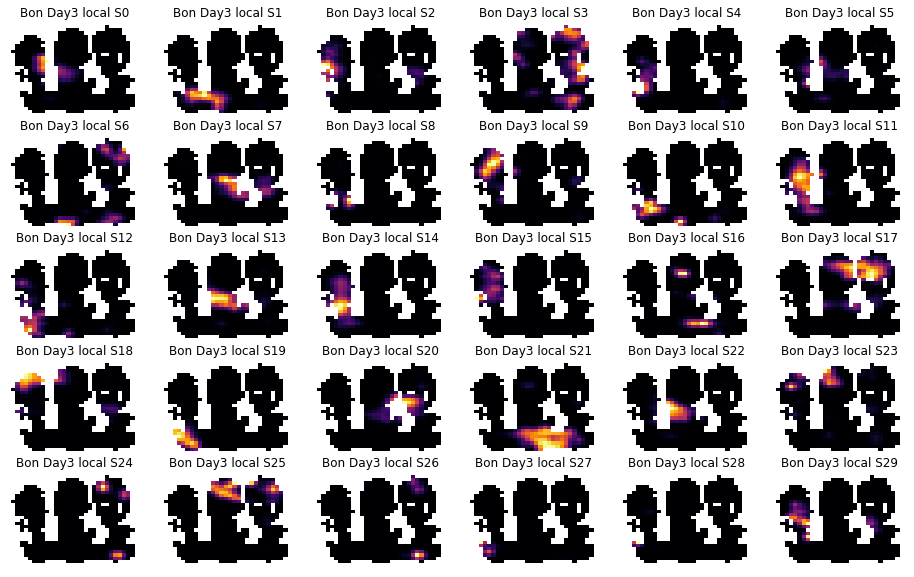

In [65]:
animal = 'Bon'
day = 'Day3'
sigma_tc=3

def plot_all_VTCs_2D(data, animal, day, vtc, sigma_tc):

    ax_rows = 5
    ax_cols = 6
    n_axes = ax_rows * ax_cols
    
    n_units = vtc.n_units
    
    assert n_axes >= n_units, 'not enough axes for all units!'
    
    fig, axes = plt.subplots(ax_rows, ax_cols, figsize=(16, 10))
    for unit, ax in enumerate(axes.ravel()[:n_units]):
        pass
        npl.utils.clear_left_right(ax)
        npl.utils.clear_top_bottom(ax)
#         maxcbrate = 0.65*np.round(np.nanmax(tuning_curves[epidx].smooth(sigma=0).ratemap[unit,:,:])*10)/10
        _, img = npl.imagesc(vtc.smooth(sigma=sigma_tc).ratemap[unit,:,:].T, cmap=plt.cm.inferno, ax=ax)
        ax.set_title(animal + ' ' + str(day) + ' local S' + str(unit))
            
    
plot_all_VTCs_2D(data=data, 
                    animal=animal,
                    day=day,
                    vtc=lsPF2d_E1,
                    sigma_tc=sigma_tc)

# npl.savefig('lspf-local-small')

# Joint decoding of E1 and E2 lsPFs

Previous idea wasn't fully baked. We can't learn joint lsPFs imo. The animal is only in one environment at a time during run. We can decode run-associated neural activity to both environments though (presumably using place fields?) as a proxy for 'true' position. Then doing a 2D proxy with linE1 x linE2 can be used to normalize by occupancy.

But how good is our decoding accuracy? And should we decode using only place cells? Perhaps?

We have the TRUE position for E1 during E1 runs, so we need to augment our dataset with estimated E2 position. Similarly, we have true E2 position during E2 runs, and need to estimate the E1 position. This new augmented 2D linearized position will then be our object to use for lsPF estimation.

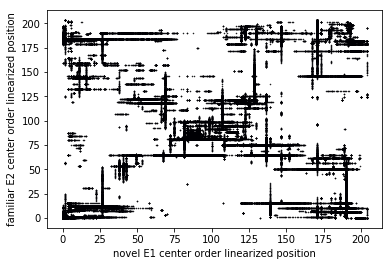

In [352]:
normalize=False
normalize_by_occupancy=True

sigma_spk = 0.3 # 300 ms spike smoothing
ds_HMM = 0.02 ### Raise ValueError('Change this!')
ds_25ms = 0.02
nx_E1 = 50
nx_E2 = 50

run_epochs = data[animal][day]['run_epochs']
ripple_epochs = data[animal][day]['ripple_epochs']

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    stE1a = data[animal][day]['spikes'][[1],:]
    stE1b = data[animal][day]['spikes'][[3],:]
    stE2 = data[animal][day]['spikes'][[5],:]

if stE1a.isempty: # this is true for Fra Day3 epoch 0
    pass
else:
    # get spiketrain during run bouts for epoch
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        st_run_no_ripples_E1a = stE1a[run_epochs][~ripple_epochs]
        st_run_no_ripples_E1b = stE1b[run_epochs][~ripple_epochs]
        st_run_no_ripples_E2 = stE2[run_epochs][~ripple_epochs]
        
        st_run_no_ripples_E1 = st_run_no_ripples_E1a + st_run_no_ripples_E1b
        st_run_no_ripples = st_run_no_ripples_E1 + st_run_no_ripples_E2
        
        # hacky fix due to bug / oversight:
        st_run_no_ripples_E1._unit_ids = st_run_no_ripples_E1a._unit_ids
        st_run_no_ripples._unit_ids = st_run_no_ripples_E1a._unit_ids

    # smooth and re-bin:
    bst_run_E1a = st_run_no_ripples_E1a.bin(ds=ds_25ms).smooth(sigma=sigma_spk, inplace=True).rebin(w=ds_HMM/ds_25ms)
    bst_run_E1b = st_run_no_ripples_E1b.bin(ds=ds_25ms).smooth(sigma=sigma_spk, inplace=True).rebin(w=ds_HMM/ds_25ms)
    bst_run_E2 = st_run_no_ripples_E2.bin(ds=ds_25ms).smooth(sigma=sigma_spk, inplace=True).rebin(w=ds_HMM/ds_25ms)
    bst_run_E1 = st_run_no_ripples_E1.bin(ds=ds_25ms).smooth(sigma=sigma_spk, inplace=True).rebin(w=ds_HMM/ds_25ms)
    bst_run_no_ripples = st_run_no_ripples.bin(ds=ds_25ms).smooth(sigma=sigma_spk, inplace=True).rebin(w=ds_HMM/ds_25ms)
    
    pos_E1_true = append_ASAs(data[animal][day]['pos_linear_center_ordering'][1], data[animal][day]['pos_linear_center_ordering'][3])
    pos_E2_true = data[animal][day]['pos_linear_center_ordering'][5]
    
    tc = data[animal][day]['tuning_curves1D_center'][1]
    bst = bst_run_E2
    # placecells = data[animal][day]['PlaceCellIDs'][1]
    # tc = tc._unit_subset(placecells)
    # bst = bst._unit_subset(placecells)
    posteriors, cum_lenghts, mode_pth, mean_pth = nel.decoding.decode1D(bst=bst, ratemap=tc)
    new_pos = nel.AnalogSignalArray(empty=True)
    new_pos._time = bst.centers
    new_pos._support = bst.support
    new_pos._ydata = np.atleast_2d(mode_pth)
    new_pos._fs = 1/bst.ds
    
    pos_E1a_decoded = new_pos
    
    tc = data[animal][day]['tuning_curves1D_center'][3]
    bst = bst_run_E2
    # placecells = data[animal][day]['PlaceCellIDs'][3]
    # tc = tc._unit_subset(placecells)
    # bst = bst._unit_subset(placecells)
    posteriors, cum_lenghts, mode_pth, mean_pth = nel.decoding.decode1D(bst=bst, ratemap=tc)
    new_pos = nel.AnalogSignalArray(empty=True)
    new_pos._time = bst.centers
    new_pos._support = bst.support
    new_pos._ydata = np.atleast_2d(mode_pth)
    new_pos._fs = 1/bst.ds
    
    pos_E1b_decoded = new_pos
    
    tc = data[animal][day]['tuning_curves1D_center'][5]
    bst = bst_run_E1
    # placecells = data[animal][day]['PlaceCellIDs'][5]
    # tc = tc._unit_subset(placecells)
    # bst = bst._unit_subset(placecells)
    posteriors, cum_lenghts, mode_pth, mean_pth = nel.decoding.decode1D(bst=bst, ratemap=tc)
    new_pos = nel.AnalogSignalArray(empty=True)
    new_pos._time = bst.centers
    new_pos._support = bst.support
    new_pos._ydata = np.atleast_2d(mode_pth)
    new_pos._fs = 1/bst.ds
    
    pos_E2_decoded = new_pos
    
    # at this point, if some 20 ms bins had no data, then the decoding has nans at those locations... we have to fix this:
    raise NotImplementedError('nans could still exist in decoded / estimated position!')
    
    posjoint = append_ASAs(pos_E2_decoded, pos_E1b_decoded) # used to get timestamps

    pos_aug_E1_vals = append_ASAs(append_ASAs(data[animal][day]['pos_linear_center_ordering'][1], data[animal][day]['pos_linear_center_ordering'][3]), pos_E1b_decoded).asarray(at=posjoint.time).yvals
    pos_aug_E2_vals = append_ASAs(pos_E2_decoded, data[animal][day]['pos_linear_center_ordering'][5]).asarray(at=posjoint.time).yvals

    posjoint._ydata = np.vstack((pos_aug_E1_vals, pos_aug_E2_vals))

    plt.plot(posjoint.ydata[0], posjoint.ydata[1], '.', markersize=1)
    plt.xlabel('novel E1 center order linearized position')
    plt.ylabel('familiar E2 center order linearized position')
    
    # now we can estimate joint lsPFs in a hacky way, by estimating a 2D lsPF, normalizing for 2D occupancy,
    # but then keeping the resulting lsPFs unwrapped as 1D curves...

#     lsPF2d_E1 = get_vtc2d(hmm=hmm, bst=bst_run_E1, pos=pos_E1_2d, normalize=normalize, nx=nx, ny=ny, normalize_by_occupancy=normalize_by_occupancy)
#     lsPF2d_E2 = get_vtc2d(hmm=hmm, bst=bst_run_E2, pos=pos_E2_2d, normalize=normalize, nx=nx, ny=ny, normalize_by_occupancy=normalize_by_occupancy)
#     lsPF1d_E1 = get_vtc1d(hmm=hmm, bst=bst_run_E1, pos=pos_E1_1d, nx=nx1d, normalize=normalize, normalize_by_occupancy=normalize_by_occupancy)
#     lsPF1d_E2 = get_vtc1d(hmm=hmm, bst=bst_run_E2, pos=pos_E2_1d, nx=nx1d, normalize=normalize, normalize_by_occupancy=normalize_by_occupancy)
    
#     data[animal][day]['VTC_E1'] = vtc2d 
#     data[animal][day]['VTC_E2'] = vtc2d

In [359]:
ext_xmin, ext_xmax = np.floor(posjoint[:,0].min()/10)*10-1, np.ceil(posjoint[:,0].max()/10)*10+1
ext_ymin, ext_ymax = np.floor(posjoint[:,1].min()/10)*10-1, np.ceil(posjoint[:,1].max()/10)*10+1

In [353]:
lsPFjoint = get_vtc2d(hmm=hmm, bst=bst_run_no_ripples, pos=posjoint, normalize=normalize, nx=nx_E1, ny=nx_E2, normalize_by_occupancy=normalize_by_occupancy)

IndexError: index 50 is out of bounds for axis 0 with size 50

In [369]:
np.count_nonzero(np.isnan(pos_E2_decoded.ydata))

26

In [291]:
asa = append_ASAs(pos_E2_decoded, pos_E1b_decoded)
truepos = append_ASAs(append_ASAs(data[animal][day]['pos_linear_center_ordering'][1], data[animal][day]['pos_linear_center_ordering'][3]), data[animal][day]['pos_linear_center_ordering'][5]).asarray(at=asa.time).yvals

asa.add_signal(truepos)
# npl.plot(asa)

<AnalogSignalArray at 0x1eb0b736278: 2 signals (550 segments)> for a total of 24:01:680 minutes

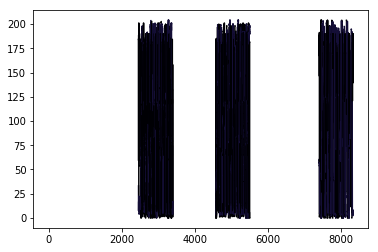

In [309]:
npl.plot(asa)

Text(0,0.5,'familiar E2 center order linearized position')

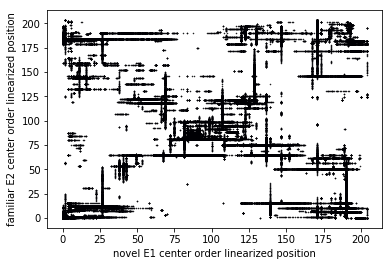

In [345]:
plt.plot(posjoint.ydata[0], posjoint.ydata[1], '.', markersize=1)
plt.xlabel('novel E1 center order linearized position')
plt.ylabel('familiar E2 center order linearized position')

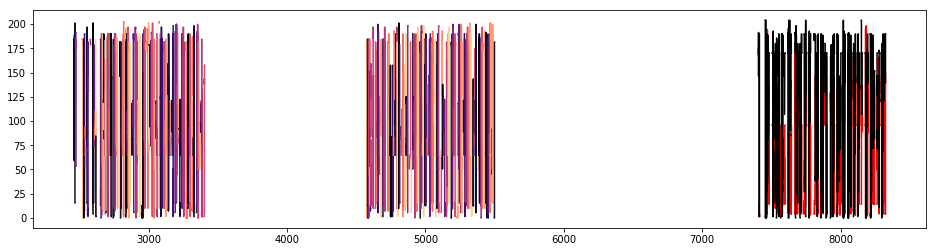

In [279]:
fig, axs = plt.subplots(1,1,figsize=(16,4))
npl.plot(pos_E1a_decoded, c='r')
npl.plot(pos_E1b_decoded, c='k')
npl.plot(pos_E2_decoded)

In [243]:
asa.add_signal()

<AnalogSignalArray at 0x1eb29b06390: 1 signals (530 segments)> for a total of 23:38:035 minutes

In [285]:
append_ASAs(append_ASAs(data[animal][day]['pos_linear_center_ordering'][1], data[animal][day]['pos_linear_center_ordering'][3]), data[animal][day]['pos_linear_center_ordering'][5])

<AnalogSignalArray at 0x1eb162e4f98: 1 signals (3 segments)> for a total of 46:52:351 minutes

In [246]:
data[animal][day]['pos_linear_center_ordering'][1][run_epochs].n_samples

15,061

(2500, 3500)

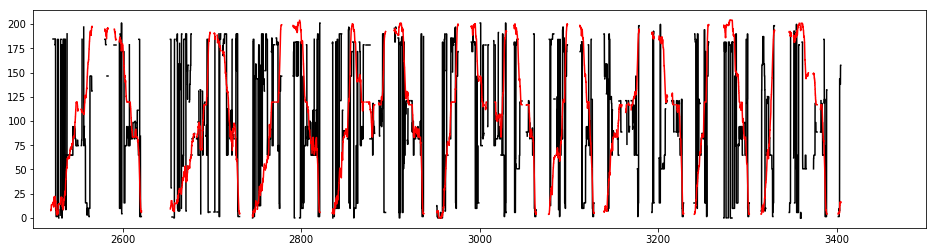

In [244]:
fig, axs = plt.subplots(1,1,figsize=(16,4))
npl.plot(pos_E2_decoded, c='k')
npl.plot(data[animal][day]['pos_linear_center_ordering'][1][run_epochs], c='r')
ax = plt.gca()
ax.set_xlim(2500,3500)

array([[  8.44,   8.44,   8.44, ...,  16.88,  16.88,  16.88]])

In [196]:
new_pos = nel.AnalogSignalArray(empty=True)
new_pos._time = bst.centers
new_pos._support = bst.support
new_pos._ydata = np.atleast_2d(mode_pth)
new_pos._fs = 1/bst.ds
new_pos

<AnalogSignalArray at 0x1eaf9061b38: 1 signals (106 segments)> for a total of 6:59:160 minutes

In [188]:
nel.EpochArray(nel.utils.get_contiguous_segments(bst.centers))

<EpochArray at 0x1eaf58ec780: 106 epochs> of duration 6:59:160 minutes

In [185]:
tc = data[animal][day]['tuning_curves1D_center'][5]
bst = bst_run_E2

# placecells = data[animal][day]['PlaceCellIDs'][5]
# tc = tc._unit_subset(placecells)
# bst = bst._unit_subset(placecells)

posteriors, cum_lenghts, mode_pth, mean_pth = nel.decoding.decode1D(bst=bst, ratemap=tc)

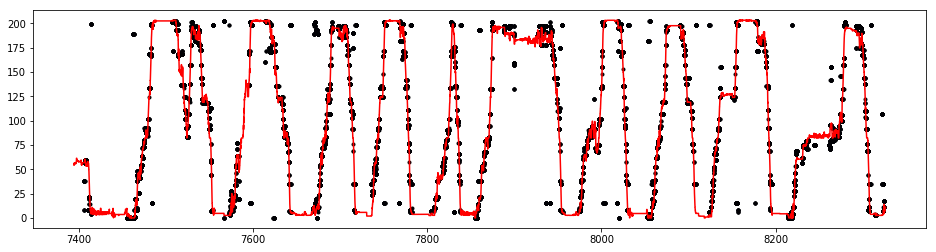

In [184]:
fig, axs = plt.subplots(1,1,figsize=(16,4))
plt.plot(bst.centers, mode_pth, '.')
npl.plot(data[animal][day]['pos_linear_center_ordering'][5], c='r')

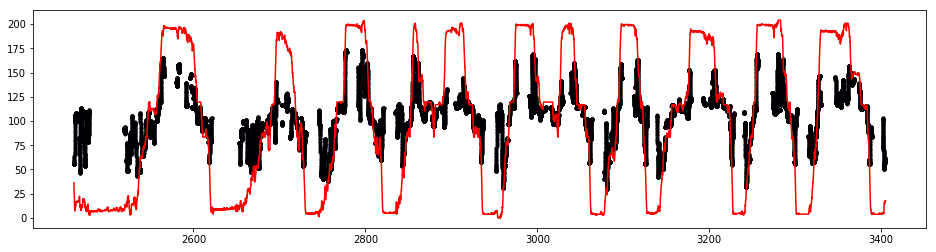

In [169]:
fig, axs = plt.subplots(1,1,figsize=(16,4))
plt.plot(bst.centers, mean_pth, '.')
npl.plot(data[animal][day]['pos_linear_center_ordering'][1], c='r')

In [70]:
data[animal][day]['tuning_curves1D_center']

{1: <TuningCurve1D at 0x1ea4bc160f0> with shape (74, 150),
 3: <TuningCurve1D at 0x1ea4bc17128> with shape (74, 150),
 5: <TuningCurve1D at 0x1ea4bc180b8> with shape (74, 150)}

In [71]:
data[animal][day]['PlaceCellIDs']

{1: array([ 0,  9, 13, 15, 17, 18, 19, 23, 27, 28, 29, 30, 31, 32, 33, 34, 35,
        38, 39, 41, 42, 43, 45, 46, 47, 52, 54, 55, 59, 73], dtype=int64),
 3: array([ 0,  9, 13, 15, 17, 18, 19, 23, 27, 28, 29, 30, 31, 32, 33, 34, 35,
        38, 39, 41, 42, 43, 46, 47, 52, 54, 55, 58, 59, 65, 73], dtype=int64),
 5: array([ 0,  2,  6,  8, 11, 12, 16, 18, 19, 23, 24, 26, 28, 29, 30, 31, 32,
        36, 39, 42, 43, 54, 55, 57, 58, 59, 62, 63, 70, 73], dtype=int64)}

In [69]:
data[animal][day].keys()

dict_keys(['ripple_epochs', 'speed', 'VTC_E2', 'pos_ideal', 'pos_linear_outer_ordering', 'elife', 'HMM_E2', 'tuning_curves1D_outer', 'pos_linear_center_ordering', 'run_epochs', 'remote_replay_E1_in_E2', 'task_metadata', 'task_epochs', 'VTC_E1', 'pos', 'spikes', 'HMM_E1', 'cell_metadata', 'tuning_curves2D', 'tuning_curves2D_ideal', 'PlaceCellIDs', 'tuning_curves1D_center'])

In [67]:
pos_E1_true

<AnalogSignalArray at 0x1eaaac03c50: 1 signals (2 segments)> for a total of 31:20:996 minutes

In [68]:
pos_E2_true

<AnalogSignalArray at 0x1ea4734bf28: 1 signals> for a total of 15:31:355 minutes

# Session quality of residual models...

In [374]:
k_folds = 5
num_states = 30
n_shuffles = 2500
verbose = 1

In [375]:
thresholds = np.array(100-np.logspace(0,2,30)+1)[::-1]
thresholds

array([   1.        ,   15.68321476,   28.21046156,   38.89830581,
         48.01683094,   55.79646344,   62.43379579,   68.09655438,
         72.92783796,   77.0497338 ,   80.56640282,   83.56671178,
         86.12647893,   88.31038997,   90.17363266,   91.76329143,
         93.11953718,   94.27664246,   95.26384749,   96.10609908,
         96.82468106,   97.43775211,   97.96080462,   98.4070562 ,
         98.78778371,   99.11260818,   99.38973797,   99.6261762 ,
         99.8278977 ,  100.        ])

In [44]:
# [candidate_to_global_map[xx] for xx in np.argwhere(data[animal][day]['elife']['local_replay_percentiles'] > bayes_threshold).squeeze()]

In [45]:
# removing local BD+

bst = bst_all_ripples[candidate_ids]

residual_quality = np.zeros(len(thresholds))

for bb, bayes_threshold in enumerate(thresholds):
    bayes_idx = np.argwhere(data[animal][day]['elife']['local_replay_percentiles'] > bayes_threshold).squeeze()
    residual_idx = np.array(list(set(range(len(candidate_ids))) - set(bayes_idx)))

    print('\n{:} ({:2.1f} %) Bayesian significant; {} residual events'.format(len(bayes_idx), 100*len(bayes_idx)/(len(residual_idx) + len(bayes_idx)), len(residual_idx) ))
    
    if np.any(residual_idx):
        if bst[residual_idx].n_bins > num_states*2:
            bst_train = bst[residual_idx]

            # determine model quality of residuals
            scores, shuffled = prescreen2(bst=bst_train, 
                                         n_shuffles=n_shuffles, 
                                         num_states=num_states, 
                                         k_folds=k_folds,
                                         verbose=verbose)

            zscore = stats.zmap(scores.mean(), shuffled.mean(axis=0))
            print(bayes_threshold, zscore)
            residual_quality[bb] = zscore
            
        else:
            print('not enough residuals at this threshold, skipping...')
    else:
        print('not enough residuals at this threshold, skipping...')


41 (100.0 %) Bayesian significant; 0 residual events
not enough residuals at this threshold, skipping...

38 (92.7 %) Bayesian significant; 3 residual events
not enough residuals at this threshold, skipping...

38 (92.7 %) Bayesian significant; 3 residual events
not enough residuals at this threshold, skipping...

37 (90.2 %) Bayesian significant; 4 residual events
not enough residuals at this threshold, skipping...

36 (87.8 %) Bayesian significant; 5 residual events
not enough residuals at this threshold, skipping...

35 (85.4 %) Bayesian significant; 6 residual events
not enough residuals at this threshold, skipping...

32 (78.0 %) Bayesian significant; 9 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
62.4337957884 3.91155103477

28 (68.3 %) Bayesian significant; 13 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
68.0965543769 3.65501494768

28 (68.3 %) Bayesian significant; 13 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/

In [376]:
# removing remote BD+

bst = bst_all_ripples[candidate_ids]

residual_quality = np.zeros(len(thresholds))

for bb, bayes_threshold in enumerate(thresholds):
    bayes_idx = np.argwhere(data[animal][day]['elife']['remote_replay_percentiles'] > bayes_threshold).squeeze()
    residual_idx = np.array(list(set(range(len(candidate_ids))) - set(bayes_idx)))

    print('\n{:} ({:2.1f} %) Bayesian significant; {} residual events'.format(len(bayes_idx), 100*len(bayes_idx)/(len(residual_idx) + len(bayes_idx)), len(residual_idx) ))
    
    if np.any(residual_idx):
        if bst[residual_idx].n_bins > num_states*2:
            bst_train = bst[residual_idx]

            # determine model quality of residuals
            scores, shuffled = prescreen2(bst=bst_train, 
                                         n_shuffles=n_shuffles, 
                                         num_states=num_states, 
                                         k_folds=k_folds,
                                         verbose=verbose)

            zscore = stats.zmap(scores.mean(), shuffled.mean(axis=0))
            print(bayes_threshold, zscore)
            residual_quality[bb] = zscore
            
        else:
            print('not enough residuals at this threshold, skipping...')
    else:
        print('not enough residuals at this threshold, skipping...')


41 (100.0 %) Bayesian significant; 0 residual events
not enough residuals at this threshold, skipping...

40 (97.6 %) Bayesian significant; 1 residual events
not enough residuals at this threshold, skipping...

39 (95.1 %) Bayesian significant; 2 residual events
not enough residuals at this threshold, skipping...

39 (95.1 %) Bayesian significant; 2 residual events
not enough residuals at this threshold, skipping...

38 (92.7 %) Bayesian significant; 3 residual events
not enough residuals at this threshold, skipping...

37 (90.2 %) Bayesian significant; 4 residual events
not enough residuals at this threshold, skipping...

37 (90.2 %) Bayesian significant; 4 residual events
not enough residuals at this threshold, skipping...

37 (90.2 %) Bayesian significant; 4 residual events
not enough residuals at this threshold, skipping...

37 (90.2 %) Bayesian significant; 4 residual events
not enough residuals at this threshold, skipping...

37 (90.2 %) Bayesian significant; 4 residual events
n

Text(0.5,1,'w maze session (in E2)')

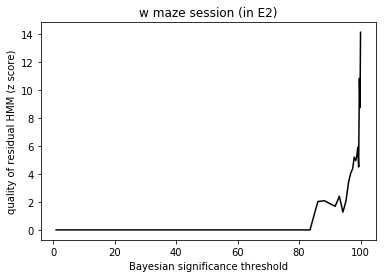

In [377]:
plt.plot(thresholds, residual_quality)
plt.xlabel('Bayesian significance threshold')
plt.ylabel('quality of residual HMM (z score)');
plt.title('w maze session (in E2)')

In [378]:
bst = bst_all_ripples[candidate_ids]
n_repeats = 15

residual_quality = np.zeros((len(thresholds), n_repeats))

for rr in range(n_repeats):
    for bb, bayes_threshold in enumerate(thresholds):
        bayes_idx = np.argwhere(data[animal][day]['elife']['remote_replay_percentiles'] > bayes_threshold).squeeze()
        residual_idx = np.array(list(set(range(len(candidate_ids))) - set(bayes_idx)))

        print('\n{:} ({:2.1f} %) Bayesian significant; {} residual events'.format(len(bayes_idx), 100*len(bayes_idx)/(len(residual_idx) + len(bayes_idx)), len(residual_idx) ))

        if np.any(residual_idx):
            if bst[residual_idx].n_bins > num_states*2:
                bst_train = bst[residual_idx]

                # determine model quality of residuals
                scores, shuffled = prescreen2(bst=bst_train, 
                                             n_shuffles=n_shuffles, 
                                             num_states=num_states, 
                                             k_folds=k_folds,
                                             verbose=verbose,
                                             randomize=True)

                zscore = stats.zmap(scores.mean(), shuffled.mean(axis=0))
                print(bayes_threshold, zscore)
                residual_quality[bb, rr] = zscore

            else:
                print('not enough residuals at this threshold, skipping...')
        else:
            print('not enough residuals at this threshold, skipping...')


41 (100.0 %) Bayesian significant; 0 residual events
not enough residuals at this threshold, skipping...

40 (97.6 %) Bayesian significant; 1 residual events
not enough residuals at this threshold, skipping...

39 (95.1 %) Bayesian significant; 2 residual events
not enough residuals at this threshold, skipping...

39 (95.1 %) Bayesian significant; 2 residual events
not enough residuals at this threshold, skipping...

38 (92.7 %) Bayesian significant; 3 residual events
not enough residuals at this threshold, skipping...

37 (90.2 %) Bayesian significant; 4 residual events
not enough residuals at this threshold, skipping...

37 (90.2 %) Bayesian significant; 4 residual events
not enough residuals at this threshold, skipping...

37 (90.2 %) Bayesian significant; 4 residual events
not enough residuals at this threshold, skipping...

37 (90.2 %) Bayesian significant; 4 residual events
not enough residuals at this threshold, skipping...

37 (90.2 %) Bayesian significant; 4 residual events
n

  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
86.1264789271 3.20547581532

31 (75.6 %) Bayesian significant; 10 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
88.3103899683 1.95172309895

31 (75.6 %) Bayesian significant; 10 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
90.1736326613 2.71093582383

31 (75.6 %) Bayesian significant; 10 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
91.7632914281 2.09648140869

31 (75.6 %) Bayesian significant; 10 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
93.1195371843 1.58587584655

30 (73.2 %) Bayesian significant; 11 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
94.2766424635 3.84399393566

29 (70.7 %) Bayesian significant; 12 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
95.2638474896 3.43953973

27 (65.9 %) Bayesian significant; 14 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5


  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
95.2638474896 2.33679182953

27 (65.9 %) Bayesian significant; 14 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
96.1060990815 2.27464311775

27 (65.9 %) Bayesian significant; 14 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
96.8246810634 2.99709697478

27 (65.9 %) Bayesian significant; 14 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
97.4377521097 4.77632507035

24 (58.5 %) Bayesian significant; 17 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
97.9608046177 3.69915005855

24 (58.5 %) Bayesian significant; 17 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
98.4070562026 4.08790853603

22 (53.7 %) Bayesian significant; 19 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
98.7877837089 4.07115511132

19 (46.3 %) Bayesian significant; 22 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5

  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
98.7877837089 4.04434935354

19 (46.3 %) Bayesian significant; 22 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
99.1126081779 5.17668125389

18 (43.9 %) Bayesian significant; 23 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
99.3897379724 5.42432813539

14 (34.1 %) Bayesian significant; 27 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
99.6261762041 9.04214710077

13 (31.7 %) Bayesian significant; 28 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
99.8278977025 10.4527183631

0 (0.0 %) Bayesian significant; 41 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
100.0 14.0600302908

41 (100.0 %) Bayesian significant; 0 residual events
not enough residuals at this threshold, skipping...

40 (97.6 %) Bayesian significant; 1 residual events
not enough residuals at this threshold, skipping...

39 (95.1 %) Bayesian significant; 2 resid

  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
86.1264789271 1.1865428507

31 (75.6 %) Bayesian significant; 10 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
88.3103899683 2.0444253163

31 (75.6 %) Bayesian significant; 10 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
90.1736326613 1.79065323913

31 (75.6 %) Bayesian significant; 10 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
91.7632914281 2.77847294032

31 (75.6 %) Bayesian significant; 10 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
93.1195371843 2.72786923861

30 (73.2 %) Bayesian significant; 11 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
94.2766424635 3.5224290484

29 (70.7 %) Bayesian significant; 12 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
95.2638474896 1.63663593591

27 (65.9 %) Bayesian significant; 14 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5


  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
95.2638474896 1.84002038792

27 (65.9 %) Bayesian significant; 14 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
96.1060990815 3.3776753565

27 (65.9 %) Bayesian significant; 14 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
96.8246810634 2.46463049016

27 (65.9 %) Bayesian significant; 14 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
97.4377521097 5.1811281604

24 (58.5 %) Bayesian significant; 17 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
97.9608046177 2.92781837905

24 (58.5 %) Bayesian significant; 17 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
98.4070562026 4.05254293974

22 (53.7 %) Bayesian significant; 19 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
98.7877837089 4.56202246535

19 (46.3 %) Bayesian significant; 22 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5

  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
98.7877837089 3.61535958676

19 (46.3 %) Bayesian significant; 22 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
99.1126081779 5.28614917528

18 (43.9 %) Bayesian significant; 23 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
99.3897379724 5.37997726029

14 (34.1 %) Bayesian significant; 27 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
99.6261762041 9.22764052641

13 (31.7 %) Bayesian significant; 28 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
99.8278977025 9.6736243843

0 (0.0 %) Bayesian significant; 41 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
100.0 15.1464038796

41 (100.0 %) Bayesian significant; 0 residual events
not enough residuals at this threshold, skipping...

40 (97.6 %) Bayesian significant; 1 residual events
not enough residuals at this threshold, skipping...

39 (95.1 %) Bayesian significant; 2 residu

In [387]:
n_residuals = []
frac_residuals = []
for bb, bayes_threshold in enumerate(thresholds):
    bayes_idx = np.argwhere(data[animal][day]['elife']['remote_replay_percentiles'] > bayes_threshold).squeeze()
    n_residuals.append(len(data[animal][day]['elife']['remote_replay_percentiles']) - len(bayes_idx))
    frac_residuals.append((len(data[animal][day]['elife']['remote_replay_percentiles']) - len(bayes_idx))/len(candidate_ids))

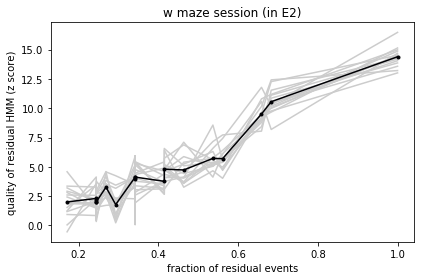

In [391]:
fig = plt.gcf()
residual_quality[residual_quality==0] = np.NAN
plt.plot(frac_residuals, residual_quality, color='0.8')
plt.plot(frac_residuals, residual_quality.mean(axis=1), label='M=10000', linestyle='-', marker='.')
plt.xlabel('fraction of residual events')
plt.ylabel('quality of residual HMM (z score)');
plt.title('w maze session (in E2)')

ax1 = plt.gca()

# ax2 = ax1.twinx()
# ax2.plot(thresholds, n_residuals, '.-', color='darkorange')
# ax2.tick_params('y', colors='darkorange')
# ax2.set_ylabel('number of residual events', color='darkorange')

# ax1.set_xlim(60,100)

fig.tight_layout()
plt.show()

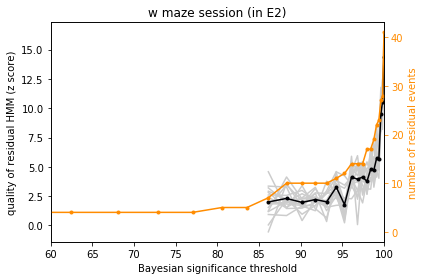

In [380]:
fig = plt.gcf()
residual_quality[residual_quality==0] = np.NAN
plt.plot(thresholds, residual_quality, color='0.8')
plt.plot(thresholds, residual_quality.mean(axis=1), label='M=10000', linestyle='-', marker='.')
plt.xlabel('Bayesian significance threshold')
plt.ylabel('quality of residual HMM (z score)');
plt.title('w maze session (in E2)')

ax1 = plt.gca()

ax2 = ax1.twinx()
ax2.plot(thresholds, n_residuals, '.-', color='darkorange')
ax2.tick_params('y', colors='darkorange')
ax2.set_ylabel('number of residual events', color='darkorange')

ax1.set_xlim(60,100)

fig.tight_layout()
plt.show()

In [412]:
# jar = nel.ResultsContainer(residual_quality_rem=residual_quality_rem)
# jar.save_pkl('sweep_residual_w2_25000_15_remote.nel')

In [ ]:
jar = nel.load_pkl('sweep_residual_w2_25000_15.nel')
residual_quality_loc = jar.residual_quality

In [409]:
residual_quality_rem = jar.residual_quality


In [385]:
jar = nel.ResultsContainer(residual_quality=residual_quality, animal=animal, day=day, description='removing remote BD+')
jar.save_pkl('removing-remote-BD.nel')

### Randomize CV as well

In [58]:
bst = bst_all_ripples[candidate_ids]
n_repeats = 15

residual_quality = np.zeros((len(thresholds), n_repeats))

for rr in range(n_repeats):
    for bb, bayes_threshold in enumerate(thresholds):
        bayes_idx = np.argwhere(data[animal][day]['elife']['local_replay_percentiles'] > bayes_threshold).squeeze()
        residual_idx = np.array(list(set(range(len(candidate_ids))) - set(bayes_idx)))

        print('\n{:} ({:2.1f} %) Bayesian significant; {} residual events'.format(len(bayes_idx), 100*len(bayes_idx)/(len(residual_idx) + len(bayes_idx)), len(residual_idx) ))

        if np.any(residual_idx):
            if bst[residual_idx].n_bins > num_states*2:
                bst_train = bst[residual_idx]

                # determine model quality of residuals
                scores, shuffled = prescreen2(bst=bst_train, 
                                             n_shuffles=n_shuffles, 
                                             num_states=num_states, 
                                             k_folds=k_folds,
                                             verbose=verbose,
                                             randomize=True)

                zscore = stats.zmap(scores.mean(), shuffled.mean(axis=0))
                print(bayes_threshold, zscore)
                residual_quality[bb, rr] = zscore

            else:
                print('not enough residuals at this threshold, skipping...')
        else:
            print('not enough residuals at this threshold, skipping...')


41 (100.0 %) Bayesian significant; 0 residual events
not enough residuals at this threshold, skipping...

38 (92.7 %) Bayesian significant; 3 residual events
not enough residuals at this threshold, skipping...

38 (92.7 %) Bayesian significant; 3 residual events
not enough residuals at this threshold, skipping...

37 (90.2 %) Bayesian significant; 4 residual events
not enough residuals at this threshold, skipping...

36 (87.8 %) Bayesian significant; 5 residual events
not enough residuals at this threshold, skipping...

35 (85.4 %) Bayesian significant; 6 residual events
not enough residuals at this threshold, skipping...

32 (78.0 %) Bayesian significant; 9 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
62.4337957884 2.74050382892

28 (68.3 %) Bayesian significant; 13 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
68.0965543769 3.39917360033

28 (68.3 %) Bayesian significant; 13 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/

  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
62.4337957884 3.53928770293

28 (68.3 %) Bayesian significant; 13 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
68.0965543769 3.85402630366

28 (68.3 %) Bayesian significant; 13 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
72.9278379606 3.14105966801

27 (65.9 %) Bayesian significant; 14 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
77.0497338001 3.13959299933

25 (61.0 %) Bayesian significant; 16 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
80.5664028214 5.63001054234

22 (53.7 %) Bayesian significant; 19 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
83.566711778 6.61132209613

21 (51.2 %) Bayesian significant; 20 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
86.1264789271 8.15970857558

18 (43.9 %) Bayesian significant; 23 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/

  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
77.0497338001 4.34215061247

25 (61.0 %) Bayesian significant; 16 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
80.5664028214 6.54263035095

22 (53.7 %) Bayesian significant; 19 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
83.566711778 7.56387018656

21 (51.2 %) Bayesian significant; 20 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
86.1264789271 7.72869477248

18 (43.9 %) Bayesian significant; 23 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
88.3103899683 9.00651282676

17 (41.5 %) Bayesian significant; 24 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
90.1736326613 9.24698644799

16 (39.0 %) Bayesian significant; 25 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
91.7632914281 7.82708021772

15 (36.6 %) Bayesian significant; 26 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/

  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
86.1264789271 9.4529577286

18 (43.9 %) Bayesian significant; 23 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
88.3103899683 8.26777052794

17 (41.5 %) Bayesian significant; 24 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
90.1736326613 11.3304076265

16 (39.0 %) Bayesian significant; 25 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
91.7632914281 9.6533458204

15 (36.6 %) Bayesian significant; 26 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
93.1195371843 9.79199583222

13 (31.7 %) Bayesian significant; 28 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
94.2766424635 10.1213019878

12 (29.3 %) Bayesian significant; 29 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
95.2638474896 11.7081626841

10 (24.4 %) Bayesian significant; 31 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5

  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
91.7632914281 8.46595434746

15 (36.6 %) Bayesian significant; 26 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
93.1195371843 9.80744923347

13 (31.7 %) Bayesian significant; 28 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
94.2766424635 9.66325310506

12 (29.3 %) Bayesian significant; 29 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
95.2638474896 10.1247866349

10 (24.4 %) Bayesian significant; 31 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
96.1060990815 11.7080621168

10 (24.4 %) Bayesian significant; 31 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
96.8246810634 11.514160347

10 (24.4 %) Bayesian significant; 31 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
97.4377521097 11.3823237698

8 (19.5 %) Bayesian significant; 33 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5

  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
95.2638474896 11.0128073996

10 (24.4 %) Bayesian significant; 31 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
96.1060990815 10.33083255

10 (24.4 %) Bayesian significant; 31 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
96.8246810634 8.89365058138

10 (24.4 %) Bayesian significant; 31 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
97.4377521097 10.7582254678

8 (19.5 %) Bayesian significant; 33 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
97.9608046177 12.262830517

7 (17.1 %) Bayesian significant; 34 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
98.4070562026 12.0519922027

6 (14.6 %) Bayesian significant; 35 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
98.7877837089 11.9998140855

6 (14.6 %) Bayesian significant; 35 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
99.1

  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
97.4377521097 9.38003271899

8 (19.5 %) Bayesian significant; 33 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
97.9608046177 12.245506004

7 (17.1 %) Bayesian significant; 34 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
98.4070562026 13.4898545572

6 (14.6 %) Bayesian significant; 35 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
98.7877837089 13.5514008294

6 (14.6 %) Bayesian significant; 35 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
99.1126081779 14.603937584

5 (12.2 %) Bayesian significant; 36 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
99.3897379724 13.3233860142

3 (7.3 %) Bayesian significant; 38 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
99.6261762041 14.2590151846

2 (4.9 %) Bayesian significant; 39 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
99.82789

  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
98.7877837089 12.3438491327

6 (14.6 %) Bayesian significant; 35 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
99.1126081779 13.2221728408

5 (12.2 %) Bayesian significant; 36 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
99.3897379724 13.6490963749

3 (7.3 %) Bayesian significant; 38 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
99.6261762041 12.8897377732

2 (4.9 %) Bayesian significant; 39 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
99.8278977025 14.2283209178

0 (0.0 %) Bayesian significant; 41 residual events
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
100.0 15.7300318972


In [413]:
# jar = nel.load_pkl('sweep_residual_w2_25000_15.nel')
# residual_quality_loc = jar.residual_quality

# jar = nel.load_pkl('sweep_residual_w2_25000_15_remote.nel')
# residual_quality_rem = jar.residual_quality_rem

# frac_residuals_loc = []
# n_residuals_loc = []
# n_residuals_rem = []
# frac_residuals_rem = []
# for bb, bayes_threshold in enumerate(thresholds):
#     bayes_idx = np.argwhere(data[animal][day]['elife']['local_replay_percentiles'] > bayes_threshold).squeeze()
#     n_residuals_loc.append(len(data[animal][day]['elife']['local_replay_percentiles']) - len(bayes_idx))
#     frac_residuals_loc.append((len(data[animal][day]['elife']['local_replay_percentiles']) - len(bayes_idx))/len(candidate_ids)) 

#     bayes_idx = np.argwhere(data[animal][day]['elife']['remote_replay_percentiles'] > bayes_threshold).squeeze()
#     n_residuals_rem.append(len(data[animal][day]['elife']['remote_replay_percentiles']) - len(bayes_idx))
#     frac_residuals_rem.append((len(data[animal][day]['elife']['remote_replay_percentiles']) - len(bayes_idx))/len(candidate_ids))

In [401]:
jar = nel.ResultsContainer(residual_quality=residual_quality)
jar.save_pkl('sweep_residual_w2_25000_15.nel')

In [48]:
jar = nel.ResultsContainer(residual_quality=residual_quality)
jar.save_pkl('sweep_residual_w2_10000.nel')

jar = nel.load_pkl('sweep_residual_w2_5000.nel')
res2 = jar.residual_quality

File "sweep_residual_w2_10000.nel" already exists! Aborting...


In [479]:
jar = nel.load_pkl('sweep_residual_w2_25000_15.nel')
residual_quality_loc = jar.residual_quality

jar = nel.load_pkl('sweep_residual_w2_25000_15_remote.nel')
residual_quality_rem = jar.residual_quality_rem

jar = nel.load_pkl('../../../HMMs/initial submission/e1d/sweep_residual_linw_2500.nel')
n_residuals_lin = jar.n_residuals
n_frac_lin = jar.n_frac
jar = nel.load_pkl('sweep_residual_linw_2500.nel')
residual_quality_lin = jar.residual_quality

jar = nel.load_pkl('../../../HMMs/initial submission/e1d/best_lin_session_qual.nel')
n_frac_b = jar.n_frac
residual_quality_b = jar.residual_quality

frac_residuals_loc = []
n_residuals_loc = []
n_residuals_rem = []
frac_residuals_rem = []
n_residuals_lin = []
frac_residuals_lin = []

for bb, bayes_threshold in enumerate(thresholds):
    bayes_idx = np.argwhere(data[animal][day]['elife']['local_replay_percentiles'] > bayes_threshold).squeeze()
    n_residuals_loc.append(len(data[animal][day]['elife']['local_replay_percentiles']) - len(bayes_idx))
    frac_residuals_loc.append((len(data[animal][day]['elife']['local_replay_percentiles']) - len(bayes_idx))/len(candidate_ids)) 

    bayes_idx = np.argwhere(data[animal][day]['elife']['remote_replay_percentiles'] > bayes_threshold).squeeze()
    n_residuals_rem.append(len(data[animal][day]['elife']['remote_replay_percentiles']) - len(bayes_idx))
    frac_residuals_rem.append((len(data[animal][day]['elife']['remote_replay_percentiles']) - len(bayes_idx))/len(candidate_ids))

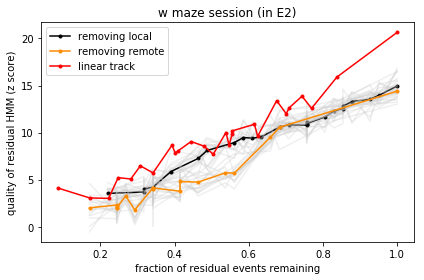

In [458]:
fig = plt.gcf()
residual_quality_loc[residual_quality_loc==0] = np.NAN
residual_quality_loc[residual_quality_loc==0] = np.NAN
residual_quality_rem[residual_quality_rem==0] = np.NAN
residual_quality_rem[residual_quality_rem==0] = np.NAN
residual_quality_lin[residual_quality_lin==0] = np.NAN
residual_quality_lin[residual_quality_lin==0] = np.NAN
plt.plot(frac_residuals_loc, residual_quality_loc, color='0.8', alpha=0.3)
plt.plot(frac_residuals_loc, residual_quality_loc.mean(axis=1), label='removing local', linestyle='-', marker='.', color='k')
plt.plot(frac_residuals_rem, residual_quality_rem, color='0.8', alpha=0.3)
plt.plot(frac_residuals_rem, residual_quality_rem.mean(axis=1), label='removing remote', linestyle='-', marker='.', color='darkorange')

plt.plot(n_frac_lin, residual_quality_lin, label='linear track', linestyle='-', marker='.', color='r')

plt.xlabel('fraction of residual events remaining')
plt.ylabel('quality of residual HMM (z score)');
plt.title('w maze session (in E2)')

ax1 = plt.gca()
plt.legend()

# ax2 = ax1.twinx()
# ax2.plot(thresholds, n_residuals, '.-', color='darkorange')
# ax2.tick_params('y', colors='darkorange')
# ax2.set_ylabel('number of residual events', color='darkorange')

# ax1.set_xlim(60,100)

fig.tight_layout()
plt.show()

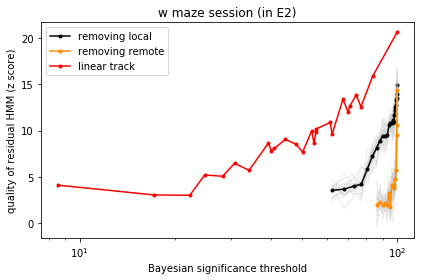

In [461]:
fig = plt.gcf()
residual_quality_loc[residual_quality_loc==0] = np.NAN
residual_quality_loc[residual_quality_loc==0] = np.NAN
residual_quality_rem[residual_quality_rem==0] = np.NAN
residual_quality_rem[residual_quality_rem==0] = np.NAN
plt.semilogx(thresholds, residual_quality_loc, color='0.8', alpha=0.3)
plt.semilogx(thresholds, residual_quality_loc.mean(axis=1), label='removing local', linestyle='-', marker='.', color='k')
plt.semilogx(thresholds, residual_quality_rem, color='0.8', alpha=0.3)
plt.semilogx(thresholds, residual_quality_rem.mean(axis=1), label='removing remote', linestyle='-', marker='.', color='darkorange')
plt.semilogx(np.array(n_frac_lin)*100, residual_quality_lin, label='linear track', linestyle='-', marker='.', color='r')

plt.xlabel('Bayesian significance threshold')
plt.ylabel('quality of residual HMM (z score)');
plt.title('w maze session (in E2)')

ax1 = plt.gca()
plt.legend()

# ax2 = ax1.twinx()
# ax2.plot(thresholds, n_residuals, '.-', color='darkorange')
# ax2.tick_params('y', colors='darkorange')
# ax2.set_ylabel('number of residual events', color='darkorange')

# ax1.set_xlim(60,100)

fig.tight_layout()
plt.show()

In [480]:
lmax = np.nanmax(residual_quality_lin)
locmax = np.nanmax(residual_quality_loc.mean(axis=1))
remmax = np.nanmax(residual_quality_rem.mean(axis=1))
bmax = np.nanmax(residual_quality_b)

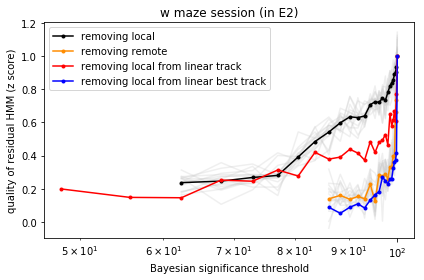

In [485]:
fig = plt.gcf()
residual_quality_loc[residual_quality_loc==0] = np.NAN
residual_quality_loc[residual_quality_loc==0] = np.NAN
residual_quality_rem[residual_quality_rem==0] = np.NAN
residual_quality_rem[residual_quality_rem==0] = np.NAN
residual_quality_lin[residual_quality_lin==0] = np.NAN
residual_quality_lin[residual_quality_lin==0] = np.NAN
residual_quality_b[residual_quality_b==0] = np.NAN
residual_quality_b[residual_quality_b==0] = np.NAN

plt.semilogx(thresholds, residual_quality_loc/locmax, color='0.8', alpha=0.3)
plt.semilogx(thresholds, residual_quality_loc.mean(axis=1)/locmax, label='removing local', linestyle='-', marker='.', color='k')
plt.semilogx(thresholds, residual_quality_rem/remmax, color='0.8', alpha=0.3)
plt.semilogx(thresholds, residual_quality_rem.mean(axis=1)/remmax, label='removing remote', linestyle='-', marker='.', color='darkorange')
plt.semilogx(thresholds, residual_quality_lin/cmax, label='removing local from linear track', linestyle='-', marker='.', color='r')
plt.semilogx(thresholds, residual_quality_b/bmax, label='removing local from linear best track', linestyle='-', marker='.', color='b')


plt.xlabel('Bayesian significance threshold')
plt.ylabel('quality of residual HMM (z score)');
plt.title('w maze session (in E2)')

ax1 = plt.gca()
plt.legend()

# ax2 = ax1.twinx()
# ax2.plot(thresholds, n_residuals, '.-', color='darkorange')
# ax2.tick_params('y', colors='darkorange')
# ax2.set_ylabel('number of residual events', color='darkorange')

# ax1.set_xlim(60,100)

fig.tight_layout()
plt.show()

# Load data from amazon

In [530]:
jar = nel.load_pkl('quality_sweep_all_n10.nel')
aux_data = jar.aux_data
jar = nel.load_pkl('../../../../neoReader/sessions-segments.nel')
sessions = jar.sessions
segments = jar.segments

Text(0,0.5,'normalized session quality')

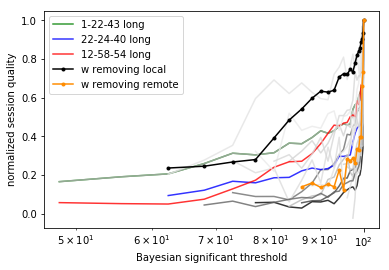

In [573]:
normalize = True
hilite = True

for session, segment in zip(sessions, segments):
    thresholds = aux_data[session][segment]['residual_thresholds']
    residual_quality = aux_data[session][segment]['residual_quality']
    residual_quality[residual_quality==0] = np.nan
    residual_quality = residual_quality.mean(axis=1)
    res_max = np.nanmax(residual_quality)
    if not normalize:
        res_max = 1
    if session == '1-22-43' and segment == 'long' and hilite:
        plt.semilogx(thresholds, residual_quality/res_max, color='g', alpha=0.8, label='{} {}'.format(session, segment))
    if session == '12-58-54' and segment == 'long'and hilite:
        plt.semilogx(thresholds, residual_quality/res_max, color='r', alpha=0.8, label='{} {}'.format(session, segment))
    elif session == '22-24-40' and segment == 'long'and hilite:
        plt.semilogx(thresholds, residual_quality/res_max, color='b', alpha=0.8, label='{} {}'.format(session, segment))
    else:
        b_qual = np.nanmax(aux_data[session][segment]['residual_quality'].mean(axis=1))
        plt.semilogx(thresholds, residual_quality/res_max, color=str(1-b_qual/63), alpha=0.8)
    
#     plt.title('{} {} --- Q={:1.2f}'.format(session, segment, b_qual))
#     plt.show()

if normalize:
#     plt.semilogx(thresholds, residual_quality_loc/locmax, color='0.8', alpha=0.3)
    plt.semilogx(thresholds, residual_quality_loc.mean(axis=1)/locmax, label='w removing local', linestyle='-', marker='.', color='k')
#     plt.semilogx(thresholds, residual_quality_rem/remmax, color='0.8', alpha=0.3)
    plt.semilogx(thresholds, residual_quality_rem.mean(axis=1)/remmax, label='w removing remote', linestyle='-', marker='.', color='darkorange')
#     plt.semilogx(thresholds, residual_quality_lin/cmax, label='removing local from linear track', linestyle='-', marker='.', color='r')
#     plt.semilogx(thresholds, residual_quality_b/bmax, label='removing local from linear best track', linestyle='-', marker='.', color='b')
else:
#     plt.semilogx(thresholds, residual_quality_loc, color='0.8', alpha=0.3)
    plt.semilogx(thresholds, residual_quality_loc.mean(axis=1), label='w removing local', linestyle='-', marker='.', color='k')
#     plt.semilogx(thresholds, residual_quality_rem, color='0.8', alpha=0.3)
    plt.semilogx(thresholds, residual_quality_rem.mean(axis=1), label='w removing remote', linestyle='-', marker='.', color='darkorange')
#     plt.semilogx(thresholds, residual_quality_lin, label='removing local from linear track', linestyle='-', marker='.', color='r')
#     plt.semilogx(thresholds, residual_quality_b, label='removing local from linear best track', linestyle='-', marker='.', color='b')
plt.legend()
plt.xlabel('Bayesian significant threshold')
plt.ylabel('normalized session quality')

svg saved successfully...
pdf saved successfully...
png saved successfully...


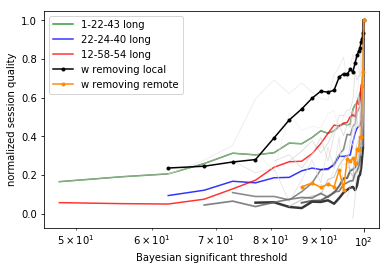

In [581]:
normalize = True
hilite = True

for session, segment in zip(sessions, segments):
    thresholds = aux_data[session][segment]['residual_thresholds']
    residual_quality = aux_data[session][segment]['residual_quality']
    residual_quality[residual_quality==0] = np.nan
    residual_quality = residual_quality.mean(axis=1)
    res_max = np.nanmax(residual_quality)
    if not normalize:
        res_max = 1
    if session == '1-22-43' and segment == 'long' and hilite:
        plt.semilogx(thresholds, residual_quality/res_max, color='g', alpha=0.8, label='{} {}'.format(session, segment))
    if session == '12-58-54' and segment == 'long'and hilite:
        plt.semilogx(thresholds, residual_quality/res_max, color='r', alpha=0.8, label='{} {}'.format(session, segment))
    elif session == '22-24-40' and segment == 'long'and hilite:
        plt.semilogx(thresholds, residual_quality/res_max, color='b', alpha=0.8, label='{} {}'.format(session, segment))
    else:
        b_qual = np.nanmax(aux_data[session][segment]['residual_quality'].mean(axis=1))
        plt.semilogx(thresholds, residual_quality/res_max, color=str(1-b_qual/63), alpha=0.8, lw=0.5+2*(b_qual/63))
    
#     plt.title('{} {} --- Q={:1.2f}'.format(session, segment, b_qual))
#     plt.show()

if normalize:
#     plt.semilogx(thresholds, residual_quality_loc/locmax, color='0.8', alpha=0.3)
    plt.semilogx(thresholds, residual_quality_loc.mean(axis=1)/locmax, label='w removing local', linestyle='-', marker='.', color='k')
#     plt.semilogx(thresholds, residual_quality_rem/remmax, color='0.8', alpha=0.3)
    plt.semilogx(thresholds, residual_quality_rem.mean(axis=1)/remmax, label='w removing remote', linestyle='-', marker='.', color='darkorange')
#     plt.semilogx(thresholds, residual_quality_lin/cmax, label='removing local from linear track', linestyle='-', marker='.', color='r')
#     plt.semilogx(thresholds, residual_quality_b/bmax, label='removing local from linear best track', linestyle='-', marker='.', color='b')
else:
#     plt.semilogx(thresholds, residual_quality_loc, color='0.8', alpha=0.3)
    plt.semilogx(thresholds, residual_quality_loc.mean(axis=1), label='w removing local', linestyle='-', marker='.', color='k')
#     plt.semilogx(thresholds, residual_quality_rem, color='0.8', alpha=0.3)
    plt.semilogx(thresholds, residual_quality_rem.mean(axis=1), label='w removing remote', linestyle='-', marker='.', color='darkorange')
#     plt.semilogx(thresholds, residual_quality_lin, label='removing local from linear track', linestyle='-', marker='.', color='r')
#     plt.semilogx(thresholds, residual_quality_b, label='removing local from linear best track', linestyle='-', marker='.', color='b')
plt.legend()
plt.xlabel('Bayesian significant threshold')
plt.ylabel('normalized session quality')

npl.savefig('residual_d', formats=['svg','pdf','png'])

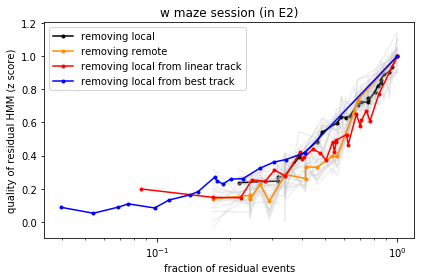

In [486]:
fig = plt.gcf()
residual_quality_loc[residual_quality_loc==0] = np.NAN
residual_quality_loc[residual_quality_loc==0] = np.NAN
residual_quality_rem[residual_quality_rem==0] = np.NAN
residual_quality_rem[residual_quality_rem==0] = np.NAN
plt.semilogx(frac_residuals_loc, residual_quality_loc/locmax, color='0.8', alpha=0.3)
plt.semilogx(frac_residuals_loc, residual_quality_loc.mean(axis=1)/locmax, label='removing local', linestyle='-', marker='.', color='k')
plt.semilogx(frac_residuals_rem, residual_quality_rem/remmax, color='0.8', alpha=0.3)
plt.semilogx(frac_residuals_rem, residual_quality_rem.mean(axis=1)/remmax, label='removing remote', linestyle='-', marker='.', color='darkorange')
plt.semilogx(n_frac_lin, residual_quality_lin/cmax, label='removing local from linear track', linestyle='-', marker='.', color='r')
plt.semilogx(n_frac_b, residual_quality_b/bmax, label='removing local from best track', linestyle='-', marker='.', color='b')


plt.xlabel('fraction of residual events')
plt.ylabel('quality of residual HMM (z score)');
plt.title('w maze session (in E2)')

ax1 = plt.gca()
plt.legend()

# ax2 = ax1.twinx()
# ax2.plot(thresholds, n_residuals, '.-', color='darkorange')
# ax2.tick_params('y', colors='darkorange')
# ax2.set_ylabel('number of residual events', color='darkorange')

# ax1.set_xlim(60,100)

fig.tight_layout()
plt.show()

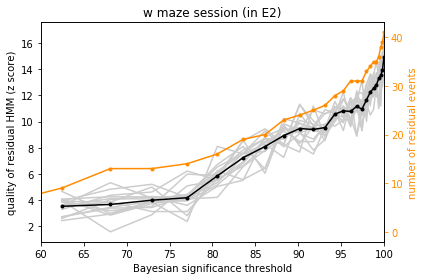

In [75]:
fig = plt.gcf()
residual_quality[residual_quality==0] = np.NAN
plt.plot(thresholds, residual_quality, color='0.8')
plt.plot(thresholds, residual_quality.mean(axis=1), label='M=10000', linestyle='-', marker='.')
plt.xlabel('Bayesian significance threshold')
plt.ylabel('quality of residual HMM (z score)');
plt.title('w maze session (in E2)')

ax1 = plt.gca()

ax2 = ax1.twinx()
ax2.plot(thresholds, n_residuals, '.-', color='darkorange')
ax2.tick_params('y', colors='darkorange')
ax2.set_ylabel('number of residual events', color='darkorange')

ax1.set_xlim(60,100)

fig.tight_layout()
plt.show()

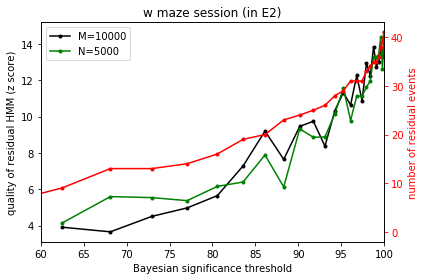

In [53]:
fig = plt.gcf()
residual_quality[residual_quality==0] = np.NAN
res2[res2==0] = np.NAN
plt.plot(thresholds, residual_quality, label='M=10000', linestyle='-', marker='.')
plt.plot(thresholds, res2, c='g', label='N=5000', marker='.')
plt.legend()
plt.xlabel('Bayesian significance threshold')
plt.ylabel('quality of residual HMM (z score)');
plt.title('w maze session (in E2)')

ax1 = plt.gca()

ax2 = ax1.twinx()
ax2.plot(thresholds, n_residuals, '.-r')
ax2.tick_params('y', colors='r')
ax2.set_ylabel('number of residual events', color='r')

ax1.set_xlim(60,100)

fig.tight_layout()
plt.show()

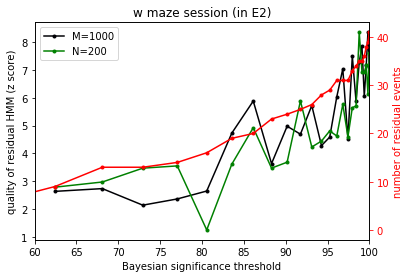

In [259]:
residual_quality[residual_quality==0] = np.NAN
res2[res2==0] = np.NAN
plt.plot(thresholds, residual_quality, label='M=1000', linestyle='-', marker='.')
plt.plot(thresholds, res2, c='g', label='N=200', marker='.')
plt.legend()
plt.xlabel('Bayesian significance threshold')
plt.ylabel('quality of residual HMM (z score)');
plt.title('w maze session (in E2)')

ax1 = plt.gca()

ax2 = ax1.twinx()
ax2.plot(thresholds, n_residuals, '.-r')
ax2.tick_params('y', colors='r')
ax2.set_ylabel('number of residual events', color='r')

ax1.set_xlim(60,100)

fig.tight_layout()
plt.show()

Text(0.5,1,'w maze session (in E2)')

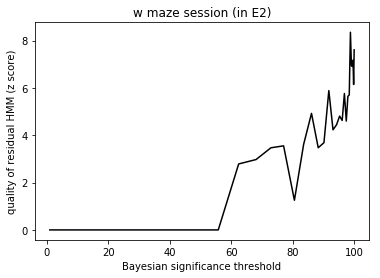

In [911]:
plt.plot(thresholds, residual_quality)
plt.xlabel('Bayesian significance threshold')
plt.ylabel('quality of residual HMM (z score)');
plt.title('w maze session (in E2)')

# Model quality reworked

Using simplified model quality.

In [582]:
jar = nel.load_pkl('quality_sweep_all_n10.nel')
aux_data = jar.aux_data
jar = nel.load_pkl('../../../../neoReader/sessions-segments.nel')
sessions = jar.sessions
segments = jar.segments

In [600]:
# get session quality for each session:
qualities = []
for session, segment in zip(sessions, segments):
    session_quality = aux_data[session][segment]['residual_quality'][-1,:]
    qualities.append(session_quality)
    
quality_df = pd.DataFrame(np.array(qualities).T)

In [606]:
import matplotlib as mpl

pdf saved successfully...
svg saved successfully...
png saved successfully...


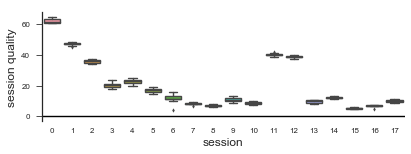

In [611]:
sns.set(rc={'figure.figsize': (6.5, 8),'lines.linewidth': 1, 'font.size': 12})
sns.set_style("ticks")

sns.set_context("paper", rc={"font.size":12,"axes.titlesize":12,"axes.labelsize":12})   
mpl.rcParams['pdf.fonttype'] = 42

fig, ax = plt.subplots(figsize=(6.5, 2))
sns.boxplot(data=quality_df, ax=ax, fliersize=3)
ax.hlines(0, *ax.get_xlim())

sns.despine()
ax.set_ylabel('session quality')
npl.utils.clear_bottom(ax)
npl.utils.clear_top(ax)
npl.utils.no_xticks()
ax.set_xlabel('session')
npl.savefig('S1_new_session_quality', formats=['pdf', 'svg', 'png'])

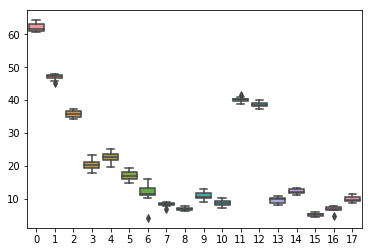

In [604]:
sns.boxplot(data=quality_df)

In [602]:
segments

['short',
 'short',
 'long',
 'long',
 'long',
 'short',
 'long',
 'short',
 'long',
 'long',
 'long',
 'long',
 'short',
 'short',
 'long',
 'long',
 'short',
 'long']

<module 'seaborn' from 'C:\\Users\\etien\\Anaconda3\\lib\\site-packages\\seaborn\\__init__.py'>

# Rework figure for final S5

Caleb's suggested order to the panel was:
- spike train with all cells (expanded, or not? how ordered? by first spike times?)
- state sequence, ordered within the event (do alternative when ordering by transmat)
- score histogram of HMM
- ====
- familiar place cell spike train (highlighted in left panel)
- Bayesian decoding curves + w-maze overhead
- Bayesian scores histogram
- ====
- remote place cell spike train (highlighted in left panel?)
- Bayesian decoding curves + w-maze overhead

In [57]:
bst = bst_all_ripples

In [616]:
def reorder_hmm_by_evt(hmm, evt):
    """evt is a bst"""
    import copy
    def list_unique(seq):
        """Remove duplicate from list while keeping order
        Required arguments:
            seq: A list containing all objects
        Returns:
            A list with only unique values. Only the first occurence is kept.
        """
        def filter_uniques(seq):
            # We use set() since it's faster at lookups.
            seen = set()
            for x in seq:
                if x in seen:
                    continue
                seen.add(x)
                yield x

        return list(filter_uniques(seq))

    hmm = copy.deepcopy(hmm)
    
    states = np.hstack(hmm.predict(evt))

    neworder = list_unique(list(states) + list(range(hmm.n_components)))
    hmm.reorder_states(neworder)
    
    return hmm

In [194]:
def plot_lin_raster_new(st, bst, tc, highlight=None, axr=None, axb=None, ordering='E1a', color='r'):
    
    from mpl_toolkits.axes_grid1 import make_axes_locatable
    from matplotlib.colors import ListedColormap
    
    if axr is None:
        axr = plt.gca()
        
    if highlight is not None:
        npl.rasterplot(st, vertstack=True, lw=1.5, lh=1.5, ax=axr, color='0.7')
        npl.rasterplot(st._unit_subset(highlight), vertstack=True, lw=2, lh=2, ax=axr, color=color)
    else:
        npl.rasterplot(st, vertstack=True, lw=2, lh=2, ax=axr, color='0.3')
    axr.set_xlim(*st.support.time)
    npl.add_scalebar(ax=axr, sizex=0.1, labelx='100 ms', hidey=False, hidex=False)
    npl.utils.clear_left_right()
    npl.utils.clear_top_bottom()
    
    posterior, lengths, mode_pth, mean_pth = nel.decoding.decode1D(bst=bst, ratemap=tc.smooth(sigma=4))
    
    if axb is None:
        divider = make_axes_locatable(axr)
        axb = divider.append_axes("top", size=0.3, pad=0.1)

    bins = np.atleast_2d(posterior.sum(axis=0))
    non_empty_idx = np.argwhere(~np.isnan(bins))[:,1]
    n_non_empty = len(non_empty_idx)
    bins[:,non_empty_idx] = np.arange(n_non_empty)

    NUM_COLORS = n_non_empty
    cm = plt.get_cmap('magma')
    # cm = plt.get_cmap('jet')
    clist = [cm(1.*i/NUM_COLORS) for i in range(NUM_COLORS)]
    npl.set_palette(clist)
    nan_jet = ListedColormap(clist, name='nan_jet')

    axb.pcolor(bst.bins, [0,1,], bins, cmap=nan_jet)
    axb.set_xlim(axr.get_xlim())
    
    npl.utils.clear_left_right(axr)
    npl.utils.clear_top_bottom(axr)
    npl.utils.clear_left_right(axb)
    npl.utils.clear_top_bottom(axb)
    
    return

In [195]:
def draw_entire_canvas_new(data, animal, day, bst, hmm, ffsource='remotefignew.svg', evt_idx=0, context = 'E1b_raw', ordering='E1b'):
    
    layout = fifi.FigureLayout(ffsource)
    fig = layout.make_mplfigures();
    
    E1_placecell_ids = data[animal][day]['remote_replay_E1_in_E2']['st_placecells_remote'].unit_ids
    E2_placecell_ids = data[animal][day]['remote_replay_E1_in_E2']['st_placecells_local'].unit_ids
    
    st = data[animal][day]['spikes'][bst[evt_idx].support]
    
    firingorder = st.get_spike_firing_order()
    st = st.reorder_units_by_ids(firingorder)
    
    tcE1a = data[animal][day]['tuning_curves1D_center'][E1a]
    tcE1b = data[animal][day]['tuning_curves1D_center'][E1b]
    tc2 = data[animal][day]['tuning_curves1D_center'][E2]
    
    for mplax in layout.axes.values():
        ax = mplax['axis']
        ax.clear()

#     fifi.mpl_functions.kill_all_labels(layout)

    # decoded 2D trajectory in remote environment
    plot_w_event(data=data,
                 animal=animal,
                 day=day,
                 bst=bst[evt_idx],
                 context=context,
                 ax=layout.axes['ax9']['axis']
                )

    # decoded 2D trajectory in local environment
    plot_w_event(data=data,
                 animal=animal,
                 day=day,
                 bst=bst[evt_idx],
                 context='E2_raw',
                 ax=layout.axes['ax6']['axis']
                )
    
    # spike raster, all cells
    plot_lin_raster_new(st=st,
                        bst=bst[evt_idx],
                        tc=tcE1a,
                        highlight=None,
                        axr=layout.axes['ax0']['axis'],
                        axb=layout.axes['ax0b']['axis'],
                       )
    
    # spike raster, local place cells
    plot_lin_raster_new(st=st,
                        bst=bst[evt_idx],
                        tc=tc2,
                        highlight=E2_placecell_ids,
                        axr=layout.axes['ax3']['axis'],
                        axb=layout.axes['ax3b']['axis'],
                        color=npl.colors.sweet.red
                       )

    # spike raster, remote place cells
    plot_lin_raster_new(st=st,
                        bst=bst[evt_idx],
                        tc=tcE1a,
                        highlight=E1_placecell_ids,
                        axr=layout.axes['ax7']['axis'],
                        axb=layout.axes['ax7b']['axis'],
                        color=npl.colors.sweet.blue
                       )
    
    # linearized decoding, local
    plot_lin_decoded(data=data,
                 animal=animal,
                 day=day,
                 bst=bst[evt_idx],
                 ax=layout.axes['ax4']['axis'],
                 ordering='E2'
                )

    # linearized decoding, remote
    plot_lin_decoded(data=data,
                 animal=animal,
                 day=day,
                 bst=bst[evt_idx],
                 ax=layout.axes['ax8']['axis'],
                 ordering=ordering
                )

    # HMM score distribution
    plot_remote_score_distribution(data=data,
                 animal=animal,
                 day=day,
                 evt_idx=evt_idx,
                 ax=layout.axes['ax2']['axis']
                )
    
    # replay score distribution
    plot_local_bayesian_score_distribution(data=data,
                 animal=animal,
                 day=day,
                 evt_idx=evt_idx,
                 ax=layout.axes['ax5']['axis']
                )
    
    hmm2 = reorder_hmm_by_evt(hmm, bst[evt_idx])
    # plot decoded states
    npl.imagesc(hmm2.predict_proba(bst[evt_idx]), cmap=plt.cm.gray_r, vmin=0, vmax=1, ax=layout.axes['ax1']['axis'])
    npl.utils.clear_top_bottom(layout.axes['ax1']['axis'])
    npl.utils.clear_left_right(layout.axes['ax1']['axis'])
    
    fig.suptitle(evt_idx, y=1.02)
    
    return layout, fig

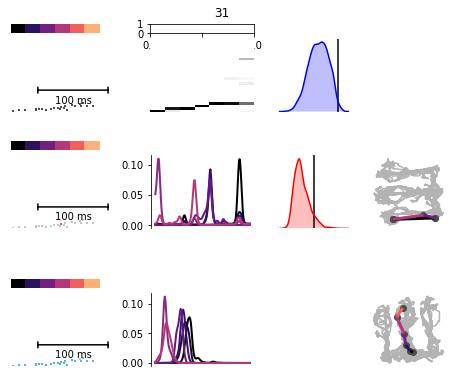

In [224]:
layout, fig = draw_entire_canvas_new(data=data,
                       animal=animal,
                       day=day,
                       hmm=hmm,
                       bst=bst_all_ripples,
                       evt_idx=31)

In [225]:
# fig.savefig('31.png', dpi=300)
layout.set_layer_visibility('axes', False)
layout.set_layer_visibility('labels', True)
layout.save('ff_remote_out.svg')
plt.close('all')
# display(SVG('ff_remote_out.svg'))

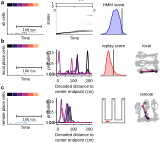

In [226]:
display(SVG('ff_remote_out.svg'))

In [223]:
bst_all_ripples[17].n_active_per_bin

array([0, 1, 4, 5, 2, 1, 1, 5, 2, 1, 1, 0])

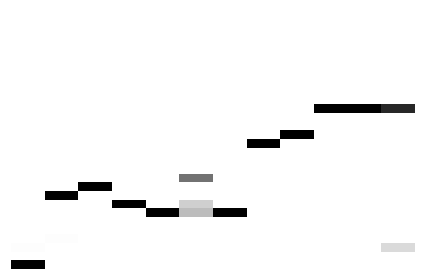

In [221]:
evt_idx = 17
neworder = hmm2.get_state_order()
hmm2.reorder_states(neworder)
# hmm2 = reorder_hmm_by_evt(hmm, bst_all_ripples[evt_idx])
npl.imagesc(hmm2.predict_proba(bst_all_ripples[evt_idx]), cmap=plt.cm.gray_r, vmin=0, vmax=1)
npl.utils.clear_top_bottom()
npl.utils.clear_left_right()
fig = plt.gcf()
ax = plt.gca()
plt.tight_layout()
fig.savefig('17t.png', dpi=300)

# CONTINUE FUNCTIONALIZIATION FROM  HERE

In [ ]:
def get_significant_events():
    """identify significant events:
        - R2 local events
        - R2 remote events
        - Bayesian local events
        - HMM significant (mixed local and remote)
        
    """

In [290]:
threshold = 0.05
np.count_nonzero(data[animal][day]['remote_replay_E1_in_E2']['pvals_local_candidates'] < threshold) # 8/22 regression-based
np.argwhere(data[animal][day]['remote_replay_E1_in_E2']['pvals_local_candidates'] < threshold).squeeze()
# np.argwhere(data[animal][day]['remote_replay_E1_in_E2']['pvals_remote_candidates'] < threshold).squeeze()

array([ 0,  1,  3,  7,  8,  9, 12, 17, 19, 20], dtype=int64)

In [291]:
local_bayes_sig_ids = local_swr_ids[np.argwhere(data[animal][day]['remote_replay_E1_in_E2']['pvals_local_candidates'] < threshold).squeeze()]

In [292]:
residual_ids = list(set(local_swr_ids).union(set(nonlocal_ids)) - set(local_bayes_sig_ids))

In [293]:
_do_residuals = False # warning! If you do this, then re-do the above, so that min_crit_evt_ids are correct...

In [294]:
if _do_residuals:

    bst = bst_all_swr[residual_ids]

    ############################################################
    min_n_active = 4 # number of active cells in ripple
    min_n_bins = 4   # number of 20 ms bins in ripple
    ##########
    n_active = []
    for snippet in bst:
        n_active.append(snippet.n_active)
    ##########    
    n_bins = []
    for snippet in bst_all_swr:
        n_bins.append(snippet.n_bins)

    min_crit_evt_ids = list(set(np.argwhere(np.array(n_bins)>min_n_bins).squeeze()).intersection(set(np.argwhere(np.array(n_active)>min_n_active).squeeze())))
    min_crit_evt_ids.sort()

    bst = bst[min_crit_evt_ids]

    ############################################################
    
    k_folds = 5
    num_states = 30
    n_shuffles = 100
    verbose = 1

    scores, shuffled = prescreen(bst=bst, 
                                 n_shuffles=n_shuffles, 
                                 num_states=num_states, 
                                 k_folds=k_folds,
                                 verbose=verbose)

    zscore = stats.zmap(scores.mean(), shuffled.mean(axis=0))

In [295]:
# Bayesian R^2 significant local events
r2local = local_swr_ids[np.argwhere(data[animal][day]['remote_replay_E1_in_E2']['pvals_local_candidates'] < threshold).squeeze()] 

In [296]:
# Bayesian R^2 significant remote events
r2remote = remote_swr_ids[np.argwhere(data[animal][day]['remote_replay_E1_in_E2']['pvals_remote_candidates'] < threshold).squeeze()]

In [297]:
data[animal][day]['remote_replay_E1_in_E2']['remote_candidate_SWR_IDs']

array([  0,   2,   9,  12,  16,  20,  24,  28,  30,  33,  35,  38,  40,
        42,  44,  45,  48,  51,  55,  62,  69,  71,  73,  78,  83,  92,
        96,  99, 103, 114, 115, 118, 119, 120, 123, 128], dtype=int64)

## Now we score events to identify congruence with our model

In [338]:
bst # already meets min active and min duration requirements

<BinnedSpikeTrainArray at 0x19506b35390: 74 units (41 segments) in 365 bins of width 20.0 milliseconds> for a total of 7.3 seconds

In [299]:
n_shuffles = 5000
k_folds = 5
verbose = 1

# score using transmat shuffle
scores, shuffled_scores, percentiles_trans = nel.analysis.replay.score_hmm_events(bst=bst, 
                                                                            num_states=num_states,
                                                                            n_shuffles=n_shuffles,
                                                                            k_folds=k_folds,
                                                                            shuffle='row-wise',
                                                                            verbose=verbose)

# score using time swap shuffle
scores, shuffled_scores, percentiles_tswap = nel.analysis.replay.score_hmm_events(bst=bst, 
                                                                            num_states=num_states,
                                                                            n_shuffles=n_shuffles,
                                                                            k_folds=k_folds,
                                                                            shuffle='timeswap',
                                                                            verbose=verbose)

  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5


### Score events in E2 using Baysian decoding and line search

In [ ]:
tc = data[animal][day]['tuning_curves1D_center'][5] # E2 linearized center-outer ordering
w = 3
n_samples = 35000

scores, shuffled_scores, percentiles = nel.analysis.replay.score_Davidson_final_bst_fast(bst=bst,
                                                                                         tuningcurve=tc,
                                                                                         w=w,
                                                                                         n_shuffles=n_shuffles,
                                                                                         n_samples=n_samples)

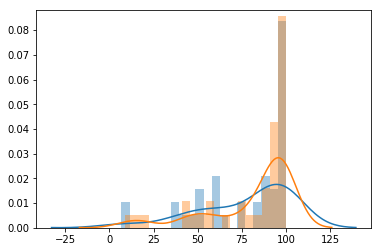

In [337]:
sns.distplot(percentiles_tswap, bins=20)
sns.distplot(percentiles_trans, bins=20)

In [328]:
min_n_active = 4 # number of active cells in ripple
min_n_bins = 4   # number of 20 ms bins in ripple

n_active = []
for snippet in bst:
    n_active.append(snippet.n_active)
    
n_bins = []
for snippet in bst:
    n_bins.append(snippet.n_bins)
    
sig_threshold = 98
sig_threshold = 97
sig_threshold = 99
# remote_ids = np.array(nonlocal_ids)[percentiles_trans > sig_threshold]
remote_ids_tmat = np.array(min_crit_evt_ids)[(np.array(n_active) >= min_n_active) * (np.array(n_bins) >= min_n_bins) * percentiles_trans > sig_threshold]
print(remote_ids_tmat) # ids that were deemed remote significant by the nonlocal E2 HMM

sig_threshold = 97.5
sig_threshold = 97
# sig_threshold = 99.9
remote_ids_tswap = np.array(min_crit_evt_ids)[(np.array(n_active) >= min_n_active) * (np.array(n_bins) >= min_n_bins) * percentiles_tswap > sig_threshold]
print(remote_ids_tswap) # ids that were deemed remote significant by the nonlocal E2 HMM

[  0  32  64  69  87 144 153 159]
[  0  12  25  35  43  64  65  69  72  92  99 119 144 150 159]


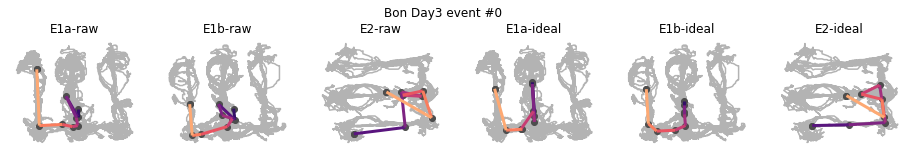

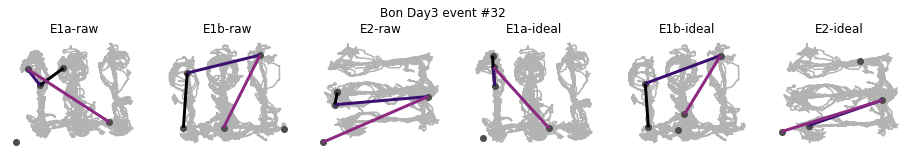

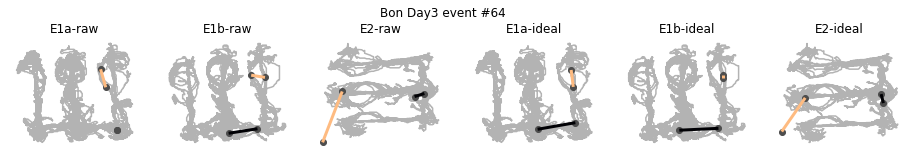

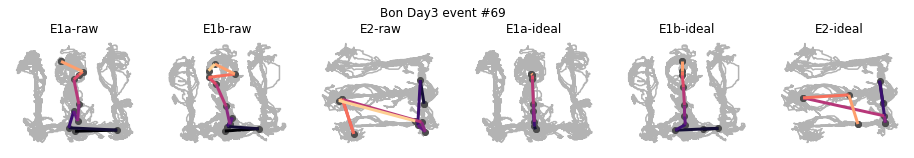

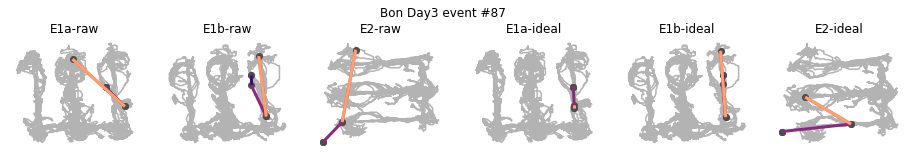

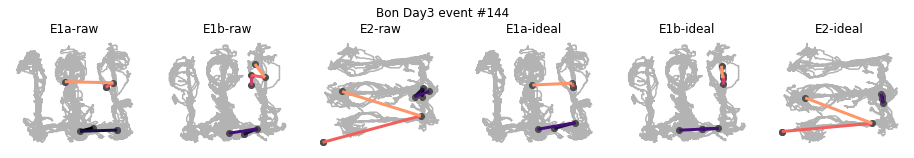

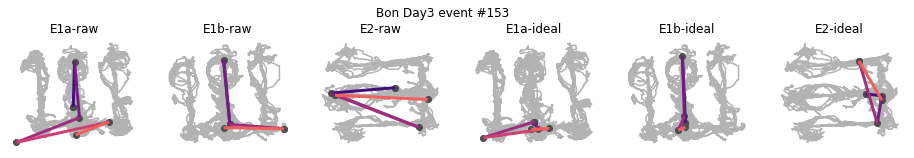

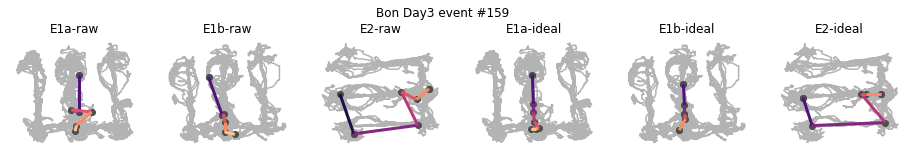

In [329]:
E1a, E1b, E2 = 1, 3, 5
def plot_all_remote_E2_events(data, animal, day):
    try:
#         bst = data[animal][day]['remote_replay_E1_in_E2']['bst_remote_candidates']
#         bst = bst_training
        subset_ids = remote_ids_tswap
        subset_ids = remote_ids_tmat
#         subset_ids = r2remote
        bst = bst_all_swr[subset_ids]
    except KeyError:
        raise UserWarning('The (animal, day) pair does not have remote replay analysis results...')
        return
    
    tc_E1a = data[animal][day]['tuning_curves2D'][E1a]
    tc_E1b = data[animal][day]['tuning_curves2D'][E1b]
    tc_E2 = data[animal][day]['tuning_curves2D'][E2]
    
    tc_E1a_ideal = data[animal][day]['tuning_curves2D_ideal'][E1a]
    tc_E1b_ideal = data[animal][day]['tuning_curves2D_ideal'][E1b]
    tc_E2_ideal = data[animal][day]['tuning_curves2D_ideal'][E2]
    
    pos_E1a = data[animal][day]['pos'][E1a]
    pos_E1b = data[animal][day]['pos'][E1b]
    pos_E2 = data[animal][day]['pos'][E2]

    for idx in range(bst.n_epochs):
        fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize=(16, 2))
        axes = (ax1, ax2, ax3, ax4, ax5, ax6)
        
        posterior, lengths, mode_pth, mean_pth = nel.decoding.decode2D(bst=bst[idx], ratemap=tc_E1a)
        npl.plot2d(pos_E1a, color='0.7', ax=ax1)
        ax1.plot(mode_pth[0,:], mode_pth[1,:], 'o', color='0.3', markersize=6)
        npl.colorline(mode_pth[0,:], mode_pth[1,:], ax=ax1, cmap=plt.cm.magma, lw=3, cm_range=(0,1))
        ax1.set_title('E1a-raw')
        
        posterior, lengths, mode_pth, mean_pth = nel.decoding.decode2D(bst=bst[idx], ratemap=tc_E1b)
        npl.plot2d(pos_E1b, color='0.7', ax=ax2)
        ax2.plot(mode_pth[0,:], mode_pth[1,:], 'o', color='0.3', markersize=6)
        npl.colorline(mode_pth[0,:], mode_pth[1,:], ax=ax2, cmap=plt.cm.magma, lw=3, cm_range=(0,1))
        ax2.set_title('E1b-raw')
        
        posterior, lengths, mode_pth, mean_pth = nel.decoding.decode2D(bst=bst[idx], ratemap=tc_E2)
        npl.plot2d(pos_E2, color='0.7', ax=ax3)
        ax3.plot(mode_pth[0,:], mode_pth[1,:], 'o', color='0.3', markersize=6)
        npl.colorline(mode_pth[0,:], mode_pth[1,:], ax=ax3, cmap=plt.cm.magma, lw=3, cm_range=(0,1))
        ax3.set_title('E2-raw')
        
        posterior, lengths, mode_pth, mean_pth = nel.decoding.decode2D(bst=bst[idx], ratemap=tc_E1a_ideal)
        npl.plot2d(pos_E1a, color='0.7', ax=ax4)
        ax4.plot(mode_pth[0,:], mode_pth[1,:], 'o', color='0.3', markersize=6)
        npl.colorline(mode_pth[0,:], mode_pth[1,:], ax=ax4, cmap=plt.cm.magma, lw=3, cm_range=(0,1))
        ax4.set_title('E1a-ideal')
        
        posterior, lengths, mode_pth, mean_pth = nel.decoding.decode2D(bst=bst[idx], ratemap=tc_E1b_ideal)
        npl.plot2d(pos_E1b, color='0.7', ax=ax5)
        ax5.plot(mode_pth[0,:], mode_pth[1,:], 'o', color='0.3', markersize=6)
        npl.colorline(mode_pth[0,:], mode_pth[1,:], ax=ax5, cmap=plt.cm.magma, lw=3, cm_range=(0,1))
        ax5.set_title('E1b-ideal')

        posterior, lengths, mode_pth, mean_pth = nel.decoding.decode2D(bst=bst[idx], ratemap=tc_E2_ideal)
        npl.plot2d(pos_E2, color='0.7', ax=ax6)
        ax6.plot(mode_pth[0,:], mode_pth[1,:], 'o', color='0.3', markersize=6)
        npl.colorline(mode_pth[0,:], mode_pth[1,:], ax=ax6, cmap=plt.cm.magma, lw=3, cm_range=(0,1))
        ax6.set_title('E2-ideal')
        
        fig.suptitle('{} {} event #{}'.format(animal, day, subset_ids[idx]), y=1.1)
        
        for ax in axes:
            npl.utils.clear_left_right(ax)
            npl.utils.clear_top_bottom(ax)
            
        plt.show()
        
#         if idx in [0,2,13,16]:
#             npl.savefig('traj-{}'.format(idx), fig=fig)
        
plot_all_remote_E2_events(data=data, 
                          animal=animal,
                          day=day)

# Twist! Now we learn an HMM on SWRs in E2, on all NONLOCAL events

All nonlocal events that (a) had at least four time bins, and (b) at least four active cells.

In [21]:
# run_epochs = data[animal][day]['run_epochs']
ripple_epochs = data[animal][day]['ripple_epochs']
ds_SWR = 0.02

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    st = data[animal][day]['spikes'][[5],:] # E2

if st.isempty: # this is true for Fra Day3 epoch 0
    pass
else:
    # get spiketrain during ripples bouts for epoch
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        st_ripples = st[ripple_epochs]

bst_all_swr = st_ripples.bin(ds=ds_SWR)

remote_swr_ids = data[animal][day]['remote_replay_E1_in_E2']['remote_candidate_SWR_IDs'] # 36 candidates
local_swr_ids = data[animal][day]['remote_replay_E1_in_E2']['local_candidate_SWR_IDs'] # 22 candidates; 20 common between local and remote
nonlocal_ids = list(set(range(data[animal][day]['remote_replay_E1_in_E2']['all_ripples'].n_epochs)) - set(local_swr_ids))
nonlocal_swr = data[animal][day]['remote_replay_E1_in_E2']['all_ripples'][nonlocal_ids]
local_swr = data[animal][day]['remote_replay_E1_in_E2']['all_ripples'][local_swr_ids]

bst_nonlocal = nel.BinnedSpikeTrainArray(nel.AnalogSignalArray(bst_all_swr)[nonlocal_swr])
bst_local = nel.BinnedSpikeTrainArray(nel.AnalogSignalArray(bst_all_swr)[local_swr])

bst = bst_all_swr

############################################################
min_n_active = 4 # number of active cells in ripple
min_n_bins = 4   # number of 20 ms bins in ripple
##########
n_active = []
for snippet in bst:
    n_active.append(snippet.n_active)
##########    
n_bins = []
for snippet in bst_all_swr:
    n_bins.append(snippet.n_bins)
    
min_crit_evt_ids = list(set(np.argwhere(np.array(n_bins)>min_n_bins).squeeze()).intersection(set(np.argwhere(np.array(n_active)>min_n_active).squeeze())))
min_crit_evt_ids.sort()

bst = bst[min_crit_evt_ids]

############################################################

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    st = data[animal][day]['spikes'][[5],:] # E2

if bst.isempty: # this is true for Fra Day3 epoch 0
    pass
else:
    bst_training = bst # can also learn HMMs on bst_local, or bst_all_swr; can also restrict on good_evt_ids in nonlocal
    # train HMM on E2 nonlocal SWR data
    hmm = nel.hmmutils.PoissonHMM(n_components=num_states, verbose=False, n_iter=50)
    print('training HMM...')
    hmm.fit(bst_training)
    print('Done!')

training HMM...
Done!


In [22]:
bst_all_swr

<BinnedSpikeTrainArray at 0x1956fc34518: 74 units (162 segments) in 833 bins of width 20.0 milliseconds> for a total of 16.66 seconds

In [23]:
bst

<BinnedSpikeTrainArray at 0x1956fc77208: 74 units (41 segments) in 365 bins of width 20.0 milliseconds> for a total of 7.3 seconds

### Look at lsPFs from nonlocal E2 HMM
Now look at [linearized] lsPFs using HMM, and (a) RUN from E2, and (b) RUN(s) from E1. The hope is, of course, that E1 will have better tiling of the environment, since we know some remote replays are present, and since we've removed a significant amount of the local replays (note: we removed all local candidates, not just those that were actually local replays).

In [76]:
def sub2ind(array_shape, rows, cols):
    return rows*array_shape[1] + cols

def append_ASAs(a, b):
    """Very dumb append; does not check for overlaps or anything... use at your own risk!"""
    c = nel.AnalogSignalArray(empty=True)
    c._ydata = np.hstack((a.ydata, b.ydata))
    c._fs = a.fs
    c._time = np.hstack((a.time, b.time))
    c._support = a.support + b.support
    
    return c

def get_vtc2d(hmm, bst, pos, nx=20, ny=20, normalize=True):
    
    num_states = hmm.n_components
    xpos, ypos = pos.asarray(at=bst.centers).yvals
    
    ext_xmin, ext_xmax = np.floor(pos[:,0].min()/10)*10-1, np.ceil(pos[:,0].max()/10)*10+1
    ext_ymin, ext_ymax = np.floor(pos[:,1].min()/10)*10-1, np.ceil(pos[:,1].max()/10)*10+1
    
    xx_left = np.linspace(ext_xmin, ext_xmax, nx+1)
    xx_mid = np.linspace(ext_xmin, ext_xmax, nx+1)[:-1]; xx_mid += (xx_mid[1]-xx_mid[0])/2
    yy_left = np.linspace(ext_ymin, ext_ymax, ny+1)
    yy_mid = np.linspace(ext_ymin, ext_ymax, ny+1)[:-1]; yy_mid += (yy_mid[1]-yy_mid[0])/2

    ext_y = np.digitize(ypos, yy_left) - 1 # spatial bin numbers
    ext_x = np.digitize(xpos, xx_left) - 1

    t = np.zeros(len(xpos), dtype=np.float)

    for ii, (x, y) in enumerate(zip(ext_x, ext_y)):
        t[ii] = sub2ind((nx, ny), x, y)

    t[t==0] = np.nan
    t[t>=nx*ny] = np.nan

    extern = hmm.fit_ext(X=bst, ext=t, n_extern=nx*ny, normalize=normalize)
    # transform into ratemap shape
    tmp = np.reshape(extern, (num_states, nx, ny))
    vtc_ratemap = np.transpose(tmp, (0,2,1)) # for images, we have (y,x) <==> (r,c) coordinates

    vtc2d = nel.TuningCurve2D(ratemap=vtc_ratemap, min_duration=0, ext_xmin=ext_xmin, ext_xmax=ext_xmax, ext_ymin=ext_ymin, ext_ymax=ext_ymax)
#     vtc2d = vtc2d.smooth(sigma=sigma_tc)
    vtc2d._initialize_mask_from_extern(pos)
    
    return vtc2d    

def get_vtc1d(hmm, bst, pos, nx=50, normalize=True, normalize_by_occupancy=False):
    
    num_states = hmm.n_components
    xpos = pos.asarray(at=bst.centers).yvals
    
    x0=pos.min(); xl=pos.max(); n_extern=nx
    xx_left = np.linspace(x0,xl,n_extern+1)
    xx_mid = np.linspace(x0,xl,n_extern+1)[:-1]; xx_mid += (xx_mid[1]-xx_mid[0])/2

    ext_x = np.digitize(xpos, xx_left) - 1 # spatial bin numbers
    ext_x = ext_x.astype(float)
    ext_x[ext_x==0] = np.nan
    ext_x[ext_x>=n_extern] = np.nan
    
    #### compute occupancy
    if normalize_by_occupancy:
        xmin = x0
        xmax = xl
        bins = np.linspace(xmin, xmax, n_extern+1)
        occupancy, _ = np.histogram(pos.asarray(at=bst.bin_centers).yvals, bins=bins, range=(xmin, xmax))
        occupancy[occupancy==0] = 1
        occupancy = np.atleast_2d(occupancy)
    else:
        occupancy = 1
    ####

    extern = hmm.fit_ext(X=bst, ext=ext_x, n_extern=n_extern, normalize=normalize, occupancy=occupancy)

    vtc = nel.TuningCurve1D(ratemap=extern, min_duration=0, extmin=x0, extmax=xl)
    # vtc = vtc.smooth(sigma=sigma_tc)

    states_in_track_order = np.array(vtc.get_peak_firing_order_ids())-1

#     vtc.reorder_units(inplace=True)

#     hmm.reorder_states(states_in_track_order)
    
    return vtc

In [12]:
normalize=False
normalize_by_occupancy=True

sigma_spk = 0.3 # 300 ms spike smoothing
ds_25ms = 0.025

# for animal, day in sessions:
#     print(animal, day)
    
# try:
#     hmmE1 = data[animal][day]['HMM_E1']
#     hmmE2 = data[animal][day]['HMM_E2']
# except KeyError:
#     print('The (animal, day) pair does not have an HMM; skipping...')
#     continue

run_epochs = data[animal][day]['run_epochs'] # includes all run, during rest epochs as well, but only subsets are used for lsPF
ripple_epochs = data[animal][day]['ripple_epochs']

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    stE1 = data[animal][day]['spikes'][[1,3],:] # use E1 and E3 combined
    stE2 = data[animal][day]['spikes'][[5],:]   # use E2

if stE1.isempty: # this is true for Fra Day3 epoch 0
    pass
else:
    # get spiketrain during run bouts for epoch
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        st_run_no_ripples_E1 = stE1[run_epochs][~ripple_epochs]
        st_run_no_ripples_E2 = stE2[run_epochs][~ripple_epochs]

    # smooth and re-bin:
    bst_run_E1 = st_run_no_ripples_E1.bin(ds=ds_25ms).smooth(sigma=sigma_spk, inplace=True).rebin(w=ds_HMM/ds_25ms)
    bst_run_E2 = st_run_no_ripples_E2.bin(ds=ds_25ms).smooth(sigma=sigma_spk, inplace=True).rebin(w=ds_HMM/ds_25ms)

    # we use the idealized position (2D) to learn the place fields...
    pos_E1_2d = append_ASAs(data[animal][day]['pos_ideal'][1], data[animal][day]['pos_ideal'][3])
    pos_E2_2d = data[animal][day]['pos_ideal'][5]
    
    pos_E1_1d = append_ASAs(data[animal][day]['pos_linear_center_ordering'][1], data[animal][day]['pos_linear_center_ordering'][3])
    pos_E2_1d = data[animal][day]['pos_linear_center_ordering'][5]
    
    lsPF2d_E1 = get_vtc2d(hmm=hmm, bst=bst_run_E1, pos=pos_E1_2d, normalize=normalize)
    lsPF2d_E2 = get_vtc2d(hmm=hmm, bst=bst_run_E2, pos=pos_E2_2d, normalize=normalize)
    lsPF1d_E1 = get_vtc1d(hmm=hmm, bst=bst_run_E1, pos=pos_E1_1d, nx=100, normalize=normalize, normalize_by_occupancy=normalize_by_occupancy)
    lsPF1d_E2 = get_vtc1d(hmm=hmm, bst=bst_run_E2, pos=pos_E2_1d, nx=100, normalize=normalize, normalize_by_occupancy=normalize_by_occupancy)
    
#     data[animal][day]['VTC_E1'] = vtc2d 
#     data[animal][day]['VTC_E2'] = vtc2d

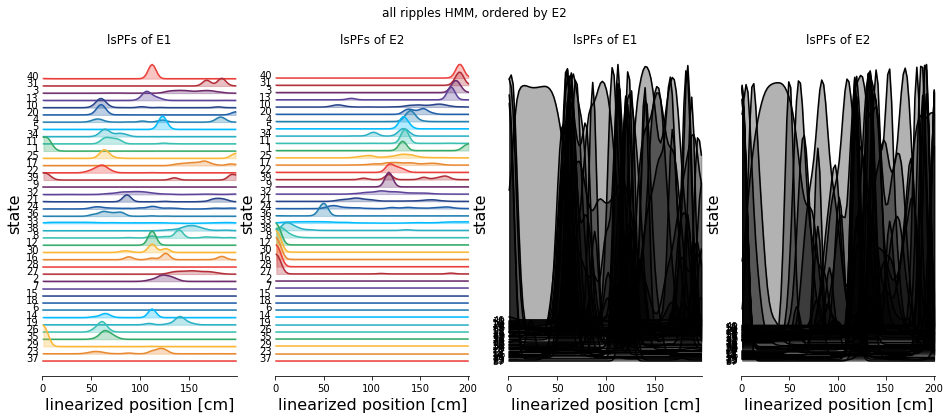

In [48]:
import copy

sigma_tc = 4

tcE1 = copy.deepcopy(lsPF1d_E1.smooth(sigma=sigma_tc))
tcE2 = copy.deepcopy(lsPF1d_E2.smooth(sigma=sigma_tc))

ordering = tcE2.get_peak_firing_order_ids()
tcE1.reorder_units_by_ids(ordering, inplace=True)
tcE2.reorder_units_by_ids(ordering, inplace=True)

bad_states = np.extract(tcE2.ratemap.sum(axis=1) < 0.00005, tcE2.unit_ids)
good_states = np.extract(tcE2.ratemap.sum(axis=1) > 0.00005, tcE2.unit_ids)
new_order = bad_states.tolist() + good_states.tolist()
tcE1.reorder_units_by_ids(neworder=new_order, inplace=True)
tcE2.reorder_units_by_ids(neworder=new_order, inplace=True)

with npl.palettes.color_palette(npl.colors.rainbow):
    with npl.FigureManager(show=True, ncols=4, figsize=(16, 6)) as (fig, axes):
        npl.utils.skip_if_no_output(fig)
        ax0, ax1, ax2, ax3 = axes
        
        npl.plot_tuning_curves1D(tcE1, ax=ax0, pad=0.1);
        ax0.set_xlabel('position [cm]')
        npl.utils.xticks_interval(50, ax0)
        ax0.set_xlabel('linearized position [cm]', size=16)
        ax0.set_ylabel('unit', size=16)
        ax0.set_title('lsPFs of E1')
        ax0.set_ylabel('state')
        
        npl.plot_tuning_curves1D(tcE2, ax=ax1, pad=0.1);
        ax1.set_xlabel('position [cm]')
        npl.utils.xticks_interval(50, ax1)
        ax1.set_xlabel('linearized position [cm]', size=16)
        ax1.set_ylabel('unit', size=16)
        ax1.set_title('lsPFs of E2')
        ax1.set_ylabel('state')
        
        npl.plot_tuning_curves1D(tcE1, ax=ax2, normalize=True, color='k');
        ax2.set_xlabel('position [cm]')
        npl.utils.xticks_interval(50, ax2)
        ax2.set_xlabel('linearized position [cm]', size=16)
        ax2.set_ylabel('unit', size=16)
        ax2.set_title('lsPFs of E1')
        ax2.set_ylabel('state')
        
        npl.plot_tuning_curves1D(tcE2, ax=ax3, normalize=True, color='k');
        ax3.set_xlabel('position [cm]')
        npl.utils.xticks_interval(50, ax3)
        ax3.set_xlabel('linearized position [cm]', size=16)
        ax3.set_ylabel('unit', size=16)
        ax3.set_title('lsPFs of E2')
        ax3.set_ylabel('state')
        
        fig.suptitle('all ripples HMM, ordered by E2')
        

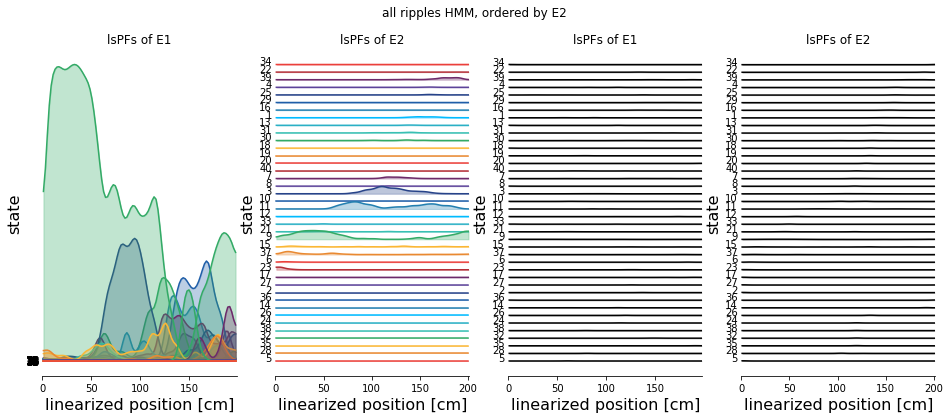

In [18]:
import copy

sigma_tc = 4

tcE1 = copy.deepcopy(lsPF1d_E1.smooth(sigma=sigma_tc))
tcE2 = copy.deepcopy(lsPF1d_E2.smooth(sigma=sigma_tc))

ordering = tcE2.get_peak_firing_order_ids()
tcE1.reorder_units_by_ids(ordering, inplace=True)
tcE2.reorder_units_by_ids(ordering, inplace=True)

bad_states = np.extract(tcE2.ratemap.sum(axis=1) < 0.00005, tcE2.unit_ids)
good_states = np.extract(tcE2.ratemap.sum(axis=1) > 0.00005, tcE2.unit_ids)
new_order = bad_states.tolist() + good_states.tolist()
tcE1.reorder_units_by_ids(neworder=new_order, inplace=True)
tcE2.reorder_units_by_ids(neworder=new_order, inplace=True)

with npl.palettes.color_palette(npl.colors.rainbow):
    with npl.FigureManager(show=True, ncols=4, figsize=(16, 6)) as (fig, axes):
        npl.utils.skip_if_no_output(fig)
        ax0, ax1, ax2, ax3 = axes
        
        npl.plot_tuning_curves1D(tcE1, ax=ax0, pad=1);
        ax0.set_xlabel('position [cm]')
        npl.utils.xticks_interval(50, ax0)
        ax0.set_xlabel('linearized position [cm]', size=16)
        ax0.set_ylabel('unit', size=16)
        ax0.set_title('lsPFs of E1')
        ax0.set_ylabel('state')
        
        npl.plot_tuning_curves1D(tcE2/50, ax=ax1, pad=50);
        ax1.set_xlabel('position [cm]')
        npl.utils.xticks_interval(50, ax1)
        ax1.set_xlabel('linearized position [cm]', size=16)
        ax1.set_ylabel('unit', size=16)
        ax1.set_title('lsPFs of E2')
        ax1.set_ylabel('state')
        
        npl.plot_tuning_curves1D(tcE1, ax=ax2, normalize=True, color='k');
        ax2.set_xlabel('position [cm]')
        npl.utils.xticks_interval(50, ax2)
        ax2.set_xlabel('linearized position [cm]', size=16)
        ax2.set_ylabel('unit', size=16)
        ax2.set_title('lsPFs of E1')
        ax2.set_ylabel('state')
        
        npl.plot_tuning_curves1D(tcE2, ax=ax3, normalize=True, color='k');
        ax3.set_xlabel('position [cm]')
        npl.utils.xticks_interval(50, ax3)
        ax3.set_xlabel('linearized position [cm]', size=16)
        ax3.set_ylabel('unit', size=16)
        ax3.set_title('lsPFs of E2')
        ax3.set_ylabel('state')
        
        fig.suptitle('all ripples HMM, ordered by E2')
        

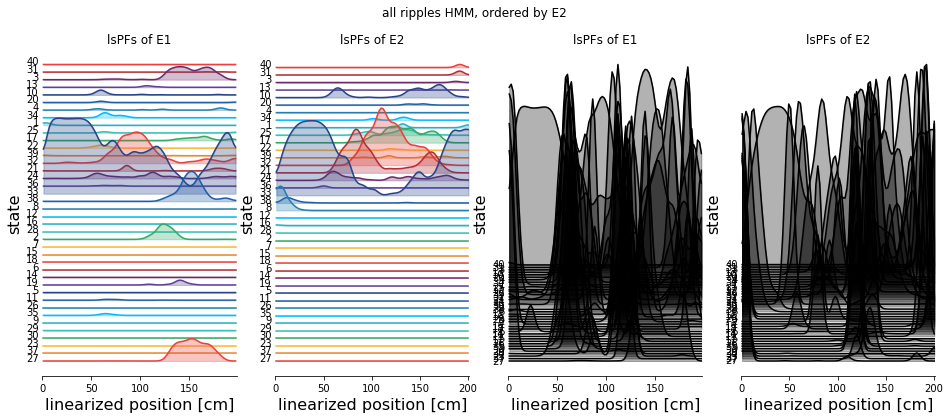

In [46]:
import copy

sigma_tc = 4

tcE1 = copy.deepcopy(lsPF1d_E1.smooth(sigma=sigma_tc))
tcE2 = copy.deepcopy(lsPF1d_E2.smooth(sigma=sigma_tc))

ordering = tcE2.get_peak_firing_order_ids()
tcE1.reorder_units_by_ids(ordering, inplace=True)
tcE2.reorder_units_by_ids(ordering, inplace=True)

bad_states = np.extract(tcE2.ratemap.sum(axis=1) < 0.00005, tcE2.unit_ids)
good_states = np.extract(tcE2.ratemap.sum(axis=1) > 0.00005, tcE2.unit_ids)
new_order = bad_states.tolist() + good_states.tolist()
tcE1.reorder_units_by_ids(neworder=new_order, inplace=True)
tcE2.reorder_units_by_ids(neworder=new_order, inplace=True)

with npl.palettes.color_palette(npl.colors.rainbow):
    with npl.FigureManager(show=True, ncols=4, figsize=(16, 6)) as (fig, axes):
        npl.utils.skip_if_no_output(fig)
        ax0, ax1, ax2, ax3 = axes
        
        npl.plot_tuning_curves1D(tcE1, ax=ax0, pad=0.1);
        ax0.set_xlabel('position [cm]')
        npl.utils.xticks_interval(50, ax0)
        ax0.set_xlabel('linearized position [cm]', size=16)
        ax0.set_ylabel('unit', size=16)
        ax0.set_title('lsPFs of E1')
        ax0.set_ylabel('state')
        
        npl.plot_tuning_curves1D(tcE2, ax=ax1, pad=0.1);
        ax1.set_xlabel('position [cm]')
        npl.utils.xticks_interval(50, ax1)
        ax1.set_xlabel('linearized position [cm]', size=16)
        ax1.set_ylabel('unit', size=16)
        ax1.set_title('lsPFs of E2')
        ax1.set_ylabel('state')
        
        npl.plot_tuning_curves1D(tcE1, ax=ax2, normalize=True, color='k');
        ax2.set_xlabel('position [cm]')
        npl.utils.xticks_interval(50, ax2)
        ax2.set_xlabel('linearized position [cm]', size=16)
        ax2.set_ylabel('unit', size=16)
        ax2.set_title('lsPFs of E1')
        ax2.set_ylabel('state')
        
        npl.plot_tuning_curves1D(tcE2, ax=ax3, normalize=True, color='k');
        ax3.set_xlabel('position [cm]')
        npl.utils.xticks_interval(50, ax3)
        ax3.set_xlabel('linearized position [cm]', size=16)
        ax3.set_ylabel('unit', size=16)
        ax3.set_title('lsPFs of E2')
        ax3.set_ylabel('state')
        
        fig.suptitle('all ripples HMM, ordered by E2')
        

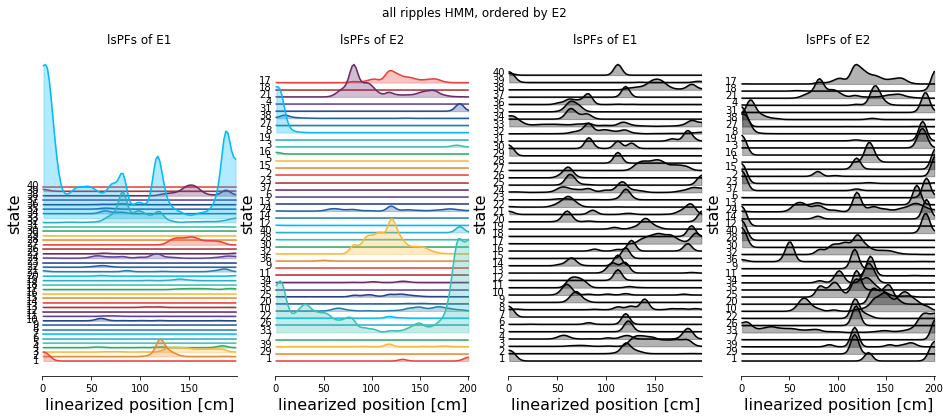

In [19]:
import copy

sigma_tc = 4

tcE1 = copy.deepcopy(lsPF1d_E1.smooth(sigma=sigma_tc))
tcE2 = copy.deepcopy(lsPF1d_E2.smooth(sigma=sigma_tc))

ordering = tcE1.get_peak_firing_order_ids()
# tcE1.reorder_units_by_ids(ordering, inplace=True)
tcE2.reorder_units_by_ids(ordering, inplace=True)

bad_states = np.extract(tcE2.ratemap.sum(axis=1) < 0.5, tcE2.unit_ids)
good_states = np.extract(tcE2.ratemap.sum(axis=1) > 0.5, tcE2.unit_ids)
new_order = bad_states.tolist() + good_states.tolist()
# tcE1.reorder_units_by_ids(neworder=new_order, inplace=True)
# tcE2.reorder_units_by_ids(neworder=new_order, inplace=True)

with npl.palettes.color_palette(npl.colors.rainbow):
    with npl.FigureManager(show=True, ncols=4, figsize=(16, 6)) as (fig, axes):
        npl.utils.skip_if_no_output(fig)
        ax0, ax1, ax2, ax3 = axes
        
        npl.plot_tuning_curves1D(tcE1, ax=ax0, pad=5);
        ax0.set_xlabel('position [cm]')
        npl.utils.xticks_interval(50, ax0)
        ax0.set_xlabel('linearized position [cm]', size=16)
        ax0.set_ylabel('unit', size=16)
        ax0.set_title('lsPFs of E1')
        ax0.set_ylabel('state')
        
        npl.plot_tuning_curves1D(tcE2, ax=ax1, pad=5);
        ax1.set_xlabel('position [cm]')
        npl.utils.xticks_interval(50, ax1)
        ax1.set_xlabel('linearized position [cm]', size=16)
        ax1.set_ylabel('unit', size=16)
        ax1.set_title('lsPFs of E2')
        ax1.set_ylabel('state')
        
        npl.plot_tuning_curves1D(tcE1, ax=ax2, normalize=True, color='k');
        ax2.set_xlabel('position [cm]')
        npl.utils.xticks_interval(50, ax2)
        ax2.set_xlabel('linearized position [cm]', size=16)
        ax2.set_ylabel('unit', size=16)
        ax2.set_title('lsPFs of E1')
        ax2.set_ylabel('state')
        
        npl.plot_tuning_curves1D(tcE2, ax=ax3, normalize=True, color='k');
        ax3.set_xlabel('position [cm]')
        npl.utils.xticks_interval(50, ax3)
        ax3.set_xlabel('linearized position [cm]', size=16)
        ax3.set_ylabel('unit', size=16)
        ax3.set_title('lsPFs of E2')
        ax3.set_ylabel('state')
        
        fig.suptitle('all ripples HMM, ordered by E2')
        

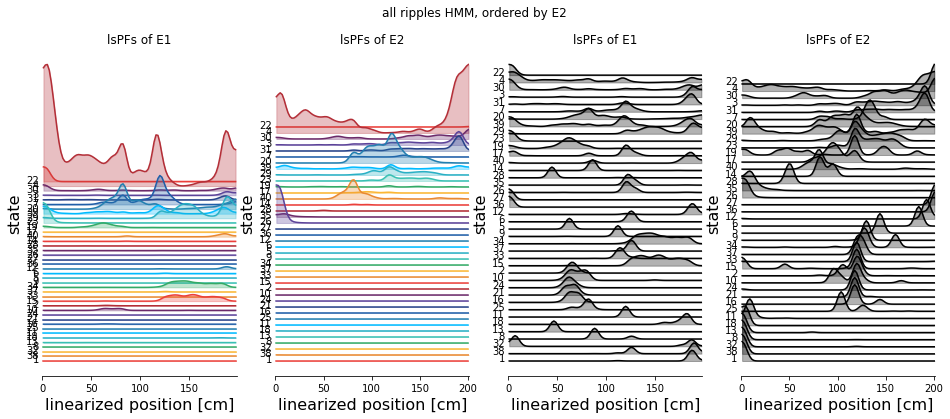

In [77]:
import copy

sigma_tc = 4

tcE1 = copy.deepcopy(lsPF1d_E1.smooth(sigma=sigma_tc))
tcE2 = copy.deepcopy(lsPF1d_E2.smooth(sigma=sigma_tc))

ordering = tcE2.get_peak_firing_order_ids()
tcE1.reorder_units_by_ids(ordering, inplace=True)
tcE2.reorder_units_by_ids(ordering, inplace=True)

bad_states = np.extract(tcE2.ratemap.sum(axis=1) < 0.5, tcE2.unit_ids)
good_states = np.extract(tcE2.ratemap.sum(axis=1) > 0.5, tcE2.unit_ids)
new_order = bad_states.tolist() + good_states.tolist()
tcE1.reorder_units_by_ids(neworder=new_order, inplace=True)
tcE2.reorder_units_by_ids(neworder=new_order, inplace=True)

with npl.palettes.color_palette(npl.colors.rainbow):
    with npl.FigureManager(show=True, ncols=4, figsize=(16, 6)) as (fig, axes):
        npl.utils.skip_if_no_output(fig)
        ax0, ax1, ax2, ax3 = axes
        
        npl.plot_tuning_curves1D(tcE1, ax=ax0, pad=5);
        ax0.set_xlabel('position [cm]')
        npl.utils.xticks_interval(50, ax0)
        ax0.set_xlabel('linearized position [cm]', size=16)
        ax0.set_ylabel('unit', size=16)
        ax0.set_title('lsPFs of E1')
        ax0.set_ylabel('state')
        
        npl.plot_tuning_curves1D(tcE2, ax=ax1, pad=5);
        ax1.set_xlabel('position [cm]')
        npl.utils.xticks_interval(50, ax1)
        ax1.set_xlabel('linearized position [cm]', size=16)
        ax1.set_ylabel('unit', size=16)
        ax1.set_title('lsPFs of E2')
        ax1.set_ylabel('state')
        
        npl.plot_tuning_curves1D(tcE1, ax=ax2, normalize=True, color='k');
        ax2.set_xlabel('position [cm]')
        npl.utils.xticks_interval(50, ax2)
        ax2.set_xlabel('linearized position [cm]', size=16)
        ax2.set_ylabel('unit', size=16)
        ax2.set_title('lsPFs of E1')
        ax2.set_ylabel('state')
        
        npl.plot_tuning_curves1D(tcE2, ax=ax3, normalize=True, color='k');
        ax3.set_xlabel('position [cm]')
        npl.utils.xticks_interval(50, ax3)
        ax3.set_xlabel('linearized position [cm]', size=16)
        ax3.set_ylabel('unit', size=16)
        ax3.set_title('lsPFs of E2')
        ax3.set_ylabel('state')
        
        fig.suptitle('all ripples HMM, ordered by E2')
        

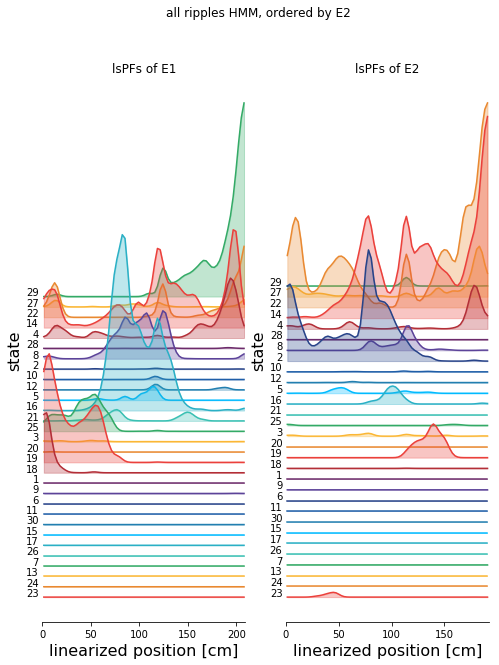

In [48]:
with npl.palettes.color_palette(npl.colors.rainbow):
    with npl.FigureManager(show=True, ncols=2, figsize=(8, 10)) as (fig, axes):
        npl.utils.skip_if_no_output(fig)
        ax0, ax1 = axes
        
        npl.plot_tuning_curves1D(tcE1, ax=ax0, pad=5);
        ax0.set_xlabel('position [cm]')
        npl.utils.xticks_interval(50, ax0)
        ax0.set_xlabel('linearized position [cm]', size=16)
        ax0.set_ylabel('unit', size=16)
        ax0.set_title('lsPFs of E1')
        ax0.set_ylabel('state')
        
        npl.plot_tuning_curves1D(tcE2, ax=ax1, pad=2.9);
        ax1.set_xlabel('position [cm]')
        npl.utils.xticks_interval(50, ax1)
        ax1.set_xlabel('linearized position [cm]', size=16)
        ax1.set_ylabel('unit', size=16)
        ax1.set_title('lsPFs of E2')
        ax1.set_ylabel('state')
        
        fig.suptitle('all ripples HMM, ordered by E2')
        

**Remark:** it is encouraging that the E1 representation looks qualitatively better than the E2 representation, although we did throw out the local candidates, which could explain the difference. However, 20 of the 22 local candidates were also remote candidates (of 36 total), so the remote representation also suffered, of course. **More importantly**, we _were_ able to learn a sensible model using _only_ the ripple events for which the E2 Bayesian approach would be pretty much useless.

### Next we attempt to identify remote replay using the residual E2 HMM
But on which sequences? We will try in (a) the remote candidates, for easy comparison, but also (b) all the nonlocal events events for a more realistic scenario (assuming we never had access to E1).

**NOTE:** since we are now back to testing events with which the nonlocal E2 HMM were nominally trained, we have to use cross-validation again. Not a big deal, but it dilutes our results a little, and makes it more difficult to show exactly what's going on...

In [124]:
bst

<BinnedSpikeTrainArray at 0x1706243e160: 74 units (41 segments) in 365 bins of width 20.0 milliseconds> for a total of 7.3 seconds

In [83]:
n_shuffles = 5000
k_folds = 5
verbose = 1

# score using transmat shuffle
scores, shuffled_scores, percentiles_trans = nel.analysis.replay.score_hmm_events(bst=bst, 
                                                                            num_states=num_states,
                                                                            n_shuffles=n_shuffles,
                                                                            k_folds=k_folds,
                                                                            shuffle='row-wise',
                                                                            verbose=verbose)

# score using time swap shuffle
scores, shuffled_scores, percentiles_tswap = nel.analysis.replay.score_hmm_events(bst=bst, 
                                                                            num_states=num_states,
                                                                            n_shuffles=n_shuffles,
                                                                            k_folds=k_folds,
                                                                            shuffle='timeswap',
                                                                            verbose=verbose)

  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5
  fold 1/5
  fold 2/5
  fold 3/5
  fold 4/5
  fold 5/5


In [125]:
len(percentiles_trans)

41

In [126]:
sig_threshold = 95
np.count_nonzero(percentiles_tswap > sig_threshold) / len(percentiles_tswap)

0.3902439024390244

In [127]:
np.corrcoef(percentiles_tswap, percentiles_trans)

array([[ 1.        ,  0.29171303],
       [ 0.29171303,  1.        ]])

In [128]:
sig_threshold = 99
np.count_nonzero(percentiles_trans > sig_threshold) / len(percentiles_trans)

0.1951219512195122

In [148]:
min_n_active = 4 # number of active cells in ripple
min_n_bins = 4   # number of 20 ms bins in ripple

n_active = []
for snippet in bst:
    n_active.append(snippet.n_active)
    
n_bins = []
for snippet in bst:
    n_bins.append(snippet.n_bins)
    
sig_threshold = 98
sig_threshold = 95
# remote_ids = np.array(nonlocal_ids)[percentiles_trans > sig_threshold]
remote_ids = np.array(min_crit_evt_ids)[(np.array(n_active) >= min_n_active) * (np.array(n_bins) >= min_n_bins) * percentiles_trans > sig_threshold]
print(remote_ids) # ids that were deemed remote significant by the nonlocal E2 HMM

sig_threshold = 97.5
sig_threshold = 95
remote_ids = np.array(min_crit_evt_ids)[(np.array(n_active) >= min_n_active) * (np.array(n_bins) >= min_n_bins) * percentiles_tswap > sig_threshold]
print(remote_ids) # ids that were deemed remote significant by the nonlocal E2 HMM

[  0  12  17  25  31  32  35  62  64  69  72  87 119 144 153 159]
[  0  12  17  25  35  43  64  65  69  72  92  99 119 144 150 159]


In [106]:
min_n_active = 5 # number of active cells in ripple
min_n_bins = 4   # number of 20 ms bins in ripple

n_active = []
for snippet in bst_nonlocal:
    n_active.append(snippet.n_active)
    
n_bins = []
for snippet in bst_nonlocal:
    n_bins.append(snippet.n_bins)
    
sig_threshold = 99
# remote_ids = np.array(nonlocal_ids)[percentiles_trans > sig_threshold]
remote_ids = np.array(nonlocal_ids)[(np.array(n_active) >= min_n_active) * (np.array(n_bins) >= min_n_bins) * percentiles_trans > sig_threshold]
print(remote_ids) # ids that were deemed remote significant by the nonlocal E2 HMM

sig_threshold = 99
remote_ids = np.array(nonlocal_ids)[(np.array(n_active) >= min_n_active) * (np.array(n_bins) >= min_n_bins) * percentiles_tswap > sig_threshold]
print(remote_ids) # ids that were deemed remote significant by the nonlocal E2 HMM

[ 25  46  57  64  72  83  90  94  99 119 144 159]
[ 25  43  46  57  62  64  65  72  83  90  99 144 159]


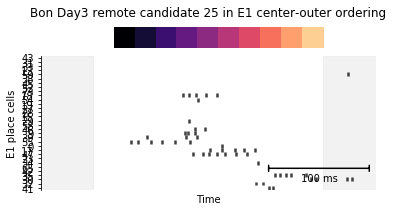

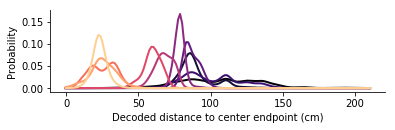

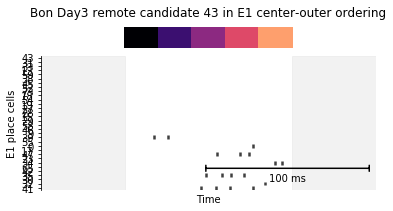

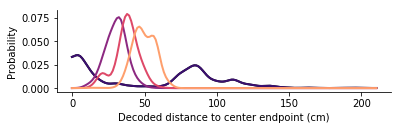

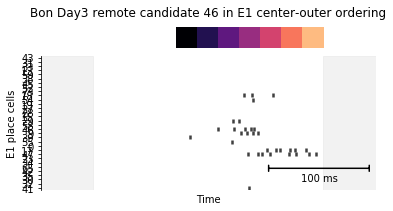

...

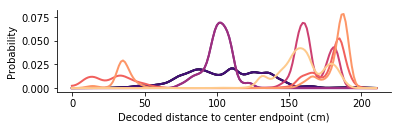

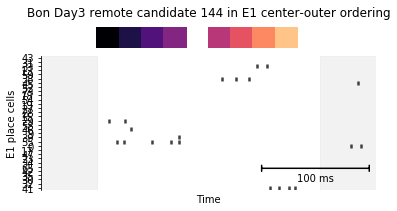

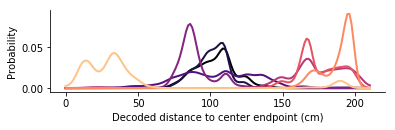

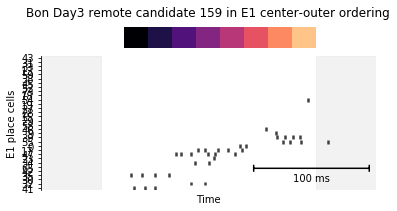

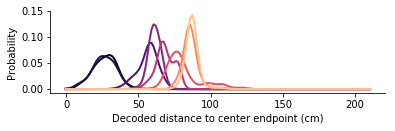

In [124]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import ListedColormap

E1a, E1b, E2 = 1, 3, 5
animal, day = 'Bon', 'Day3'

evt_idxs = remote_ids

for evt_idx in evt_idxs:
    evt_idx = int(evt_idx)
    bst = bst_all_swr[evt_idx]
    tc = data[animal][day]['tuning_curves1D_center'][E1b]
    evt_extent = bst.support
    plot_extent = evt_extent.expand(0.05)
    st = data[animal][day]['remote_replay_E1_in_E2']['st_placecells_remote'][plot_extent]
    peak_order = tc._unit_subset(st.unit_ids).get_peak_firing_order_ids()

    fig1, ax = plt.subplots(1, 1, figsize=(6, 3))
    ax = npl.rasterplot(st.reorder_units_by_ids(peak_order), vertstack=True, lw=2.5)
    npl.epochplot(plot_extent-evt_extent, hatch='', color='0.9')
    ax.set_xlim(*st.support.time)
    npl.add_scalebar(ax=ax, sizex=0.1, labelx='100 ms', hidey=False, hidex=False)
    npl.utils.clear_right()
    npl.utils.clear_top_bottom()
    plt.ylabel('E1 place cells')
    plt.xlabel('Time')
    # ymin, ymax = ax.get_ylim()
    posterior, lengths, mode_pth, mean_pth = nel.decoding.decode1D(bst=bst, ratemap=tc.smooth(sigma=4))
    # plt.plot(bst.bin_centers, mode_pth*ymax / tc.bin_centers[-1])

    divider = make_axes_locatable(ax)
    axBins = divider.append_axes("top", size=0.3, pad=0.1)

    bins = np.atleast_2d(posterior.sum(axis=0))
    non_empty_idx = np.argwhere(~np.isnan(bins))[:,1]
    n_non_empty = len(non_empty_idx)
    bins[:,non_empty_idx] = np.arange(n_non_empty)

    NUM_COLORS = n_non_empty
    cm = plt.get_cmap('magma')
    # cm = plt.get_cmap('jet')
    clist = [cm(1.*i/NUM_COLORS) for i in range(NUM_COLORS)]
    npl.set_palette(clist)
    nan_jet = ListedColormap(clist, name='nan_jet')

    axBins.pcolor(bst.bins, [0,1,], bins, cmap=nan_jet)
    axBins.set_xlim(ax.get_xlim())
    npl.utils.clear_left_right(axBins)
    npl.utils.clear_top_bottom(axBins)

    axBins.set_title('{} {} remote candidate {} in E1 center-outer ordering'.format(animal, day, evt_idx), y=1.2)
    plt.show()

    fig2, ax = plt.subplots(1, 1, figsize=(6, 1.5))
    for post in posterior.T:
        if not any(np.isnan(post)):
            plt.plot(tc.bin_centers, post, lw=2);
    plt.xlabel('Decoded distance to center endpoint (cm)')
    plt.ylabel('Probability')
    npl.utils.clear_right()
    npl.utils.clear_top()

    # npl.savefig('raster-{}a'.format(evt_idx), fig=fig1)
    # npl.savefig('raster-{}b'.format(evt_idx), fig=fig2)
    
    plt.show()

In [119]:
evt_idx

25

In [48]:
remote_ids = np.array(nonlocal_ids)[percentiles_tswap > sig_threshold]
remote_ids # ids that were deemed remote significant by the nonlocal E2 HMM

array([ 23,  25,  43,  46,  47,  57,  62,  64,  65,  72,  83,  90,  93,
        94,  96,  99, 106, 117, 119, 132, 133, 144, 145, 147, 153, 159])

In [252]:
remote_ids = np.array(nonlocal_ids)[percentiles > sig_threshold]
remote_ids # ids that were deemed remote significant by the nonlocal E2 HMM

array([  7,  23,  25,  46,  57,  64,  70,  72,  75,  83,  85,  86,  90,
        91,  93,  94,  99, 104, 107, 112, 115, 118, 119, 124, 133, 137,
       144, 145, 159])

In [251]:
remote_swr_ids # ids that were remote candidates (not necessarily signficicant) 19, 24, 27

array([  0,   2,   9,  12,  16,  20,  24,  28,  30,  33,  35,  38,  40,
        42,  44,  45,  48,  51,  55,  62,  69,  71,  73,  78,  83,  92,
        96,  99, 103, 114, 115, 118, 119, 120, 123, 128], dtype=int64)

In [256]:
set(remote_swr_ids) - set(local_swr_ids)

{24, 30, 38, 42, 44, 51, 55, 62, 73, 83, 96, 99, 114, 115, 118, 119}

In [255]:
np.array(nonlocal_ids)

array([  1,   3,   4,   5,   6,   7,   8,  10,  11,  13,  14,  15,  17,
        18,  19,  21,  22,  23,  24,  25,  26,  27,  29,  30,  31,  32,
        34,  36,  37,  38,  39,  41,  42,  43,  44,  46,  47,  49,  50,
        51,  52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,
        64,  65,  66,  67,  68,  70,  72,  73,  74,  75,  76,  77,  79,
        80,  81,  82,  83,  84,  85,  86,  88,  89,  90,  91,  93,  94,
        95,  96,  97,  98,  99, 101, 102, 104, 105, 106, 107, 108, 109,
       110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 121, 122, 124,
       125, 126, 127, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138,
       139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151,
       152, 153, 154, 155, 156, 157, 158, 159, 160, 161])

In [53]:
n_active = []
for snippet in bst_all_swr:
    n_active.append(snippet.n_active)

In [59]:
n_active = []
for snippet in bst_nonlocal:
    n_active.append(snippet.n_active)

In [74]:
sig_threshold = 95

In [75]:
remote_ids_ = np.array(nonlocal_ids)[(np.array(n_active) < 5) * percentiles_tswap > sig_threshold]
remote_ids_ # ids that were deemed remote significant by the nonlocal E2 HMM

# (np.array(n_active) < 5) * percentiles_trans

array([ 23,  47,  93,  96, 117, 133, 145])

In [75]:
bst_all_ripples

<BinnedSpikeTrainArray at 0x24e981055f8: 74 units (162 segments) in 833 bins of width 20.0 milliseconds> for a total of 16.66 seconds

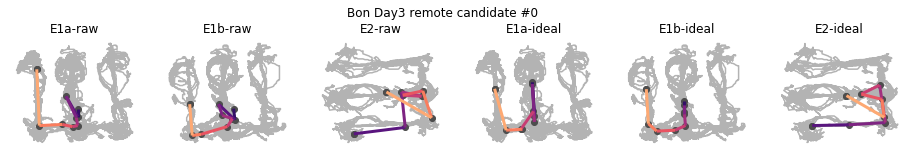

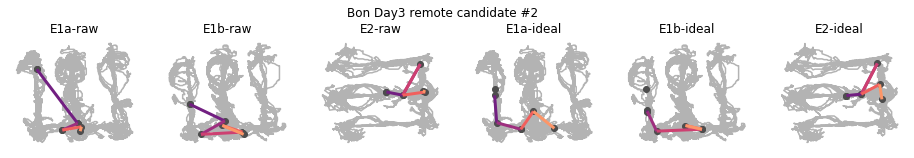

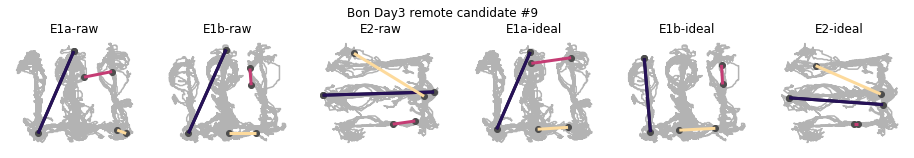

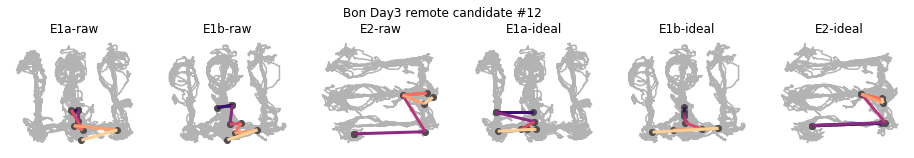

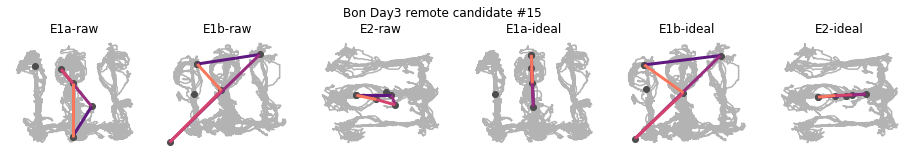

...

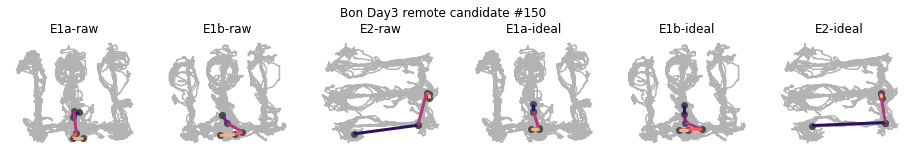

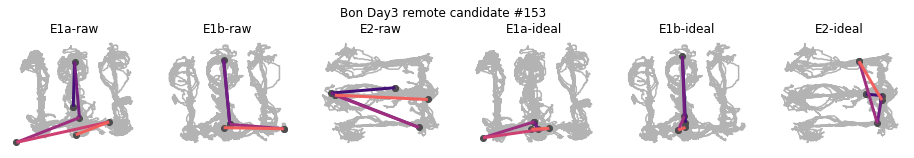

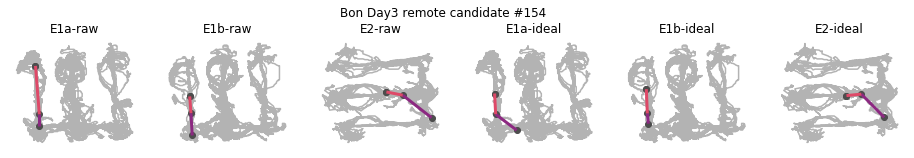

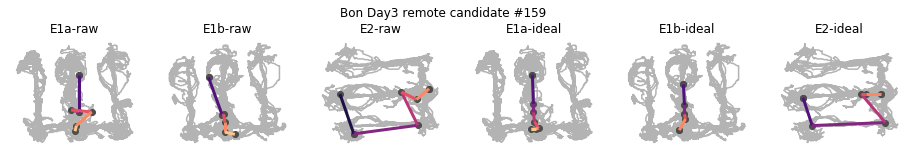

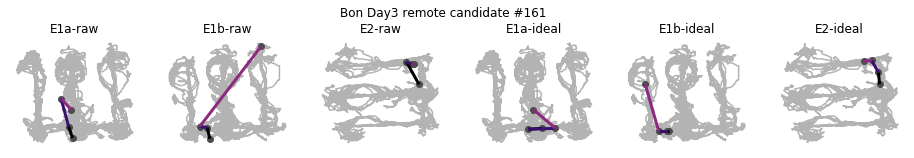

In [77]:
E1a, E1b, E2 = 1, 3, 5
def plot_all_remote_E2_events(data, animal, day):
    try:
#         bst = data[animal][day]['remote_replay_E1_in_E2']['bst_remote_candidates']
#         bst = bst_training
        bst = bst_all_ripples[candidate_ids]
    except KeyError:
        raise UserWarning('The (animal, day) pair does not have remote replay analysis results...')
        return
    
    tc_E1a = data[animal][day]['tuning_curves2D'][E1a]
    tc_E1b = data[animal][day]['tuning_curves2D'][E1b]
    tc_E2 = data[animal][day]['tuning_curves2D'][E2]
    
    tc_E1a_ideal = data[animal][day]['tuning_curves2D_ideal'][E1a]
    tc_E1b_ideal = data[animal][day]['tuning_curves2D_ideal'][E1b]
    tc_E2_ideal = data[animal][day]['tuning_curves2D_ideal'][E2]
    
    pos_E1a = data[animal][day]['pos'][E1a]
    pos_E1b = data[animal][day]['pos'][E1b]
    pos_E2 = data[animal][day]['pos'][E2]

    for idx in range(bst.n_epochs):
        fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize=(16, 2))
        axes = (ax1, ax2, ax3, ax4, ax5, ax6)
        
        posterior, lengths, mode_pth, mean_pth = nel.decoding.decode2D(bst=bst[idx], ratemap=tc_E1a)
        npl.plot2d(pos_E1a, color='0.7', ax=ax1)
        ax1.plot(mode_pth[0,:], mode_pth[1,:], 'o', color='0.3', markersize=6)
        npl.colorline(mode_pth[0,:], mode_pth[1,:], ax=ax1, cmap=plt.cm.magma, lw=3, cm_range=(0,1))
        ax1.set_title('E1a-raw')
        
        posterior, lengths, mode_pth, mean_pth = nel.decoding.decode2D(bst=bst[idx], ratemap=tc_E1b)
        npl.plot2d(pos_E1b, color='0.7', ax=ax2)
        ax2.plot(mode_pth[0,:], mode_pth[1,:], 'o', color='0.3', markersize=6)
        npl.colorline(mode_pth[0,:], mode_pth[1,:], ax=ax2, cmap=plt.cm.magma, lw=3, cm_range=(0,1))
        ax2.set_title('E1b-raw')
        
        posterior, lengths, mode_pth, mean_pth = nel.decoding.decode2D(bst=bst[idx], ratemap=tc_E2)
        npl.plot2d(pos_E2, color='0.7', ax=ax3)
        ax3.plot(mode_pth[0,:], mode_pth[1,:], 'o', color='0.3', markersize=6)
        npl.colorline(mode_pth[0,:], mode_pth[1,:], ax=ax3, cmap=plt.cm.magma, lw=3, cm_range=(0,1))
        ax3.set_title('E2-raw')
        
        posterior, lengths, mode_pth, mean_pth = nel.decoding.decode2D(bst=bst[idx], ratemap=tc_E1a_ideal)
        npl.plot2d(pos_E1a, color='0.7', ax=ax4)
        ax4.plot(mode_pth[0,:], mode_pth[1,:], 'o', color='0.3', markersize=6)
        npl.colorline(mode_pth[0,:], mode_pth[1,:], ax=ax4, cmap=plt.cm.magma, lw=3, cm_range=(0,1))
        ax4.set_title('E1a-ideal')
        
        posterior, lengths, mode_pth, mean_pth = nel.decoding.decode2D(bst=bst[idx], ratemap=tc_E1b_ideal)
        npl.plot2d(pos_E1b, color='0.7', ax=ax5)
        ax5.plot(mode_pth[0,:], mode_pth[1,:], 'o', color='0.3', markersize=6)
        npl.colorline(mode_pth[0,:], mode_pth[1,:], ax=ax5, cmap=plt.cm.magma, lw=3, cm_range=(0,1))
        ax5.set_title('E1b-ideal')

        posterior, lengths, mode_pth, mean_pth = nel.decoding.decode2D(bst=bst[idx], ratemap=tc_E2_ideal)
        npl.plot2d(pos_E2, color='0.7', ax=ax6)
        ax6.plot(mode_pth[0,:], mode_pth[1,:], 'o', color='0.3', markersize=6)
        npl.colorline(mode_pth[0,:], mode_pth[1,:], ax=ax6, cmap=plt.cm.magma, lw=3, cm_range=(0,1))
        ax6.set_title('E2-ideal')
        
        fig.suptitle('{} {} remote candidate #{}'.format(animal, day, candidate_ids[idx]), y=1.1)
        
        for ax in axes:
            npl.utils.clear_left_right(ax)
            npl.utils.clear_top_bottom(ax)
            
        plt.show()
        
#         if idx in [0,2,13,16]:
#             npl.savefig('traj-{}'.format(idx), fig=fig)
        
plot_all_remote_E2_events(data=data, 
                          animal=animal,
                          day=day)

In [86]:
n_shuffles = 100
# now let's score some events:
bst = data[animal][day]['remote_replay_E1_in_E2']['bst_remote_candidates']

# log prob under HMM with time swap
print('time swap shuffle...')
scores_logprob, scores_tswap_hmm = nel.analysis.replay.score_hmm_timeswap_shuffle(bst=bst, hmm=hmm, n_shuffles=n_shuffles)

# log prob under HMM with transmat shuffle
print('transition matrix shuffle...')
scores_logprob, scores_tmat_shuffled = nel.analysis.replay.score_hmm_transmat_shuffle(bst=bst, hmm=hmm, n_shuffles=n_shuffles)

print('Done!')

time swap shuffle...
transition matrix shuffle...
Done!


Text(0.5,1,'16: RUN model')

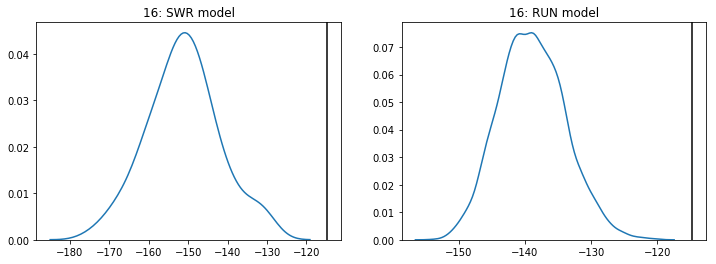

In [97]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

evt_idx = 16
sns.distplot(scores_tswap_hmm[:,evt_idx], hist=False, ax=ax1)
ax1.vlines(scores_logprob[evt_idx], 0,1)
ax1.set_title('{}: SWR model'.format(evt_idx))

sns.distplot(tswap[:,evt_idx], hist=False, ax=ax2)
ax2.vlines(scores[evt_idx], 0,1)
ax2.set_title('{}: RUN model'.format(evt_idx))

### Augment data dict with HMMs, and with scoring results [first remote, then local]

In [101]:
n_shuffles = 10000

for animal, day in sessions:
    print(animal, day)
    
    try:
        bst = data[animal][day]['remote_replay_E1_in_E2']['bst_remote_candidates']
    except KeyError:
        print('The (animal, day) pair does not have remote replay analysis results; skipping...')
        continue
        
    run_epochs = data[animal][day]['run_epochs']
    ripple_epochs = data[animal][day]['ripple_epochs']
    
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        st = data[animal][day]['spikes'][[1,3],:] # combine E1a and E1b

    if st.isempty: # this is true for Fra Day3 epoch 0
        pass
    else:
        # get spiketrain during run bouts for epoch
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            st_run_no_ripples = st[run_epochs][~ripple_epochs]
            st_ripples = st[ripple_epochs]

        # train HMM on E1 combined run data [excluding ripples]
        bst_training = st_run_no_ripples.bin(ds=ds_HMM)
        hmm = nel.hmmutils.PoissonHMM(n_components=num_states, verbose=False, n_iter=50)
        print('training RUN HMM...')
        hmm.fit(bst_training)
        data[animal][day]['HMM_E1'] = hmm
        
        # train HMM on E1 combined ripple data
        bst_training = st_ripples.bin(ds=ds_SWR)
        hmm_swr = nel.hmmutils.PoissonHMM(n_components=num_states, verbose=False, n_iter=50)
        print('training SWR HMM...')
        hmm_swr.fit(bst_training)
        data[animal][day]['HMM_SWR_E1'] = hmm_swr
        
        # score events
        bst = data[animal][day]['remote_replay_E1_in_E2']['bst_remote_candidates']
        
        print('time swap shuffle...')
        scores_logprob, scores_tswap_hmm = nel.analysis.replay.score_hmm_timeswap_shuffle(bst=bst, hmm=hmm, n_shuffles=n_shuffles)

        # log prob under HMM with transmat shuffle
        print('transition matrix shuffle...')
        scores_logprob, scores_tmat_shuffled = nel.analysis.replay.score_hmm_transmat_shuffle(bst=bst, hmm=hmm, n_shuffles=n_shuffles)
        
        data[animal][day]['remote_replay_E1_in_E2']['logprobs'] = scores_logprob
        data[animal][day]['remote_replay_E1_in_E2']['scores_tswap_hmm'] = scores_tswap_hmm
        data[animal][day]['remote_replay_E1_in_E2']['scores_tmat_shuffled'] = scores_tmat_shuffled
        
        # score events using SWR model
        bst = data[animal][day]['remote_replay_E1_in_E2']['bst_remote_candidates']
        
        print('time swap shuffle for SWR model...')
        scores_logprob_swr, scores_tswap_hmm_swr = nel.analysis.replay.score_hmm_timeswap_shuffle(bst=bst, hmm=hmm_swr, n_shuffles=n_shuffles)

        # log prob under HMM with transmat shuffle
        print('transition matrix shuffle for SWR model...')
        scores_logprob_swr, scores_tmat_shuffled_swr = nel.analysis.replay.score_hmm_transmat_shuffle(bst=bst, hmm=hmm_swr, n_shuffles=n_shuffles)
        
        data[animal][day]['remote_replay_E1_in_E2']['logprobs_swr'] = scores_logprob_swr
        data[animal][day]['remote_replay_E1_in_E2']['scores_tswap_hmm_swr'] = scores_tswap_hmm_swr
        data[animal][day]['remote_replay_E1_in_E2']['scores_tmat_shuffled_swr'] = scores_tmat_shuffled_swr


Bon Day2
training RUN HMM...
training SWR HMM...
time swap shuffle...
transition matrix shuffle...
time swap shuffle for SWR model...
transition matrix shuffle for SWR model...
Bon Day3
training RUN HMM...
training SWR HMM...
time swap shuffle...
transition matrix shuffle...
time swap shuffle for SWR model...
transition matrix shuffle for SWR model...
Bon Day4
training RUN HMM...
training SWR HMM...
time swap shuffle...
transition matrix shuffle...
time swap shuffle for SWR model...
transition matrix shuffle for SWR model...
Bon Day5
training RUN HMM...
training SWR HMM...
time swap shuffle...
transition matrix shuffle...
time swap shuffle for SWR model...
transition matrix shuffle for SWR model...
Bon Day6
training RUN HMM...
training SWR HMM...
time swap shuffle...
transition matrix shuffle...
time swap shuffle for SWR model...
transition matrix shuffle for SWR model...
Bon Day7
training RUN HMM...
training SWR HMM...
time swap shuffle...
transition matrix shuffle...
time swap shuffl

In [102]:
n_shuffles = 10000

for animal, day in sessions:
    print(animal, day)
    
    try:
        bst = data[animal][day]['remote_replay_E1_in_E2']['bst_local_candidates']
    except KeyError:
        print('The (animal, day) pair does not have remote replay analysis results; skipping...')
        continue
        
    run_epochs = data[animal][day]['run_epochs']
    ripple_epochs = data[animal][day]['ripple_epochs']
    
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        st = data[animal][day]['spikes'][[5],:] # use E2

    if st.isempty: # this is true for Fra Day3 epoch 0
        pass
    else:
        # get spiketrain during run bouts for epoch
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            st_run_no_ripples = st[run_epochs][~ripple_epochs]
            st_ripples = st[ripple_epochs]

        # train HMM on E2 run data [excluding ripples]
        bst_training = st_run_no_ripples.bin(ds=ds_HMM)
        # train HMM on E1 combined run data [excluding ripples]
        hmm = nel.hmmutils.PoissonHMM(n_components=num_states, verbose=False, n_iter=50)
        print('training HMM...')
        hmm.fit(bst_training)
        data[animal][day]['HMM_E2'] = hmm
        
        # train HMM on E1 combined ripple data
        bst_training = st_ripples.bin(ds=ds_SWR)
        hmm_swr = nel.hmmutils.PoissonHMM(n_components=num_states, verbose=False, n_iter=50)
        print('training SWR HMM...')
        hmm_swr.fit(bst_training)
        data[animal][day]['HMM_SWR_E2'] = hmm_swr
        
        # score events
        bst = data[animal][day]['remote_replay_E1_in_E2']['bst_local_candidates']
        
        print('time swap shuffle...')
        scores_logprob, scores_tswap_hmm = nel.analysis.replay.score_hmm_timeswap_shuffle(bst=bst, hmm=hmm, n_shuffles=n_shuffles)

        # log prob under HMM with transmat shuffle
        print('transition matrix shuffle...')
        scores_logprob, scores_tmat_shuffled = nel.analysis.replay.score_hmm_transmat_shuffle(bst=bst, hmm=hmm, n_shuffles=n_shuffles)
        
        data[animal][day]['remote_replay_E1_in_E2']['logprobs_local'] = scores_logprob
        data[animal][day]['remote_replay_E1_in_E2']['scores_tswap_hmm_local'] = scores_tswap_hmm
        data[animal][day]['remote_replay_E1_in_E2']['scores_tmat_shuffled_local'] = scores_tmat_shuffled
        
        # score events using SWR model
        bst = data[animal][day]['remote_replay_E1_in_E2']['bst_local_candidates']
        
        print('time swap shuffle for SWR model...')
        scores_logprob_swr, scores_tswap_hmm_swr = nel.analysis.replay.score_hmm_timeswap_shuffle(bst=bst, hmm=hmm_swr, n_shuffles=n_shuffles)

        # log prob under HMM with transmat shuffle
        print('transition matrix shuffle for SWR model...')
        scores_logprob_swr, scores_tmat_shuffled_swr = nel.analysis.replay.score_hmm_transmat_shuffle(bst=bst, hmm=hmm_swr, n_shuffles=n_shuffles)
        
        data[animal][day]['remote_replay_E1_in_E2']['logprobs_local_swr'] = scores_logprob_swr
        data[animal][day]['remote_replay_E1_in_E2']['scores_tswap_hmm_local_swr'] = scores_tswap_hmm_swr
        data[animal][day]['remote_replay_E1_in_E2']['scores_tmat_shuffled_local_swr'] = scores_tmat_shuffled_swr


Bon Day2
training HMM...
training SWR HMM...
time swap shuffle...
transition matrix shuffle...
time swap shuffle for SWR model...
transition matrix shuffle for SWR model...
Bon Day3
training HMM...
training SWR HMM...
time swap shuffle...
transition matrix shuffle...
time swap shuffle for SWR model...
transition matrix shuffle for SWR model...
Bon Day4
training HMM...
training SWR HMM...
time swap shuffle...
transition matrix shuffle...
time swap shuffle for SWR model...
transition matrix shuffle for SWR model...
Bon Day5
training HMM...
training SWR HMM...
time swap shuffle...
transition matrix shuffle...
time swap shuffle for SWR model...
transition matrix shuffle for SWR model...
Bon Day6
training HMM...
training SWR HMM...
time swap shuffle...
transition matrix shuffle...
time swap shuffle for SWR model...
transition matrix shuffle for SWR model...
Bon Day7
training HMM...
training SWR HMM...
time swap shuffle...
transition matrix shuffle...
time swap shuffle for SWR model...
trans

### Augment data dict with VTCs/LSPFs

In [98]:
ds_HMM = 0.125
ds_25ms = 0.025

In [ ]:
sigma_spk = 0.3 # 300 ms spike smoothing

for animal, day in sessions:
    print(animal, day)
    
    try:
        hmmE1 = data[animal][day]['HMM_E1']
        hmmE2 = data[animal][day]['HMM_E2']
    except KeyError:
        print('The (animal, day) pair does not have an HMM; skipping...')
        continue
        
    run_epochs = data[animal][day]['run_epochs']
    ripple_epochs = data[animal][day]['ripple_epochs']
    
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        st = data[animal][day]['spikes'][[1,3],:] # use E1 and E3 combined

    if st.isempty: # this is true for Fra Day3 epoch 0
        pass
    else:
        # get spiketrain during run bouts for epoch
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            st_run_no_ripples = st[run_epochs][~ripple_epochs]
            
        # smooth and re-bin:
        bst = st_run_no_ripples.bin(ds=ds_25ms).smooth(sigma=sigma_spk, inplace=True).rebin(w=ds_HMM/ds_25ms)

        # we use the idealized position (2D) to learn the place fields...
        pos = append_ASAs(data[animal][day]['pos_ideal'][1], data[animal][day]['pos_ideal'][3])
        
        vtc2d = get_vtc2d(hmm=hmmE1, bst=bst, pos=pos)     
        data[animal][day]['VTC_E1'] = vtc2d
        
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        st = data[animal][day]['spikes'][[5],:] # use E2

    if st.isempty: # this is true for Fra Day3 epoch 0
        pass
    else:
        # get spiketrain during run bouts for epoch
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            st_run_no_ripples = st[run_epochs][~ripple_epochs]
            
        # smooth and re-bin:
        bst = st_run_no_ripples.bin(ds=ds_25ms).smooth(sigma=sigma_spk, inplace=True).rebin(w=ds_HMM/ds_25ms)

        # we use the idealized position (2D) to learn the place fields...
        pos = data[animal][day]['pos_ideal'][5]
        
        vtc2d = get_vtc2d(hmm=hmmE2, bst=bst, pos=pos)     
        data[animal][day]['VTC_E2'] = vtc2d

### Augment data dict with HMM event p-vals

In [40]:
from scipy import stats

for animal, day in sessions:
    print(animal, day)
    
    try:
        bst = data[animal][day]['remote_replay_E1_in_E2']['bst_local_candidates']
    except KeyError:
        print('The (animal, day) pair does not have remote replay analysis results; skipping...')
        continue
        
    try:
        scores = data[animal][day]['remote_replay_E1_in_E2']['logprobs']
        shuffle_dists = data[animal][day]['remote_replay_E1_in_E2']['scores_tswap_hmm'].T

        pvals = []
        for score, shuffle_dist in zip(scores, shuffle_dists):
            pval = (100 - stats.percentileofscore(shuffle_dist, score)) / 100
            pvals.append(pval)

        data[animal][day]['remote_replay_E1_in_E2']['pvals_remote_hmm'] = np.array(pvals)

        scores_swr = data[animal][day]['remote_replay_E1_in_E2']['logprobs_swr']
        shuffle_dists_swr = data[animal][day]['remote_replay_E1_in_E2']['scores_tswap_hmm_swr'].T

        pvals_swr = []
        for score, shuffle_dist in zip(scores_swr, shuffle_dists_swr):
            pval = (100 - stats.percentileofscore(shuffle_dist, score)) / 100
            pvals_swr.append(pval)

        data[animal][day]['remote_replay_E1_in_E2']['pvals_remote_hmm_swr'] = np.array(pvals_swr)
    except:
        pass
    try:
        scores = data[animal][day]['remote_replay_E1_in_E2']['logprobs_local']
        shuffle_dists = data[animal][day]['remote_replay_E1_in_E2']['scores_tswap_hmm_local'].T

        pvals = []
        for score, shuffle_dist in zip(scores, shuffle_dists):
            pval = (100 - stats.percentileofscore(shuffle_dist, score)) / 100
            pvals.append(pval)

        data[animal][day]['remote_replay_E1_in_E2']['pvals_local_hmm'] = np.array(pvals)
        
        scores_swr = data[animal][day]['remote_replay_E1_in_E2']['logprobs_local_swr']
        shuffle_dists_swr = data[animal][day]['remote_replay_E1_in_E2']['scores_tswap_hmm_local_swr'].T

        pvals_swr = []
        for score, shuffle_dist in zip(scores_swr, shuffle_dists_swr):
            pval = (100 - stats.percentileofscore(shuffle_dist, score)) / 100
            pvals_swr.append(pval)

        data[animal][day]['remote_replay_E1_in_E2']['pvals_local_hmm_swr'] = np.array(pvals_swr)
        
    except:
        pass
    


Bon Day2
Bon Day3
Bon Day4
Bon Day5
Bon Day6
Bon Day7
Bon Day8
Bon Day9
Con Day0
The (animal, day) pair does not have remote replay analysis results; skipping...
Con Day1
The (animal, day) pair does not have remote replay analysis results; skipping...
Con Day2
The (animal, day) pair does not have remote replay analysis results; skipping...
Con Day3
Con Day4
Con Day5
Fra Day1
Fra Day2
The (animal, day) pair does not have remote replay analysis results; skipping...
Fra Day3
The (animal, day) pair does not have remote replay analysis results; skipping...
Fra Day4
The (animal, day) pair does not have remote replay analysis results; skipping...
Fra Day5
Fra Day6
The (animal, day) pair does not have remote replay analysis results; skipping...
Fra Day7
Fra Day8
Fra Day9
Fra Day10
Fra Day11


In [49]:
n_sig_local = 0
n_tot_local = 0

n_sig_remote = 0
n_tot_remote = 0

for animal, day in sessions:
    try:
        # local
        x = data[animal][day]['remote_replay_E1_in_E2']['pvals_local_candidates']
        n_sig_local += np.count_nonzero(x<0.05)
        n_tot_local += len(x)
        # remote
        x = data[animal][day]['remote_replay_E1_in_E2']['pvals_remote_candidates']
        n_sig_remote += np.count_nonzero(x<0.05)
        n_tot_remote += len(x)
    except KeyError:
        continue

print('{} of {} ({:1.1f}%) candidate replay events showed statistically significant replay (P < 0.05) of environment 1 when rats were located in environment 2.'.format(n_sig_remote, n_tot_remote, n_sig_remote/n_tot_remote*100))
print('\nAs expected, there were also many replays of environment 2; {} of {} ({:1.1f}%) candidate events were significant.'.format(n_sig_local, n_tot_local, n_sig_local/n_tot_local*100))


270 of 623 (43.3%) candidate replay events showed statistically significant replay (P < 0.05) of environment 1 when rats were located in environment 2.

As expected, there were also many replays of environment 2; 101 of 424 (23.8%) candidate events were significant.


In [48]:
n_sig_local = 0
n_tot_local = 0

n_sig_remote = 0
n_tot_remote = 0

for animal, day in sessions:
    try:
        # local
        x = data[animal][day]['remote_replay_E1_in_E2']['pvals_local_hmm']
        n_sig_local += np.count_nonzero(x<0.05)
        n_tot_local += len(x)
        # remote
        x = data[animal][day]['remote_replay_E1_in_E2']['pvals_remote_hmm']
        n_sig_remote += np.count_nonzero(x<0.05)
        n_tot_remote += len(x)
    except KeyError:
        continue

print('{} of {} ({:1.1f}%) candidate replay events showed statistically significant replay (P < 0.05) of environment 1 when rats were located in environment 2.'.format(n_sig_remote, n_tot_remote, n_sig_remote/n_tot_remote*100))
print('\nAs expected, there were also many replays of environment 2; {} of {} ({:1.1f}%) candidate events were significant.'.format(n_sig_local, n_tot_local, n_sig_local/n_tot_local*100))


191 of 623 (30.7%) candidate replay events showed statistically significant replay (P < 0.05) of environment 1 when rats were located in environment 2.

As expected, there were also many replays of environment 2; 85 of 424 (20.0%) candidate events were significant.


### correlate events statistically significant by both methods...

In [49]:
all_remote_pvals_hmm = []
all_remote_pvals_r2 = []

for animal, day in sessions:
    try:
        # remote
        x = data[animal][day]['remote_replay_E1_in_E2']['pvals_remote_hmm']
        all_remote_pvals_hmm = np.append(all_remote_pvals_hmm,x)
        x = data[animal][day]['remote_replay_E1_in_E2']['pvals_remote_candidates']
        all_remote_pvals_r2 = np.append(all_remote_pvals_r2,x)
    except KeyError:
        continue

In [50]:
hmmsig = set(np.argwhere(all_remote_pvals_hmm < 0.05).squeeze()) # maybe should consider 0.15

In [51]:
r2sig = set(np.argwhere(all_remote_pvals_r2 < 0.05).squeeze())

In [52]:
len(hmmsig.intersection(r2sig))

131

In [53]:
len(r2sig)

270

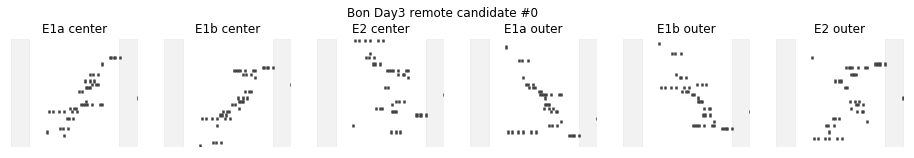

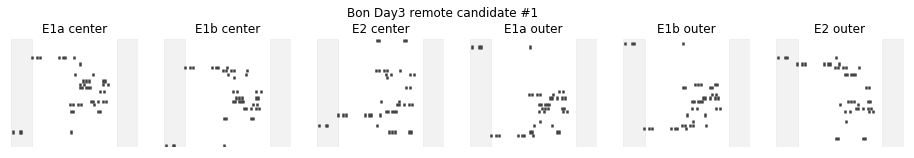

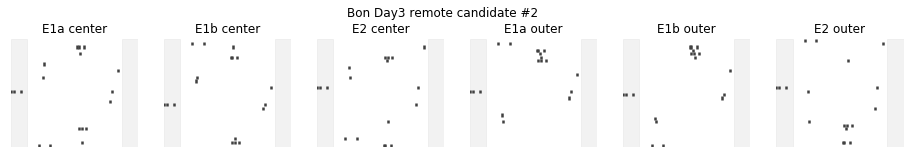

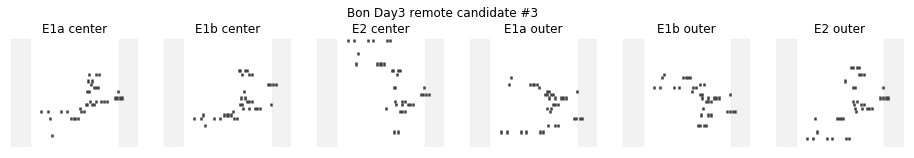

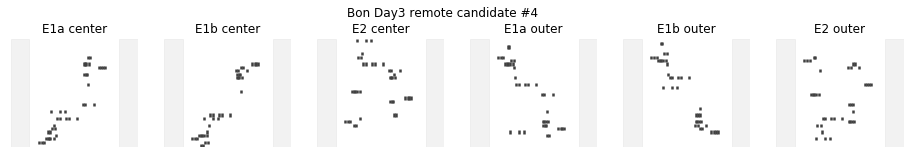

...

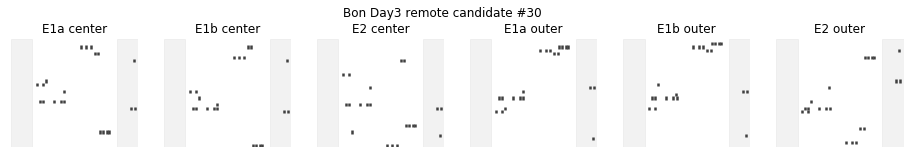

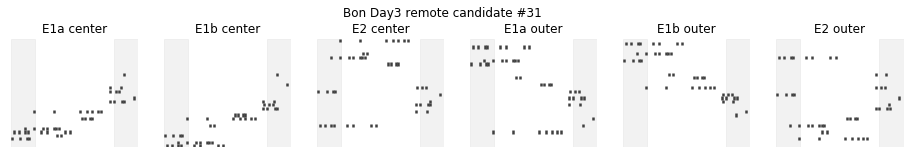

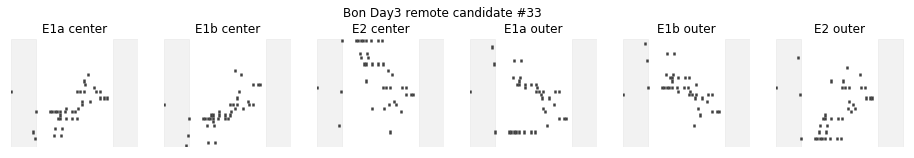

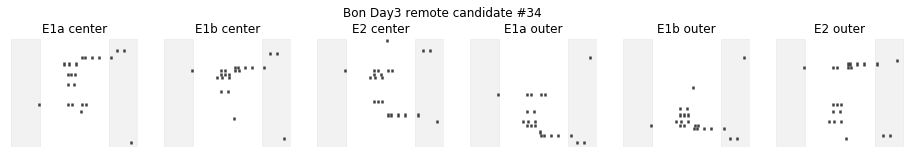

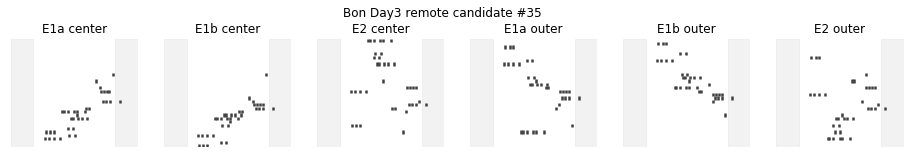

In [50]:
sig_thresh = 0.05

E1a, E1b, E2 = 1, 3, 5
animal = 'Bon'
day = 'Day3'

def plot_all_significant_linearized_E2_remote_events(data, animal, day):
    try:
        bst = data[animal][day]['remote_replay_E1_in_E2']['bst_remote_candidates']
    except KeyError:
        raise UserWarning('The (animal, day) pair does not have remote replay analysis results...')
        return
    
    tc_E1a_co = data[animal][day]['tuning_curves1D_center'][E1a]
    tc_E1b_co = data[animal][day]['tuning_curves1D_center'][E1b]
    tc_E2_co = data[animal][day]['tuning_curves1D_center'][E2]
    
    tc_E1a_oo = data[animal][day]['tuning_curves1D_outer'][E1a]
    tc_E1b_oo = data[animal][day]['tuning_curves1D_outer'][E1b]
    tc_E2_oo = data[animal][day]['tuning_curves1D_outer'][E2]
    
    pvals = data[animal][day]['remote_replay_E1_in_E2']['pvals_remote_hmm']
    sig_idx = np.argwhere(pvals < sig_thresh).squeeze().tolist()
    
    for evt_idx in sig_idx:
        fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize=(16, 2))
        axes = (ax1, ax2, ax3, ax4, ax5, ax6)
        
        evt = bst[evt_idx]
        evt_extent = evt.support
        plot_extent = evt_extent.expand(0.05)
        
        st = data[animal][day]['remote_replay_E1_in_E2']['st_placecells_remote'][plot_extent]
        
        peak_order = tc_E1a_co._unit_subset(st.unit_ids).get_peak_firing_order_ids()
        npl.rasterplot(st.reorder_units_by_ids(peak_order), vertstack=True, lw=2.5, ax=ax1)
        npl.epochplot(plot_extent-evt_extent, hatch='', color='0.9', ax=ax1)
        ax1.set_xlim(*st.support.time)
        ax1.set_title('E1a center')

        peak_order = tc_E1b_co._unit_subset(st.unit_ids).get_peak_firing_order_ids()
        npl.rasterplot(st.reorder_units_by_ids(peak_order), vertstack=True, lw=2.5, ax=ax2)
        npl.epochplot(plot_extent-evt_extent, hatch='', color='0.9', ax=ax2)
        ax2.set_xlim(*st.support.time)
        ax2.set_title('E1b center')
        
        peak_order = tc_E2_co._unit_subset(st.unit_ids).get_peak_firing_order_ids()
        npl.rasterplot(st.reorder_units_by_ids(peak_order), vertstack=True, lw=2.5, ax=ax3)
        npl.epochplot(plot_extent-evt_extent, hatch='', color='0.9', ax=ax3)
        ax3.set_xlim(*st.support.time)
        ax3.set_title('E2 center')

        peak_order = tc_E1a_oo._unit_subset(st.unit_ids).get_peak_firing_order_ids()
        npl.rasterplot(st.reorder_units_by_ids(peak_order), vertstack=True, lw=2.5, ax=ax4)
        npl.epochplot(plot_extent-evt_extent, hatch='', color='0.9', ax=ax4)
        ax4.set_xlim(*st.support.time)
        ax4.set_title('E1a outer')
        
        peak_order = tc_E1b_oo._unit_subset(st.unit_ids).get_peak_firing_order_ids()
        npl.rasterplot(st.reorder_units_by_ids(peak_order), vertstack=True, lw=2.5, ax=ax5)
        npl.epochplot(plot_extent-evt_extent, hatch='', color='0.9', ax=ax5)
        ax5.set_xlim(*st.support.time)
        ax5.set_title('E1b outer')
        
        peak_order = tc_E2_oo._unit_subset(st.unit_ids).get_peak_firing_order_ids()
        npl.rasterplot(st.reorder_units_by_ids(peak_order), vertstack=True, lw=2.5, ax=ax6)
        npl.epochplot(plot_extent-evt_extent, hatch='', color='0.9', ax=ax6)
        ax6.set_xlim(*st.support.time)
        ax6.set_title('E2 outer')
        
        fig.suptitle('{} {} remote candidate #{}'.format(animal, day, evt_idx), y=1.1)
        
        for ax in axes:
            npl.utils.clear_left_right(ax)
            npl.utils.clear_top_bottom(ax)
            
        plt.show()

plot_all_significant_linearized_E2_remote_events(data=data, 
                         animal=animal,
                         day=day)

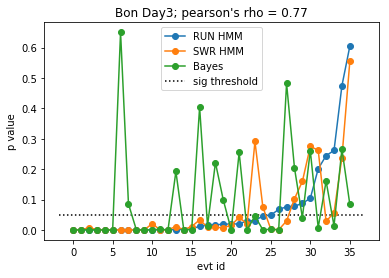

In [99]:
pvals_b = data[animal][day]['remote_replay_E1_in_E2']['pvals_remote_candidates']
pvals = data[animal][day]['remote_replay_E1_in_E2']['pvals_remote_hmm']
pvals_swr = data[animal][day]['remote_replay_E1_in_E2']['pvals_remote_hmm_swr']

sortorder = np.argsort(pvals)
pvals_swr = pvals_swr[sortorder]
pvals = pvals[sortorder]
pvals_b = pvals_b[sortorder]

plt.plot(pvals, 'o-')
plt.plot(pvals_swr, 'o-')
plt.plot(pvals_b, 'o-')
plt.ylabel('p value')
plt.xlabel('evt id')
plt.hlines(sig_thresh, *plt.gca().get_xlim(), linestyle=':')
rho = np.corrcoef(pvals, pvals_swr)[1,0]
plt.title("{} {}; pearson's rho = {:.2}".format(animal, day, rho))
plt.legend(['RUN HMM','SWR HMM', 'Bayes', 'sig threshold'])

In [89]:
np.corrcoef(pvals>0.05, pvals_b>0.05)[1,0]

0.30844389811025757

In [91]:
np.corrcoef(pvals_swr>0.05, pvals>0.05)[1,0]

0.64450338663548978

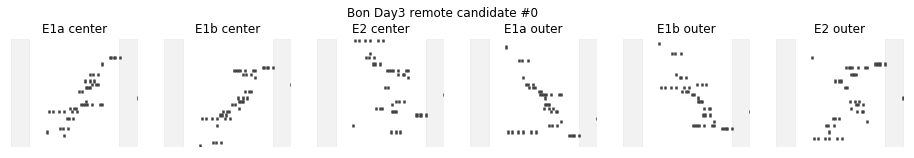

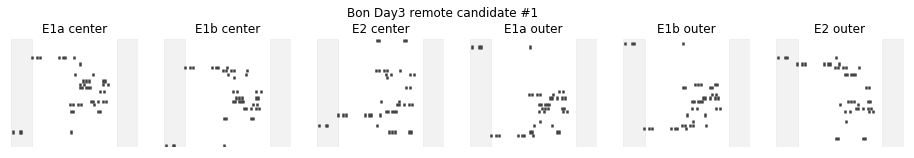

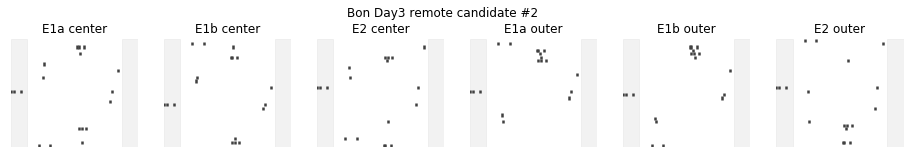

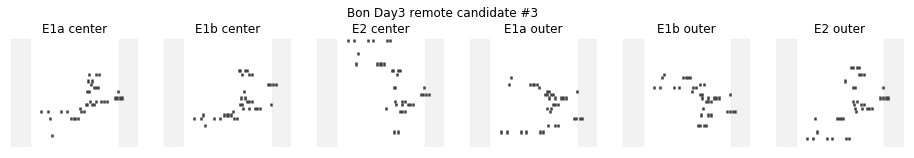

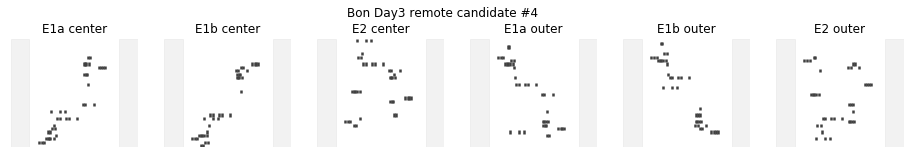

...

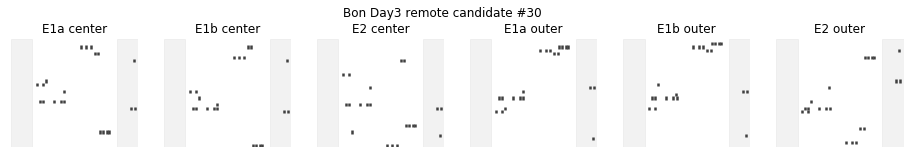

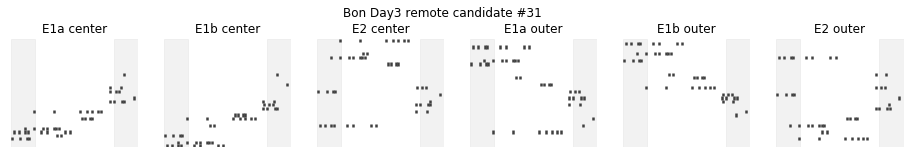

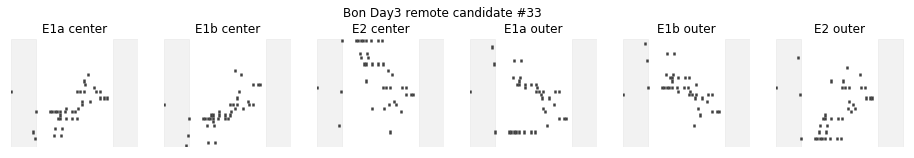

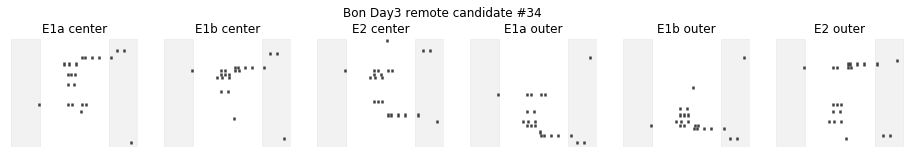

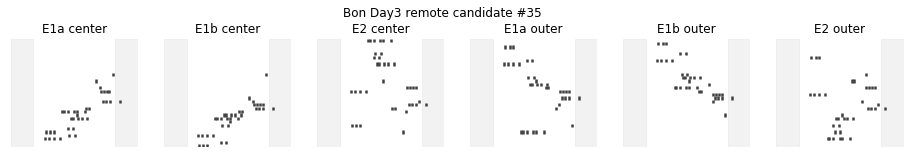

In [51]:
sig_thresh = 0.05

E1a, E1b, E2 = 1, 3, 5
animal = 'Bon'
day = 'Day3'

def plot_all_significant_linearized_E2_remote_events_swr(data, animal, day):
    try:
        bst = data[animal][day]['remote_replay_E1_in_E2']['bst_remote_candidates']
    except KeyError:
        raise UserWarning('The (animal, day) pair does not have remote replay analysis results...')
        return
    
    tc_E1a_co = data[animal][day]['tuning_curves1D_center'][E1a]
    tc_E1b_co = data[animal][day]['tuning_curves1D_center'][E1b]
    tc_E2_co = data[animal][day]['tuning_curves1D_center'][E2]
    
    tc_E1a_oo = data[animal][day]['tuning_curves1D_outer'][E1a]
    tc_E1b_oo = data[animal][day]['tuning_curves1D_outer'][E1b]
    tc_E2_oo = data[animal][day]['tuning_curves1D_outer'][E2]
    
    pvals = data[animal][day]['remote_replay_E1_in_E2']['pvals_remote_hmm_swr']
    sig_idx = np.argwhere(pvals < sig_thresh).squeeze().tolist()
    
    for evt_idx in sig_idx:
        fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize=(16, 2))
        axes = (ax1, ax2, ax3, ax4, ax5, ax6)
        
        evt = bst[evt_idx]
        evt_extent = evt.support
        plot_extent = evt_extent.expand(0.05)
        
        st = data[animal][day]['remote_replay_E1_in_E2']['st_placecells_remote'][plot_extent]
        
        peak_order = tc_E1a_co._unit_subset(st.unit_ids).get_peak_firing_order_ids()
        npl.rasterplot(st.reorder_units_by_ids(peak_order), vertstack=True, lw=2.5, ax=ax1)
        npl.epochplot(plot_extent-evt_extent, hatch='', color='0.9', ax=ax1)
        ax1.set_xlim(*st.support.time)
        ax1.set_title('E1a center')

        peak_order = tc_E1b_co._unit_subset(st.unit_ids).get_peak_firing_order_ids()
        npl.rasterplot(st.reorder_units_by_ids(peak_order), vertstack=True, lw=2.5, ax=ax2)
        npl.epochplot(plot_extent-evt_extent, hatch='', color='0.9', ax=ax2)
        ax2.set_xlim(*st.support.time)
        ax2.set_title('E1b center')
        
        peak_order = tc_E2_co._unit_subset(st.unit_ids).get_peak_firing_order_ids()
        npl.rasterplot(st.reorder_units_by_ids(peak_order), vertstack=True, lw=2.5, ax=ax3)
        npl.epochplot(plot_extent-evt_extent, hatch='', color='0.9', ax=ax3)
        ax3.set_xlim(*st.support.time)
        ax3.set_title('E2 center')

        peak_order = tc_E1a_oo._unit_subset(st.unit_ids).get_peak_firing_order_ids()
        npl.rasterplot(st.reorder_units_by_ids(peak_order), vertstack=True, lw=2.5, ax=ax4)
        npl.epochplot(plot_extent-evt_extent, hatch='', color='0.9', ax=ax4)
        ax4.set_xlim(*st.support.time)
        ax4.set_title('E1a outer')
        
        peak_order = tc_E1b_oo._unit_subset(st.unit_ids).get_peak_firing_order_ids()
        npl.rasterplot(st.reorder_units_by_ids(peak_order), vertstack=True, lw=2.5, ax=ax5)
        npl.epochplot(plot_extent-evt_extent, hatch='', color='0.9', ax=ax5)
        ax5.set_xlim(*st.support.time)
        ax5.set_title('E1b outer')
        
        peak_order = tc_E2_oo._unit_subset(st.unit_ids).get_peak_firing_order_ids()
        npl.rasterplot(st.reorder_units_by_ids(peak_order), vertstack=True, lw=2.5, ax=ax6)
        npl.epochplot(plot_extent-evt_extent, hatch='', color='0.9', ax=ax6)
        ax6.set_xlim(*st.support.time)
        ax6.set_title('E2 outer')
        
        fig.suptitle('{} {} remote candidate #{}'.format(animal, day, evt_idx), y=1.1)
        
        for ax in axes:
            npl.utils.clear_left_right(ax)
            npl.utils.clear_top_bottom(ax)
            
        plt.show()

plot_all_significant_linearized_E2_remote_events(data=data, 
                         animal=animal,
                         day=day)

Notes: 13 ran back and forth on center arm (good to show trajectory, since local is all messed up)

14 truly messed up in Bayesian, correctly rejected by SWR model

15 _could_ make sense

20 seems plausible

22 is good in ONLY E1a-raw

29, 30 are fails? 30 E1 outer could maybe work?

33 only bad in E1a-ideal



### Save augmented data

In [57]:
FrankLabData = nel.ResultsContainer(data=data,
                                    sessions=FrankLabData.sessions,
                                    cellinfo=FrankLabData.cellinfo,
                                    taskinfo=FrankLabData.taskinfo,
                                    tetinfo=FrankLabData.tetinfo,
                                    description=FrankLabData.description)

FrankLabData.save_pkl(fileroot + 'FrankLabData-BonConFra-no-eeg06d.nel')

To try:
- different training ds
- E1a and E1b seperately
- scaling of E2 SWR sequences?
- scaling Lambda mat?